# Environment Setup

# 1. Import Libraries

In [1]:
import re
import unicodedata
import nltk
import random
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from collections import Counter
import csv
random.seed(42)

print("All imports working!")

All imports working!


# 2. Data Loading

In [2]:
# Read text files from the local "dataset" folder

# YORUBA
with open('dataset/bot_data_yoruba.txt', 'r', encoding='utf-8') as f:
    bot_data_yoruba = f.read()
with open('dataset/human_data_yoruba.txt', 'r', encoding='utf-8') as f:
    human_data_yoruba = f.read()

# KASHMIRI
with open('dataset/bot_data_kashmiri.txt', 'r', encoding='utf-8') as f:
     bot_data_kashmiri = f.read()
with open('dataset/human_data_kashmiri.txt', 'r', encoding='utf-8') as f:
     human_data_kashmiri = f.read()

## 3. Text Summarization

In [3]:
def summarize_text(text, label="Text"):
    """
    Print a simple summary of the given text:
      1. Total word count
      2. First 20 words (as a preview)
    """
    # Split the text into words
    words = text.split()
    
    # Count total words
    num_words = len(words)
    print(f"{label} — Number of words: {num_words}")
    
    # Select the first 200 words for preview (or fewer, if the text is short)
    preview = words[:200]
    preview_str = " ".join(preview)
    print(f"{label} — First 200 words: {preview_str}\n")


# Example usage:

# Summarize the bot-generated Yoruba text
summarize_text(bot_data_yoruba, label="Bot-generated Yoruba")

# Summarize the human-written Yoruba text
summarize_text(human_data_yoruba, label="Human-written Yoruba")

# Summarize the bot-generated Kashmiri text
summarize_text(bot_data_kashmiri, label="Bot-generated Kashmiri")

# Summarize the human-written Kashmiri text
summarize_text(human_data_kashmiri, label="Human-written Kashmiri")

Bot-generated Yoruba — Number of words: 22096
Bot-generated Yoruba — First 200 words: Ní agbègbè Ìwrùn Nàìjíríà Yòrùbá ti dá ìtàn ìbíl kan tó gbooro plú èdè ìe ìsìn lítírés àti ìmò ojúsìn IléIf ìlú ìbíl tí wn gbà sí kèldá ni a kà sí kànàyà ìran Yòrùbá ib ni àgbélébú ìtànìbíl ti br plú Odùduwà Obàtálá rúnmìlà àti àwn irúnmòlé mìíràn Ní gbogbo àgbègbè tó lórí ìtàn YòrùbáÓyó Ìbàdàn Ìjbú Èkìtì Ègbáàwn aáájúòèlú atij àti onímìtàn ti da àfihàn ìtàn àwn ìjba ìrìnàjò ènìyàn ìbáep àti ìgbyàwó fún p grùnún dún péré ùgbn ìrìnàjò Yòrùbá ò dá síb nígbà dé àkókò ìjba òyìnbó àwn ba àti olóyè ti kk kojú ìàkóso alágbára Pńtí náà wn sì jíròrò láti pa àà m níwájú lyà àmdémáe dàgbà Àmdé ilé Yòrùbá tó ks ní DO Fágúnwà fi ìtàn Ògbójú d nínú Igbó Irúnmìlà hàn pé a lè lo èdè àtwdá àti àlàyé aáájú láti tsíwájú ìrètí àti ìfkànsìn Amos Tútùòlá tún fi The PalmWine Drinkard e àfihàn ìrìnàjò ìm kàn ní ayédèrú ìtànoníran Ní kànàyà Yòrùbá ni Ìwà Omolúàbì ìe rere ìforítì oòtó àìtànkárà inúrè àti ìbágb plú ìbáep òwò j 

# 4. Frequent Words Analysis

In [4]:
import re
from collections import Counter

# Define regex patterns for each language to keep only letters and spaces
PATTERNS = {
    'en':      r'[^a-z\s]',                             # English letters a–z
    'yoruba':  r'[^a-zàáâãèéêìíîòóôõùúûẹọṣń\s]',        # Yoruba letters + diacritics
    'kashmiri':r'[^\u0600-\u06FF\s]'                   # Kashmiri (Arabic script block)
}


def preprocess_text(text: str, language: str = 'en') -> list[str]:
    """
    Clean and tokenize text for the given language:
      1. Lowercase (no-op for scripts without case).
      2. Remove any character not in the language's alphabet.
      3. Split into tokens on whitespace.
    """
    # Lowercase the text (affects only Latin-based scripts)
    clean = text.lower()
    
    # Apply language-specific regex to strip unwanted characters
    pattern = PATTERNS.get(language, PATTERNS['en'])
    clean = re.sub(pattern, '', clean)
    
    # Split on whitespace to generate token list
    return clean.split()


def count_frequencies(tokens: list[str]) -> Counter:
    """
    Return a Counter mapping each token to its frequency.
    """
    return Counter(tokens)


def get_most_common(corpus_text: str, language: str = 'en', top_n: int = 50) -> list[tuple[str, int]]:
    """
    Compute and return the top N most common tokens in the text.
    """
    tokens = preprocess_text(corpus_text, language)
    freq = count_frequencies(tokens)
    return freq.most_common(top_n)


def find_frequent_words(text: str, threshold: int = 150) -> list[str]:
    """
    Identify and return words occurring at least `threshold` times in `text`.
    """
    # Split raw text (preserving original tokens)
    tokens = text.split()
    # Count occurrences of each token
    counts = Counter(tokens)
    # Select tokens whose count meets or exceeds threshold
    return [word for word, cnt in counts.items() if cnt >= threshold]


if __name__ == '__main__':
    # Load each dataset from files
    with open('dataset/human_data_yoruba.txt', encoding='utf-8') as f:
        human_data_yoruba = f.read()
    with open('dataset/human_data_kashmiri.txt', encoding='utf-8') as f:
        human_data_kashmiri = f.read()
    with open('dataset/bot_data_yoruba.txt', encoding='utf-8') as f:
        bot_data_yoruba = f.read()
    with open('dataset/bot_data_kashmiri.txt', encoding='utf-8') as f:
        bot_data_kashmiri = f.read()

    # Print top common words
    print('Top Human Yoruba words:', get_most_common(human_data_yoruba, language='yoruba'))
    print('Top Human Kashmiri words:', get_most_common(human_data_kashmiri, language='kashmiri'))
    print('Top Bot Yoruba words:',    get_most_common(bot_data_yoruba, language='yoruba'))
    print('Top Bot Kashmiri words:',  get_most_common(bot_data_kashmiri, language='kashmiri'))

    # Print words occurring at least 150 times in each corpus
    print('\nFrequent words (>=150 occurrences):')
    print('Human Yoruba:',  find_frequent_words(human_data_yoruba))
    print('Bot Yoruba:',    find_frequent_words(bot_data_yoruba))
    print('Human Kashmiri:',find_frequent_words(human_data_kashmiri))
    print('Bot Kashmiri:',  find_frequent_words(bot_data_kashmiri))

Top Human Yoruba words: [('si', 46870), ('o', 38146), ('ti', 35510), ('ni', 22489), ('rẹ', 21574), ('awọn', 21540), ('ati', 18684), ('ki', 15104), ('fun', 14138), ('li', 13587), ('a', 13415), ('wọn', 12262), ('nwọn', 12160), ('fi', 9947), ('mi', 9292), ('bi', 9261), ('ṣe', 8215), ('oluwa', 7966), ('ọmọ', 7388), ('ba', 7294), ('yio', 7164), ('kò', 7109), ('emi', 7018), ('pe', 6950), ('gbogbo', 6771), ('lati', 6616), ('na', 6368), ('ninu', 6240), ('iwọ', 5904), ('lọ', 5326), ('jẹ', 5174), ('wá', 4972), ('nyin', 4730), ('enia', 4513), ('le', 4488), ('ọlọrun', 4404), ('ara', 4373), ('i', 4296), ('wi', 4255), ('mu', 4211), ('nitori', 4210), ('ṣugbọn', 4084), ('ọ', 4065), ('kan', 4012), ('wa', 3955), ('ẹ', 3818), ('ẹnyin', 3571), ('yi', 3425), ('pẹlu', 3397), ('wipe', 3371)]
Top Human Kashmiri words: [('تہٕ', 3208), ('،', 1925), ('چھُ', 1808), ('منز', 1411), ('تہ', 1223), ('یہ', 977), ('و', 846), ('چھِ', 766), ('زِ', 717), ('۔', 693), ('چھے', 660), ('اوس', 569), ('ہُند', 529), ('پٮ۪ٹھ', 488)

# 5. Text Preprocessing

## 5.1 Stop Words and Diacritics Removal

In [5]:
# -*- coding: utf-8 -*-
"""
Pipeline for cleaning Yoruba and Kashmiri texts:
 1. Remove stop-wo rds
 2. Strip diacritics (Yoruba only)
 3. Preview first N words of cleaned output
"""
import unicodedata

# 1. Stop-word sets for Yoruba and Kashmiri
stopwords_yoruba = {
    'ó', 'ní', 'ṣe', 'rẹ̀', 'tí', 'àwọn', 'sí', 'ni', 'náà', 'láti',
    'kan', 'ti', 'ń', 'lọ', 'o', 'bí', 'padà', 'sì', 'wá', 'lè', 'wà',
    'kí', 'púpọ̀', 'mi', 'wọ́n', 'pẹ̀lú', 'a', 'ṣùgbọ́n', 'fún', 'jẹ́',
    'fẹ́', 'kò', 'jù', 'pé', 'é', 'gbogbo', 'inú', 'bẹ̀rẹ̀', 'jẹ',
    'ọjọ́', 'nítorí', 'nǹkan', 'sínú', 'ṣ', 'yìí', 'ṣé', 'àti', 'í',
    'máa', 'nígbà', 'mo', 'an', 'mọ̀', 'bá', 'kì', 'ńlá', 'ọ̀pọ̀lọpọ̀',
    'ẹmọ́', 'wọn', 'òun'
}
stopwords_kashmiri = {
    'تہٕ', 'چھُ', 'منز', 'تہ', 'یہ', 'و', 'چھِ', 'زِ', 'چھے', 'اوس',
    'ہُند', 'پٮ۪ٹھ', 'سٍتۍ', 'اکھ', 'مثنوی', 'چھہ', 'نہٕ', 'شاہ',
    'یا', 'سُہ', 'اَتھ', 'پٲٹھۍ', 'مگر', 'حضرت', 'ہٕنز', 'ہٕندۍ',
    'از', 'اَمہ'
}


def remove_stopwords(text: str, stopwords: set) -> str:
    """
    Remove tokens in `stopwords` from text and return cleaned string.
    """
    filtered = [word for word in text.split() if word not in stopwords]
    return ' '.join(filtered)


def remove_diacritics(text: str) -> str:
    """
    Strip all Unicode diacritic marks from the input string.
    """
    # Decompose characters (NFD), drop combining marks (Mn)
    return ''.join(
        ch for ch in unicodedata.normalize('NFD', text)
        if unicodedata.category(ch) != 'Mn'
    )


def load_text(path: str) -> str:
    """
    Read file at `path` and return its content as a string.
    """
    with open(path, 'r', encoding='utf-8') as f:
        return f.read()


def preview_text(text: str, num_words: int = 200) -> str:
    """
    Return the first `num_words` of `text` as a preview string.
    """
    words = text.split()
    return ' '.join(words[:num_words])



if __name__ == '__main__':
    # File paths for each dataset
    paths = {
        'yoruba_bot':     'dataset/bot_data_yoruba.txt',
        'yoruba_human':   'dataset/human_data_yoruba.txt',
        'kashmiri_bot':   'dataset/bot_data_kashmiri.txt',
        'kashmiri_human': 'dataset/human_data_kashmiri.txt'
    }

    # 1️⃣ Load raw texts
    texts = {k: load_text(p) for k, p in paths.items()}

    # 2️⃣ Remove stop-words
    no_stop = {
        'yoruba_bot':     remove_stopwords(texts['yoruba_bot'],   stopwords_yoruba),
        'yoruba_human':   remove_stopwords(texts['yoruba_human'], stopwords_yoruba),
        'kashmiri_bot':   remove_stopwords(texts['kashmiri_bot'],   stopwords_kashmiri),
        'kashmiri_human': remove_stopwords(texts['kashmiri_human'], stopwords_kashmiri),
    }

    # 3️⃣ Remove diacritics for Yoruba only
    cleaned = {
        'yoruba_bot':     remove_diacritics(no_stop['yoruba_bot']),
        'yoruba_human':   remove_diacritics(no_stop['yoruba_human']),
        'kashmiri_bot':   no_stop['kashmiri_bot'],
        'kashmiri_human': no_stop['kashmiri_human'],
    }

    # 4️⃣ Assign to variables
    cleaned_yoruba_bot     = cleaned['yoruba_bot']
    cleaned_yoruba_human   = cleaned['yoruba_human']
    cleaned_kashmiri_bot   = cleaned['kashmiri_bot']
    cleaned_kashmiri_human = cleaned['kashmiri_human']

    # 5️⃣ Print only the first 200 words of each cleaned text
    print("=== Yoruba Bot (first 200 words) ===")
    print(preview_text(cleaned_yoruba_bot, num_words=200), "\n")

    print("=== Yoruba Human (first 200 words) ===")
    print(preview_text(cleaned_yoruba_human, num_words=200), "\n")

    print("=== Kashmiri Bot (first 200 words) ===")
    print(preview_text(cleaned_kashmiri_bot, num_words=200), "\n")

    print("=== Kashmiri Human (first 200 words) ===")
    print(preview_text(cleaned_kashmiri_human, num_words=200), "\n")

=== Yoruba Bot (first 200 words) ===
Ni agbegbe Iwrun Naijiria Yoruba da itan ibil to gbooro plu ede ie isin litires imo ojusin IleIf ilu ibil wn gba kelda ka kanaya iran Yoruba ib agbelebu itanibil br plu Oduduwa Obatala runmila awn irunmole miiran Ni agbegbe to lori itan YorubaOyo Ibadan Ijbu Ekiti Egbaawn aaajuoelu atij onimitan da afihan itan awn ijba irinajo eniyan ibaep igbyawo p grunun dun pere ugbn irinajo Yoruba o da sib de akoko ijba oyinbo awn ba oloye kk koju iakoso alagbara Pnti wn jiroro pa aa m niwaju lya amdemae dagba Amde ile Yoruba to ks DO Fagunwa fi itan Ogboju d ninu Igbo Irunmila han lo ede atwda alaye aaaju tsiwaju ireti ifkansin Amos Tutuola tun fi The PalmWine Drinkard e afihan irinajo im kan ayederu itanoniran Ni kanaya Yoruba Iwa Omoluabi ie rere iforiti ooto aitankara inure ibagb plu ibaep owo j koko r Owe Yoruba wi Iwa loogo Iwa rere san ju wura itan agbalagba k mde e huwa niwn ilana itosna ikan Ninu aloapagba gg Ijapa Ikoko han imleara imura kun igbe akuny

## 5.2 Stemming

In [6]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

# 2. Initialize stemmer
stemmer = PorterStemmer()

# 3. Define a helper
def stem_text(text: str) -> str:
    tokens = word_tokenize(text)     # splits on punctuation, etc.
    stems  = [stemmer.stem(tok) for tok in tokens]
    return " ".join(stems)

# 4. Apply to each of your cleaned text
stemmed_yoruba_bot     = stem_text(cleaned_yoruba_bot)
stemmed_yoruba_human   = stem_text(cleaned_yoruba_human)
stemmed_kashmiri_bot   = stem_text(cleaned_kashmiri_bot)
stemmed_kashmiri_human = stem_text(cleaned_kashmiri_human)


def preview_text(text: str, num_words: int = 200) -> str:
    words = text.split()
    return " ".join(words[:num_words])



# Print first 200 words of each cleaned + stemmed doc, with spacing

print("Yoruba bot (stemmed):")
print(preview_text(stemmed_yoruba_bot, num_words=200), "\n")

print("Yoruba human (stemmed):")
print(preview_text(stemmed_yoruba_human, num_words=200), "\n")

print("Kashmiri bot (stemmed):")
print(preview_text(stemmed_kashmiri_bot, num_words=200), "\n")

print("Kashmiri human (stemmed):")
print(preview_text(stemmed_kashmiri_human, num_words=200), "\n")

Yoruba bot (stemmed):
ni agbegb iwrun naijiria yoruba da itan ibil to gbooro plu ede ie isin litir imo ojusin ileif ilu ibil wn gba kelda ka kanaya iran yoruba ib agbelebu itanibil br plu oduduwa obatala runmila awn irunmol miiran ni agbegb to lori itan yorubaoyo ibadan ijbu ekiti egbaawn aaajuoelu atij onimitan da afihan itan awn ijba irinajo eniyan ibaep igbyawo p grunun dun pere ugbn irinajo yoruba o da sib de akoko ijba oyinbo awn ba oloy kk koju iakoso alagbara pnti wn jiroro pa aa m niwaju lya amdema dagba amd ile yoruba to ks do fagunwa fi itan ogboju d ninu igbo irunmila han lo ede atwda alay aaaju tsiwaju ireti ifkansin amo tutuola tun fi the palmwin drinkard e afihan irinajo im kan ayederu itanoniran ni kanaya yoruba iwa omoluabi ie rere ifor ooto aitankara inur ibagb plu ibaep owo j koko r owe yoruba wi iwa loogo iwa rere san ju wura itan agbalagba k mde e huwa niwn ilana itosna ikan ninu aloapagba gg ijapa ikoko han imleara imura kun igb akunya ede yoruba kun owe oriki aloa

## 5.3 Yoruba: John Snow Labs Spark NLP Lemmatizer

In [7]:
# Option A: Install the very latest (currently 6.0.0)
!pip install spark-nlp pyspark

# # Option B: Pin to the latest 5.x release (e.g. 5.5.2)
# pip install spark-nlp==5.5.2 pyspark


In [8]:
from pyspark.sql import SparkSession
import sparknlp

# 1) Build SparkSession with the host set
spark = SparkSession.builder \
    .appName("Yoruba Lemmatizer") \
    .config("spark.driver.host", "10.10.20.46") \
    .config("spark.jars.packages", "com.johnsnowlabs.nlp:spark-nlp_2.12:6.0.0") \
    .getOrCreate()

# 2) Silence everything below ERROR
spark.sparkContext.setLogLevel("ERROR")

25/05/17 00:51:30 WARN Utils: Your hostname, MacBook-Air-5.local resolves to a loopback address: 127.0.0.1; using 10.10.20.46 instead (on interface en0)
25/05/17 00:51:30 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


:: loading settings :: url = jar:file:/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /Users/farhananoor/.ivy2/cache
The jars for the packages stored in: /Users/farhananoor/.ivy2/jars
com.johnsnowlabs.nlp#spark-nlp_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-84df58b4-326e-4e07-8b39-7593526b898e;1.0
	confs: [default]
	found com.johnsnowlabs.nlp#spark-nlp_2.12;6.0.0 in central
	found com.typesafe#config;1.4.2 in central
	found org.rocksdb#rocksdbjni;6.29.5 in central
	found com.amazonaws#aws-java-sdk-s3;1.12.500 in central
	found com.amazonaws#aws-java-sdk-kms;1.12.500 in central
	found com.amazonaws#aws-java-sdk-core;1.12.500 in central
	found commons-logging#commons-logging;1.1.3 in central
	found commons-codec#commons-codec;1.15 in central
	found org.apache.httpcomponents#httpclient;4.5.13 in central
	found org.apache.httpcomponents#httpcore;4.4.13 in central
	found software.amazon.ion#ion-java;1.0.2 in central
	found joda-time#joda-time;2.8.1 in central
	found com.amazonaws#jmespath-java;1.12.5

In [9]:
from sparknlp.base import DocumentAssembler, LightPipeline
from sparknlp.annotator import Tokenizer, LemmatizerModel
from pyspark.ml import Pipeline

document_assembler = DocumentAssembler() \
    .setInputCol("text") \
    .setOutputCol("document")
tokenizer = Tokenizer() \
    .setInputCols(["document"]) \
    .setOutputCol("token")
lem = LemmatizerModel.pretrained("lemma", "yo") \
    .setInputCols(["token"]) \
    .setOutputCol("lemma")

pipeline = Pipeline(stages=[document_assembler, tokenizer, lem])
light    = LightPipeline(pipeline.fit(
               spark.createDataFrame([[""]]).toDF("text")))

# 4) Capture the output
bot_ann   = light.fullAnnotate(stemmed_yoruba_bot)[0]
human_ann = light.fullAnnotate(stemmed_yoruba_human)[0]

lemmatized_yoruba_bot   = " ".join(tok.result for tok in bot_ann["lemma"])
lemmatized_yoruba_human = " ".join(tok.result for tok in human_ann["lemma"])

# Helper (if not already defined)
def preview_text(text: str, num_words: int = 200) -> str:
    words = text.split()
    return " ".join(words[:num_words])

# Then print only the first 200 words:
print("\nBot (first 200 words):")
print(preview_text(lemmatized_yoruba_bot, num_words=200), "\n")

print("Human (first 200 words):")
print(preview_text(lemmatized_yoruba_human, num_words=200), "\n")

lemma download started this may take some time.
Approximate size to download 11.5 KB
lemma download started this may take some time.
Approximate size to download 11.5 KB
Download done! Loading the resource.
[OK!]

Bot (first 200 words):
ni agbegb iwrun naijiria yoruba da itan ibil to gbooro plu ede ie isin litir imo ojusin ileif ilu ibil wn gba kelda ka kanaya iran yoruba ib agbelebu itanibil br plu oduduwa obatala runmila awn irunmol miiran ni agbegb to lori itan yorubaoyo ibadan ijbu ekiti egbaawn aaajuoelu atij onimitan da afihan itan awn ijba irinajo eniyan ibaep igbyawo p grunun dun pere ugbn irinajo yoruba o da sib de akoko ijba oyinbo awn ba oloy kk koju iakoso alagbara pnti wn jiroro pa aa m niwaju lya amdema dagba amd ile yoruba to ks do fagunwa fi itan ogboju d ninu igbo irunmila han lo ede atwda alay aaaju tsiwaju ireti ifkansin amo tutuola tun fi the palmwin drinkard e afihan irinajo im kan ayederu itanoniran ni kanaya yoruba iwa omoluabi ie rere ifor ooto aitankara inur ib

## 5.4 Singular Value Decomposition (SVD)

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from gensim.models import Word2Vec


docs   = [
    lemmatized_yoruba_bot,
    lemmatized_yoruba_human,
    stemmed_kashmiri_bot,
    stemmed_kashmiri_human
]
labels = ['yo_bot', 'yo_human', 'ks_bot', 'ks_human']

# 1. TF-IDF
vectorizer = TfidfVectorizer(max_df=0.8, min_df=2, ngram_range=(1,2))
X_tfidf = vectorizer.fit_transform(docs)
print("TF-IDF matrix shape:", X_tfidf.shape)

# 2. Truncated SVD
#    cap components to at most n_docs (4) or your desired k
desired_k      = 50
max_allowed_k  = min(X_tfidf.shape[0], X_tfidf.shape[1])
n_components   = min(desired_k, max_allowed_k)
svd = TruncatedSVD(n_components=n_components, random_state=42)
X_svd = svd.fit_transform(X_tfidf)
print("SVD output shape:", X_svd.shape)

# 3. Print top terms for each component (up to 5 or total comps)
terms        = vectorizer.get_feature_names_out()
num_comps    = svd.components_.shape[0]
for comp_idx in range(min(5, num_comps)):
    component   = svd.components_[comp_idx]
    top_indices = component.argsort()[::-1][:10]
    top_terms   = [terms[i] for i in top_indices]
    print(f"Component {comp_idx+1} top terms: {top_terms}")

# 4. CBOW (Word2Vec with sg=0)
sentences = [doc.split() for doc in docs]
cbow_model = Word2Vec(
    sentences,
    vector_size=100,
    window=5,
    min_count=2,
    sg=0,        # CBOW
    epochs=20
)
print("CBOW vocab size:", len(cbow_model.wv))

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from collections import Counter

# ─── 0. Put your data here ─────────────────────────────────────────────────────
docs = [
    lemmatized_yoruba_bot,
    lemmatized_yoruba_human,
    stemmed_kashmiri_bot,
    stemmed_kashmiri_human
]
labels = ['yo_bot', 'yo_human', 'ks_bot', 'ks_human']


# ─── 1. TF-IDF heatmap of the top 20 terms ─────────────────────────────────────
vectorizer = TfidfVectorizer(max_df=0.8, min_df=2, ngram_range=(1,2))
X_tfidf    = vectorizer.fit_transform(docs)
terms      = vectorizer.get_feature_names_out()

# pick the 20 terms with highest average TF-IDF
avg_tfidf  = np.asarray(X_tfidf.mean(axis=0)).ravel()
top_idx    = avg_tfidf.argsort()[::-1][:20]
top_terms  = terms[top_idx]
heatmap    = X_tfidf[:, top_idx].toarray()

plt.figure()
plt.imshow(heatmap, aspect='auto')
plt.colorbar(label='TF–IDF score')
plt.yticks(np.arange(len(labels)), labels)
plt.xticks(np.arange(20), top_terms, rotation=90)
plt.title('TF–IDF Heatmap (Top 20 Terms)')
plt.tight_layout()
plt.show()


# ─── 2. Scatter in the first two SVD components ────────────────────────────────
# reduce down to min(desired_k, #docs)
desired_k     = 50
max_allowed_k = min(X_tfidf.shape[0], X_tfidf.shape[1])
n_comp        = min(desired_k, max_allowed_k)

svd      = TruncatedSVD(n_components=n_comp, random_state=42)
X_svd    = svd.fit_transform(X_tfidf)

plt.figure()
x, y = X_svd[:,0], X_svd[:,1] if n_comp>1 else np.zeros(len(x))
plt.scatter(x, y)
for i, lab in enumerate(labels):
    plt.annotate(lab, (x[i], y[i]), xytext=(5,5), textcoords='offset points')
plt.xlabel('SVD Component 1')
plt.ylabel('SVD Component 2')
plt.title('Documents Projected into 2-D SVD Space')
plt.tight_layout()
plt.show()


# ─── 3. Bar chart of the top 10 terms in SVD Component 1 ───────────────────────
comp0       = svd.components_[0]
top10_idx   = comp0.argsort()[::-1][:10]
top10_terms = terms[top10_idx]
top10_wts   = comp0[top10_idx]

plt.figure()
plt.bar(np.arange(10), top10_wts)
plt.xticks(np.arange(10), top10_terms, rotation=90)
plt.title('Top 10 Terms in SVD Component 1')
plt.tight_layout()
plt.show()


# ─── 4. Token-frequency bar chart (illustrates min_count=2) ────────────────────
all_tokens = [tok for doc in docs for tok in doc.split()]
freqs      = Counter(all_tokens).most_common(20)
words, counts = zip(*freqs)

plt.figure()
plt.bar(np.arange(20), counts)
plt.xticks(np.arange(20), words, rotation=90)
plt.title('Top 20 Token Frequencies Across All Docs')
plt.tight_layout()
plt.show()

In [12]:
processed_yoruba_bot = lemmatized_yoruba_bot
processed_yoruba_human = lemmatized_yoruba_human
processed_kashmiri_bot = stemmed_kashmiri_bot
processed_kashmiri_human = stemmed_kashmiri_human

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

docs = [
    processed_yoruba_bot,
    processed_yoruba_human,
    processed_kashmiri_bot,
    processed_kashmiri_human
]
labels = ['Yoruba Bot', 'Yoruba Human', 'Kashmiri Bot', 'Kashmiri Human']

# 1) Build TF–IDF matrix
vectorizer = TfidfVectorizer(max_df=0.8, min_df=2, ngram_range=(1,2))
X_tfidf = vectorizer.fit_transform(docs)

# 2) Apply Truncated SVD for LSA
svd = TruncatedSVD(n_components=50, algorithm='randomized', n_iter=7, random_state=42)
X_lsa = svd.fit_transform(X_tfidf)
explained = svd.explained_variance_ratio_

# 3) Scree plot of explained variance
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained)+1), explained, marker='o')
plt.title('Scree Plot: Explained Variance by LSA Components', fontsize=18)
plt.xlabel('Component', fontsize=14)
plt.ylabel('Explained Variance Ratio', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# 4) Cumulative explained variance
cum = np.cumsum(explained)
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cum)+1), cum, marker='o')
plt.title('Cumulative Explained Variance', fontsize=18)
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Cumulative Explained Variance', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot components 1 & 2
plt.figure(figsize=(8,5))
for i, lab in enumerate(labels):
    plt.scatter(X_lsa[i,0], X_lsa[i,1], label=lab, s=100)
plt.title('LSA Projection (Components 1 & 2)', fontsize=18)
plt.xlabel('Component 1', fontsize=14)
plt.ylabel('Component 2', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('lsa_proj_comp1_2.png', dpi=300)
plt.show()

# Plot components 3 & 4
plt.figure(figsize=(8,5))
for i, lab in enumerate(labels):
    plt.scatter(X_lsa[i,2], X_lsa[i,3], label=lab, s=100)
plt.title('LSA Projection (Components 3 & 4)', fontsize=18)
plt.xlabel('Component 3', fontsize=14)
plt.ylabel('Component 4', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('lsa_proj_comp3_4.png', dpi=300)
plt.show()




# 6) Bar charts of top terms for first 4 components
terms = vectorizer.get_feature_names_out()
plt.figure(figsize=(12, 12))
for i in range(4):
    comp = svd.components_[i]
    top_idx = comp.argsort()[::-1][:10]
    top_terms = [terms[j] for j in top_idx]
    vals = comp[top_idx]
    ax = plt.subplot(4, 1, i+1)
    ax.barh(top_terms[::-1], vals[::-1])
    ax.set_title(f'Top Terms for LSA Component {i+1}', fontsize=16)
    ax.set_xlabel('Weight', fontsize=12)
    ax.tick_params(labelsize=10)
plt.tight_layout()
plt.show()

# 6. Embedding Models

## 6.1 FastText

In [13]:
from gensim.models import Word2Vec
from gensim.models import FastText
import logging

In [14]:
# Train a FastText model

processed_texts_yoruba_bot = [processed_yoruba_bot.split()]
processed_texts_yoruba_human = [processed_yoruba_human.split()]
processed_texts_kashmiri_bot = [processed_kashmiri_bot.split()]
processed_texts_kashmiri_human = [processed_kashmiri_human.split()]

fasttext_model_yoruba_bot = FastText(processed_texts_yoruba_bot , vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_yoruba_human = FastText(processed_texts_yoruba_human, vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_kashmiri_bot = FastText(processed_texts_kashmiri_bot, vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_kashmiri_human = FastText(processed_texts_kashmiri_human, vector_size=10, window=3, min_count=1, workers=4, sg=1)

fasttext_model_yoruba_bot.save("fasttext_gpt_yoruba.model")
print("FastText model trained and saved.")

fasttext_model_yoruba_human.save("fasttext_corpus_yoruba.model")
print("FastText model trained and saved.")

fasttext_model_kashmiri_bot.save("fasttext_gpt_kashmiri.model")
print("FastText model trained and saved.")

fasttext_model_kashmiri_human.save("fasttext_corpus_kashmiri.model")
print("FastText model trained and saved.")

FastText model trained and saved.
FastText model trained and saved.
FastText model trained and saved.
FastText model trained and saved.


## 6.2 Word2vec

In [15]:
# Train a Word2Vec model

word2vec_model_yoruba_bot = Word2Vec(processed_texts_yoruba_bot, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_yoruba_human = Word2Vec(processed_texts_yoruba_human, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_kashmiri_bot = Word2Vec(processed_texts_kashmiri_bot, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_kashmiri_human = Word2Vec(processed_texts_kashmiri_human, vector_size=10, window=3, min_count=2, workers=4)

word2vec_model_yoruba_bot.save("word2vec_gpt_yoruba.model")
print("Word2Vec model trained and saved.")

word2vec_model_yoruba_human.save("word2vec_corpus_yoruba.model")
print("Word2Vec model trained and saved.")

word2vec_model_kashmiri_bot.save("word2vec_gpt_kashmiri.model")
print("Word2Vec model trained and saved.")

word2vec_model_kashmiri_human.save("word2vec_corpus_kashmiri.model")
print("Word2Vec model trained and saved.")

Word2Vec model trained and saved.
Word2Vec model trained and saved.
Word2Vec model trained and saved.
Word2Vec model trained and saved.


In [16]:
# Function to segment text into chunks of 200 words

def segment_text(text, chunk_size=40):
    words = text.split()
    segments = [' '.join(words[i:i + chunk_size]) for i in range(0, len(words), chunk_size)]
    return segments

# Prepare the segmented corpus
corpus_yoruba_bot = segment_text(processed_yoruba_bot)
corpus_yoruba_human = segment_text(processed_yoruba_human)
corpus_kashmiri_bot = segment_text(processed_kashmiri_bot)
corpus_kashmiri_human = segment_text(processed_kashmiri_human)

# # Print segments to verify
# print("Yoruba Bot Segments:", corpus_yoruba_bot)
# print("Yoruba Human Segments:", corpus_yoruba_human)
# print("Kashmiri Bot Segments:", corpus_kashmiri_bot)
# print("Kashmiri Human Segments:", corpus_kashmiri_human)

In [17]:
# Corpus models
word2vec_corpus_yoruba = Word2Vec.load("word2vec_corpus_yoruba.model")
word2vec_corpus_kashmiri = Word2Vec.load("word2vec_corpus_kashmiri.model")

fasttext_corpus_yoruba = FastText.load("fasttext_corpus_yoruba.model")
fasttext_corpus_kashmiri = FastText.load("fasttext_corpus_kashmiri.model")

# GPT models
word2vec_gpt_yoruba = Word2Vec.load("word2vec_gpt_yoruba.model")
word2vec_gpt_kashmiri = Word2Vec.load("word2vec_gpt_kashmiri.model")

fasttext_gpt_yoruba = FastText.load("fasttext_gpt_yoruba.model")
fasttext_gpt_kashmiri = FastText.load("fasttext_gpt_kashmiri.model")

# Extract vocabulary sizes
vocab_sizes = {
    "Human Yoruba": {
        "Word2Vec": len(word2vec_corpus_yoruba.wv),
        "FastText": len(fasttext_corpus_yoruba.wv)
        
    },
    "Human Kashmiri": {
        "Word2Vec": len(word2vec_corpus_kashmiri.wv),
        "FastText": len(fasttext_corpus_kashmiri.wv)
        
    },
    "BOT Yoruba": {
        "Word2Vec": len(word2vec_gpt_yoruba.wv),
        "FastText": len(fasttext_gpt_yoruba.wv)
        
    },
    "BOT Kashmiri": {
        "Word2Vec": len(word2vec_gpt_kashmiri.wv),
        "FastText": len(fasttext_gpt_kashmiri.wv)
        
    }
}

In [18]:
import pandas as pd

# Flatten the dictionary into a list of dictionaries for DataFrame creation
data_for_df = []
for dataset, models in vocab_sizes.items():
    for model, size in models.items():
        data_for_df.append({"Dataset": dataset, "Model": model, "Vocabulary Size": size})

# Create DataFrame
df_vocab_sizes = pd.DataFrame(data_for_df)

# Display DataFrame
print(df_vocab_sizes)

          Dataset     Model  Vocabulary Size
0    Human Yoruba  Word2Vec            10071
1    Human Yoruba  FastText            22077
2  Human Kashmiri  Word2Vec            12325
3  Human Kashmiri  FastText            18339
4      BOT Yoruba  Word2Vec             1692
5      BOT Yoruba  FastText             5083
6    BOT Kashmiri  Word2Vec             1823
7    BOT Kashmiri  FastText             5658


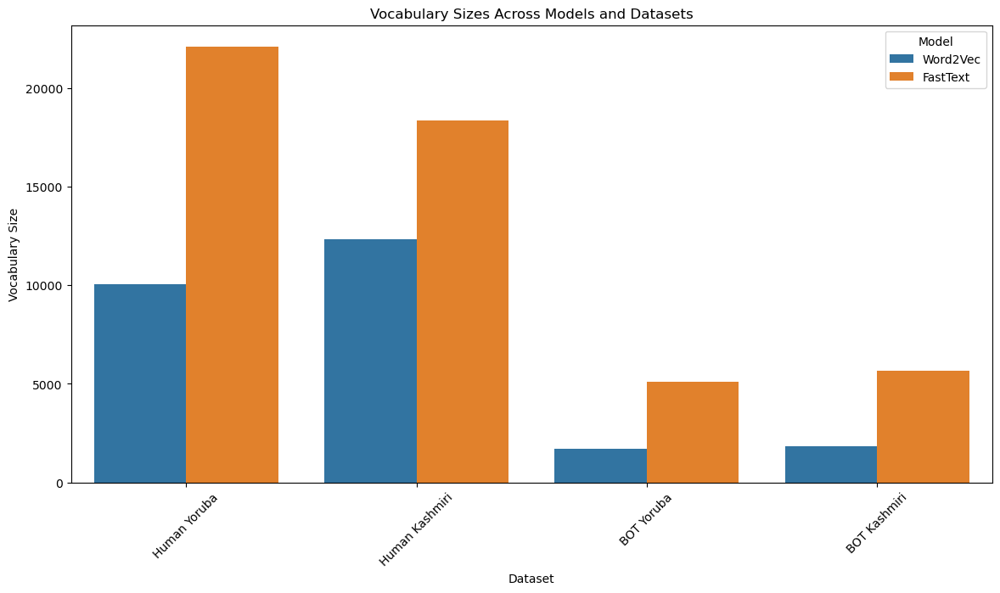

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting
plt.figure(figsize=(14, 7))
sns.barplot(x="Dataset", y="Vocabulary Size", hue="Model", data=df_vocab_sizes)
plt.title('Vocabulary Sizes Across Models and Datasets')
plt.xticks(rotation=45)
plt.show()

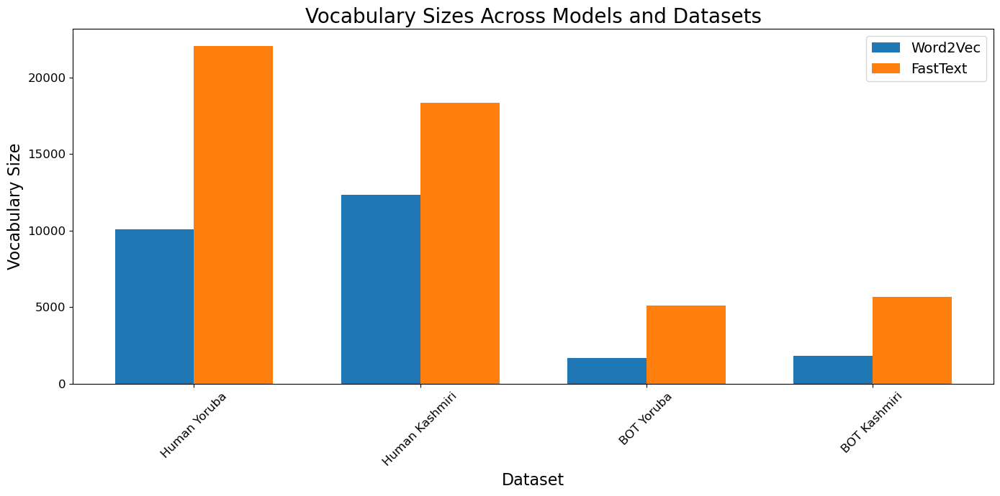

In [20]:
import matplotlib.pyplot as plt

# Assuming df_vocab_sizes is defined as before
# Replace with your actual dataframe
datasets = df_vocab_sizes["Dataset"].unique()
x = range(len(datasets))

wv = df_vocab_sizes[df_vocab_sizes["Model"] == "Word2Vec"]["Vocabulary Size"].values
ft = df_vocab_sizes[df_vocab_sizes["Model"] == "FastText"]["Vocabulary Size"].values

plt.figure(figsize=(14, 7))

bar_width = 0.35
plt.bar([i - bar_width/2 for i in x], wv, width=bar_width, label="Word2Vec")
plt.bar([i + bar_width/2 for i in x], ft, width=bar_width, label="FastText")

plt.title('Vocabulary Sizes Across Models and Datasets', fontsize=20)
plt.xlabel('Dataset', fontsize=16)
plt.ylabel('Vocabulary Size', fontsize=16)
plt.xticks(x, datasets, rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()

In [21]:
# !pip install hdbscan
# !pip install dbscan1d

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sklearn.cluster import DBSCAN
import warnings
from dbscan1d.core import DBSCAN1D
from nltk import ngrams
import numpy as np

In [23]:
from nltk import ngrams
import numpy as np

def generate_ngrams(text_tokens, n=3):
    """ Generate n-grams from the list of tokens. """
    return [ngram for ngram in ngrams(text_tokens, n)]

def ngram_to_vector(ngram, model):
    """ Concatenate word vectors for each word in the n-gram. """
    vector_dim = model.vector_size
    ngram_vector = np.concatenate([model.wv[word] if word in model.wv else np.zeros(vector_dim) for word in ngram])
    return ngram_vector

def create_ngram_dataset(texts, model, n=3):
    """ Create a dataset of n-gram vectors, store only unique n-grams. """
    all_ngrams = []
    all_ngrams_vectors = []
    seen_ngrams = set()  # To track unique n-grams

    for text_tokens in texts:
        ngrams = generate_ngrams(text_tokens, n)
        for ngram in ngrams:
            ngram_tuple = tuple(ngram)  # Convert list to tuple for hashability
            if ngram_tuple not in seen_ngrams:
                seen_ngrams.add(ngram_tuple)
                vector = ngram_to_vector(ngram, model)
                all_ngrams.append(ngram_tuple)
                all_ngrams_vectors.append(vector)

    return all_ngrams, np.array(all_ngrams_vectors)


# Processed texts need to be a list of tokens
processed_texts_yoruba_bot = processed_yoruba_bot.split()
processed_texts_yoruba_human = processed_yoruba_human.split()
processed_texts_kashmiri_bot = processed_kashmiri_bot.split()
processed_texts_kashmiri_human = processed_kashmiri_human.split()

# Word2vec
ngrams_yoruba_bot_wv, vectors_yoruba_bot_wv = create_ngram_dataset([processed_texts_yoruba_bot], word2vec_gpt_yoruba)
ngrams_yoruba_human_wv, vectors_yoruba_human_wv = create_ngram_dataset([processed_texts_yoruba_human], word2vec_corpus_yoruba)
ngrams_kashmiri_bot_wv, vectors_kashmiri_bot_wv = create_ngram_dataset([processed_texts_kashmiri_bot], word2vec_gpt_kashmiri)
ngrams_kashmiri_human_wv, vectors_kashmiri_human_wv = create_ngram_dataset([processed_texts_kashmiri_human], word2vec_corpus_kashmiri)

# Fasttext
ngrams_yoruba_bot_ft, vectors_yoruba_bot_ft = create_ngram_dataset([processed_texts_yoruba_bot], fasttext_gpt_yoruba)
ngrams_yoruba_human_ft, vectors_yoruba_human_ft = create_ngram_dataset([processed_texts_yoruba_human], fasttext_corpus_yoruba)
ngrams_kashmiri_bot_ft, vectors_kashmiri_bot_ft = create_ngram_dataset([processed_texts_kashmiri_bot], fasttext_gpt_kashmiri)
ngrams_kashmiri_human_ft, vectors_kashmiri_human_ft = create_ngram_dataset([processed_texts_kashmiri_human], fasttext_corpus_kashmiri)

print("Word2vec")
print(f"Generated {len(ngrams_yoruba_bot_wv)} Yoruba bot n-grams.")
print(f"Generated {len(ngrams_yoruba_human_wv)} Yoruba human n-grams.")
print(f"Generated {len(ngrams_kashmiri_bot_wv)} Kashmiri bot n-grams.")
print(f"Generated {len(ngrams_kashmiri_human_wv)} Kashmiri human n-grams.")

print("*"*60)

print("FastText")
print(f"Generated {len(ngrams_yoruba_bot_ft)} Yoruba bot n-grams.")
print(f"Generated {len(ngrams_yoruba_human_ft)} Yoruba human n-grams.")
print(f"Generated {len(ngrams_kashmiri_bot_ft)} Kashmiri bot n-grams.")
print(f"Generated {len(ngrams_kashmiri_human_ft)} Kashmiri human n-grams.")

Word2vec
Generated 16865 Yoruba bot n-grams.
Generated 526128 Yoruba human n-grams.
Generated 20033 Kashmiri bot n-grams.
Generated 55290 Kashmiri human n-grams.
************************************************************
FastText
Generated 16865 Yoruba bot n-grams.
Generated 526128 Yoruba human n-grams.
Generated 20033 Kashmiri bot n-grams.
Generated 55290 Kashmiri human n-grams.


## Wishart Clustering

In [24]:
import numpy as np
from scipy.special import gamma
from sklearn.neighbors import KDTree
from collections import defaultdict
from tqdm import tqdm

class Wishart:
    def __init__(self, wishart_neighbors, significance_level):
        self.wishart_neighbors = wishart_neighbors  # Number of neighbors
        self.significance_level = significance_level  # Significance level

    def fit(self, X):
        kdt = KDTree(X, metric='euclidean')

        # Query the k-nearest neighbors for each point
        distances, neighbors = kdt.query(X, k=self.wishart_neighbors + 1, return_distance=True)
        neighbors = neighbors[:, 1:]  # Exclude self-neighbor

        # Use the distance to the k-th nearest neighbor
        distances = distances[:, -1]
        indexes = np.argsort(distances)

        size, dim = X.shape
        self.object_labels = np.zeros(size, dtype=int) - 1

        # Initialize clusters and mapping of clusters to objects
        self.clusters = np.array([(1., 1., 0)])
        self.clusters_to_objects = defaultdict(list)
        print('Start clustering')

        for index in indexes:
            neighbors_clusters = np.concatenate([self.object_labels[neighbors[index]], self.object_labels[neighbors[index]]])
            unique_clusters = np.unique(neighbors_clusters).astype(int)
            unique_clusters = unique_clusters[unique_clusters != -1]

            if len(unique_clusters) == 0:
                self._create_new_cluster(index, distances[index])
            else:
                max_cluster = unique_clusters[-1]
                min_cluster = unique_clusters[0]
                if max_cluster == min_cluster:
                    if self.clusters[max_cluster][-1] < 0.5:
                        self._add_elem_to_exist_cluster(index, distances[index], max_cluster)
                    else:
                        self._add_elem_to_noise(index)
                else:
                    my_clusters = self.clusters[unique_clusters]
                    flags = my_clusters[:, -1]
                    if np.min(flags) > 0.5:
                        self._add_elem_to_noise(index)
                    else:
                        significan = np.power(np.maximum(my_clusters[:, 0], 1e-10), -dim) - np.power(np.maximum(my_clusters[:, 1], 1e-10), -dim)
                        significan *= self.wishart_neighbors
                        significan /= size
                        significan /= np.power(np.pi, dim / 2)
                        significan *= gamma(dim / 2 + 1)
                        significan_index = significan >= self.significance_level

                        significan_clusters = unique_clusters[significan_index]
                        not_significan_clusters = unique_clusters[~significan_index]
                        significan_clusters_count = len(significan_clusters)
                        if significan_clusters_count > 1 or min_cluster == 0:
                            self._add_elem_to_noise(index)
                            self.clusters[significan_clusters, -1] = 1
                            for not_sig_cluster in not_significan_clusters:
                                if not_sig_cluster == 0:
                                    continue

                                for bad_index in self.clusters_to_objects[not_sig_cluster]:
                                    self._add_elem_to_noise(bad_index)
                                self.clusters_to_objects[not_sig_cluster].clear()
                        else:
                            for cur_cluster in unique_clusters:
                                if cur_cluster == min_cluster:
                                    continue

                                for bad_index in self.clusters_to_objects[cur_cluster]:
                                    self._add_elem_to_exist_cluster(bad_index, distances[bad_index], min_cluster)
                                self.clusters_to_objects[cur_cluster].clear()

                            self._add_elem_to_exist_cluster(index, distances[index], min_cluster)

        return self.clean_data()

    def clean_data(self):
        unique = np.unique(self.object_labels)
        index = np.argsort(unique)
        if unique[0] != 0:
            index += 1
        true_cluster = {unq: idx for unq, idx in zip(unique, index)}
        result = np.zeros(len(self.object_labels), dtype=int)
        for idx, unq in enumerate(self.object_labels):
            result[idx] = true_cluster[unq]
        return result

    def _add_elem_to_noise(self, index):
        self.object_labels[index] = 0
        self.clusters_to_objects[0].append(index)

    def _create_new_cluster(self, index, dist):
        self.object_labels[index] = len(self.clusters)
        self.clusters_to_objects[len(self.clusters)].append(index)
        self.clusters = np.append(self.clusters, [(dist, dist, 0)], axis=0)

    def _add_elem_to_exist_cluster(self, index, dist, cluster_label):
        self.object_labels[index] = cluster_label
        self.clusters_to_objects[cluster_label].append(index)
        self.clusters[cluster_label][0] = min(self.clusters[cluster_label][0], dist)
        self.clusters[cluster_label][1] = max(self.clusters[cluster_label][1], dist)


class PreTrainWishart:
    def __init__(self, wishart_neighbors, significance_level, distances, neighbors):
        self.wishart_neighbors = wishart_neighbors  # Number of neighbors
        self.significance_level = significance_level  # Significance level
        self.distances = distances
        self.neighbors = neighbors

    def fit(self, X):
        kdt = KDTree(X, metric='euclidean')

        # Use precomputed distances and neighbors
        neighbors = self.neighbors[:, 1:self.wishart_neighbors + 1]
        distances = self.distances[:, self.wishart_neighbors]
        indexes = np.argsort(distances)

        size, dim = X.shape
        self.object_labels = np.zeros(size, dtype=int) - 1

        # Initialize clusters and mapping of clusters to objects
        self.clusters = np.array([(1., 1., 0)])
        self.clusters_to_objects = defaultdict(list)

        for index in indexes:
            neighbors_clusters = np.concatenate([self.object_labels[neighbors[index]], self.object_labels[neighbors[index]]])
            unique_clusters = np.unique(neighbors_clusters).astype(int)
            unique_clusters = unique_clusters[unique_clusters != -1]

            if len(unique_clusters) == 0:
                self._create_new_cluster(index, distances[index])
            else:
                max_cluster = unique_clusters[-1]
                min_cluster = unique_clusters[0]
                if max_cluster == min_cluster:
                    if self.clusters[max_cluster][-1] < 0.5:
                        self._add_elem_to_exist_cluster(index, distances[index], max_cluster)
                    else:
                        self._add_elem_to_noise(index)
                else:
                    my_clusters = self.clusters[unique_clusters]
                    flags = my_clusters[:, -1]
                    if np.min(flags) > 0.5:
                        self._add_elem_to_noise(index)
                    else:
                        significan = np.power(np.maximum(my_clusters[:, 0], 1e-10), -dim) - np.power(np.maximum(my_clusters[:, 1], 1e-10), -dim)
                        significan *= self.wishart_neighbors
                        significan /= size
                        significan /= np.power(np.pi, dim / 2)
                        significan *= gamma(dim / 2 + 1)
                        significan_index = significan >= self.significance_level

                        significan_clusters = unique_clusters[significan_index]
                        not_significan_clusters = unique_clusters[~significan_index]
                        significan_clusters_count = len(significan_clusters)
                        if significan_clusters_count > 1 or min_cluster == 0:
                            self._add_elem_to_noise(index)
                            self.clusters[significan_clusters, -1] = 1
                            for not_sig_cluster in not_significan_clusters:
                                if not_sig_cluster == 0:
                                    continue

                                for bad_index in self.clusters_to_objects[not_sig_cluster]:
                                    self._add_elem_to_noise(bad_index)
                                self.clusters_to_objects[not_sig_cluster].clear()
                        else:
                            for cur_cluster in unique_clusters:
                                if cur_cluster == min_cluster:
                                    continue

                                for bad_index in self.clusters_to_objects[cur_cluster]:
                                    self._add_elem_to_exist_cluster(bad_index, distances[bad_index], min_cluster)
                                self.clusters_to_objects[cur_cluster].clear()

                            self._add_elem_to_exist_cluster(index, distances[index], min_cluster)

        return self.clean_data()

    def clean_data(self):
        unique = np.unique(self.object_labels)
        index = np.argsort(unique)
        if unique[0] != 0:
            index += 1
        true_cluster = {unq: idx for unq, idx in zip(unique, index)}
        result = np.zeros(len(self.object_labels), dtype=int)
        for idx, unq in enumerate(self.object_labels):
            result[idx] = true_cluster[unq]
        return result

    def _add_elem_to_noise(self, index):
        self.object_labels[index] = 0
        self.clusters_to_objects[0].append(index)

    def _create_new_cluster(self, index, dist):
        self.object_labels[index] = len(self.clusters)
        self.clusters_to_objects[len(self.clusters)].append(index)
        self.clusters = np.append(self.clusters, [(dist, dist, 0)], axis=0)

    def _add_elem_to_exist_cluster(self, index, dist, cluster_label):
        self.object_labels[index] = cluster_label
        self.clusters_to_objects[cluster_label].append(index)
        self.clusters[cluster_label][0] = min(self.clusters[cluster_label][0], dist)
        self.clusters[cluster_label][1] = max(self.clusters[cluster_label][1], dist)

In [25]:
# Instantiate the Wishart clustering model

wishart_neighbors = 20  # Set appropriate number of neighbors
significance_level = 0.05  # Set appropriate significance level

wishart = Wishart(wishart_neighbors, significance_level)

# Fit the Wishart model on the vector datasets
# Word2vec
labels_yoruba_bot_wv = wishart.fit(vectors_yoruba_bot_wv)
labels_yoruba_human_wv = wishart.fit(vectors_yoruba_human_wv)
labels_kashmiri_bot_wv = wishart.fit(vectors_kashmiri_bot_wv)
labels_kashmiri_human_wv = wishart.fit(vectors_kashmiri_human_wv)

# Fasttext
labels_yoruba_bot_ft = wishart.fit(vectors_yoruba_bot_ft)
labels_yoruba_human_ft = wishart.fit(vectors_yoruba_human_ft)
labels_kashmiri_bot_ft = wishart.fit(vectors_yoruba_bot_ft)
labels_kashmiri_human_ft = wishart.fit(vectors_yoruba_human_ft)

# Print or analyze the clustering results
print('Yoruba Bot Word2vec Clusters:', np.unique(labels_yoruba_bot_wv))
print('Yoruba Human Word2vec Clusters:', np.unique(labels_yoruba_human_wv))
print('Kashmiri Bot Word2vec Clusters:', np.unique(labels_kashmiri_bot_wv))
print('Kashmiri Human Word2vec Clusters:', np.unique(labels_kashmiri_human_wv))

print('Yoruba Bot FastText Clusters:', np.unique(labels_yoruba_bot_ft))
print('Yoruba Human FastText Clusters:', np.unique(labels_yoruba_human_ft))
print('Kashmiri Bot FastText Clusters:', np.unique(labels_yoruba_bot_ft))
print('Kashmiri Human FastText Clusters:', np.unique(labels_yoruba_human_ft))

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Yoruba Bot Word2vec Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
Yoruba Human Word2vec Clusters: [   0    1    2 ... 2435 2436 2437]
Kashmiri Bot Word2vec Clusters: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118]
Kashmiri Human Word2vec Clusters: [ 0  1  2  3  4  5  

In [26]:
# Define different parameter sets to experiment with
param_sets = [
    {'wishart_neighbors': 30, 'significance_level': 0.05},
    {'wishart_neighbors': 20, 'significance_level': 0.10},
    {'wishart_neighbors': 10, 'significance_level': 0.15},
    {'wishart_neighbors': 50, 'significance_level': 0.05},
    {'wishart_neighbors': 40, 'significance_level': 0.10},
    {'wishart_neighbors': 30, 'significance_level': 0.10}
]

# Function to run clustering with different parameters
def run_wishart_clustering(vectors, param_set):
    wishart = Wishart(param_set['wishart_neighbors'], param_set['significance_level'])
    return wishart.fit(vectors)

# Adjust parameters and run clustering again for each dataset
for params in param_sets:
    print(f"Running Wishart Clustering with params: {params}")

    # Word2vec
    labels_yoruba_bot_wv = run_wishart_clustering(vectors_yoruba_bot_wv, params)
    labels_yoruba_human_wv = run_wishart_clustering(vectors_yoruba_human_wv, params)
    labels_kashmiri_bot_wv = run_wishart_clustering(vectors_kashmiri_bot_wv, params)
    labels_kashmiri_human_wv = run_wishart_clustering(vectors_kashmiri_human_wv, params)

    # Fasttext
    labels_yoruba_bot_ft = run_wishart_clustering(vectors_yoruba_bot_ft, params)
    labels_yoruba_human_ft = run_wishart_clustering(vectors_yoruba_human_ft, params)
    labels_yoruba_bot_ft = run_wishart_clustering(vectors_yoruba_bot_ft, params)
    labels_yoruba_human_ft = run_wishart_clustering(vectors_yoruba_human_ft, params)

    # Print or analyze the clustering results
    print('Yoruba Bot Word2vec Clusters:', np.unique(labels_yoruba_bot_wv))
    print('Yoruba Human Word2vec Clusters:', np.unique(labels_yoruba_human_wv))
    print('Kashmiri Bot Word2vec Clusters:', np.unique(labels_kashmiri_bot_wv))
    print('Kashmiri Human Word2vec Clusters:', np.unique(labels_kashmiri_human_wv))
    print('Yoruba Bot FastText Clusters:', np.unique(labels_yoruba_bot_ft))
    print('Yoruba Human FastText Clusters:', np.unique(labels_yoruba_human_ft))
    print('Kashmiri Bot FastText Clusters:', np.unique(labels_kashmiri_bot_ft))
    print('Kashmiri Human FastText Clusters:', np.unique(labels_kashmiri_human_ft))

Running Wishart Clustering with params: {'wishart_neighbors': 30, 'significance_level': 0.05}
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Yoruba Bot Word2vec Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41]
Yoruba Human Word2vec Clusters: [   0    1    2 ... 1598 1599 1600]
Kashmiri Bot Word2vec Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88]
Kashmiri Human Word2vec Clusters: [0 1 2 3 4 5 6]
Yoruba Bot FastText Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 

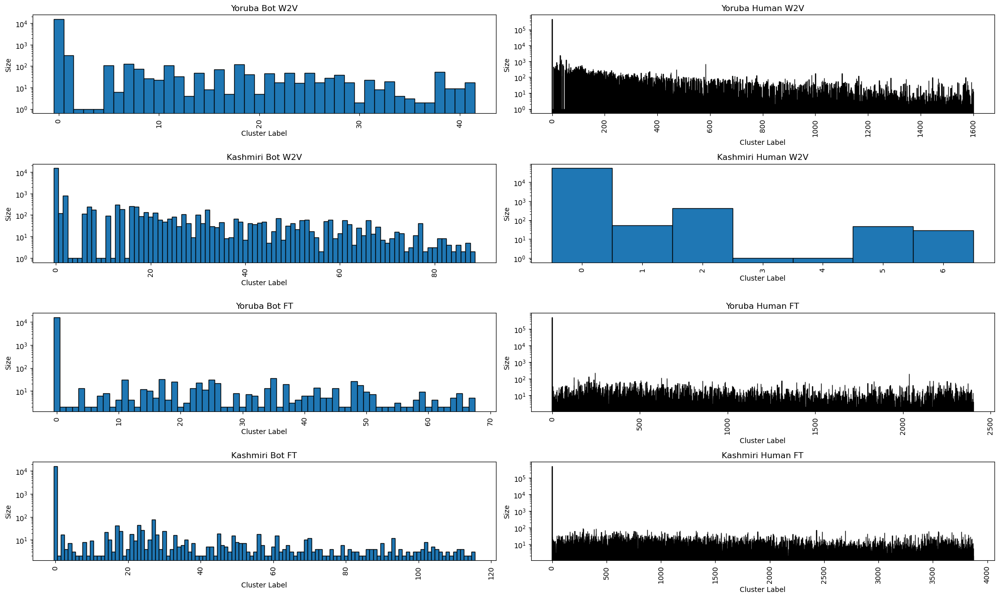

In [27]:
import matplotlib.pyplot as plt
from collections import Counter

# Create a list of all labels for easy iteration
label_sets = [labels_yoruba_bot_wv, labels_yoruba_human_wv, labels_kashmiri_bot_wv, labels_kashmiri_human_wv,
              labels_yoruba_bot_ft, labels_yoruba_human_ft, labels_kashmiri_bot_ft, labels_kashmiri_human_ft]
titles = ["Yoruba Bot W2V", "Yoruba Human W2V", "Kashmiri Bot W2V", "Kashmiri Human W2V",
          "Yoruba Bot FT", "Yoruba Human FT", "Kashmiri Bot FT", "Kashmiri Human FT"]

# Plotting
plt.figure(figsize=(20, 12))
for i, labels in enumerate(label_sets, 1):
    plt.subplot(4, 2, i)
    cluster_sizes = Counter(labels)
    sorted_cluster_sizes = sorted(cluster_sizes.items())
    sorted_labels, sorted_sizes = zip(*sorted_cluster_sizes)

    plt.bar(sorted_labels, sorted_sizes, width=1.0, edgecolor="black")
    plt.title(titles[i-1])
    plt.xlabel('Cluster Label')
    plt.ylabel('Size')
    plt.yscale('log')  # Logarithmic scale
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

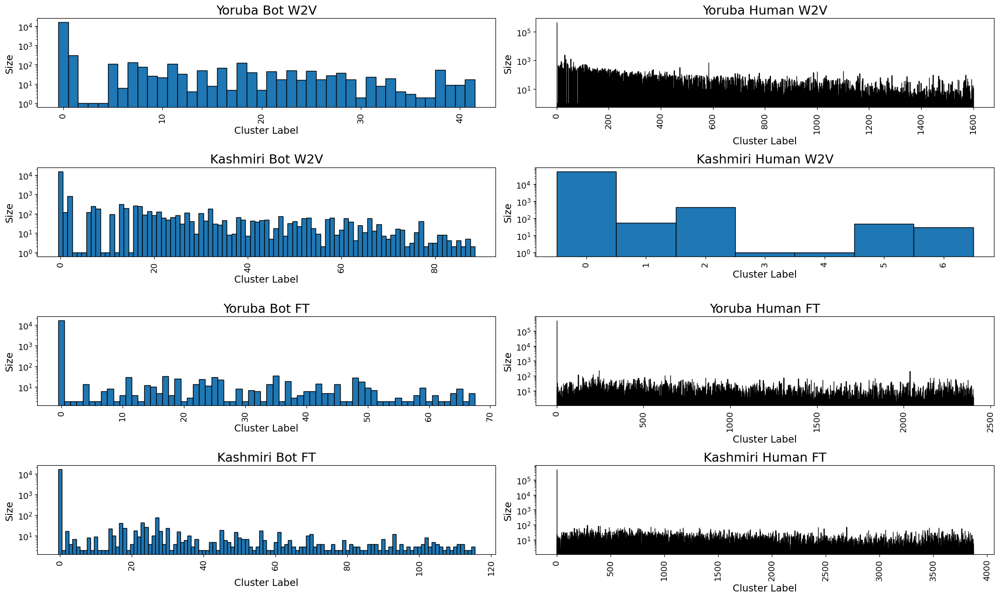

In [28]:
import matplotlib.pyplot as plt
from collections import Counter

# Example label arrays (replace with your actual label lists)
label_sets = [labels_yoruba_bot_wv, labels_yoruba_human_wv, labels_kashmiri_bot_wv, labels_kashmiri_human_wv,
              labels_yoruba_bot_ft, labels_yoruba_human_ft, labels_kashmiri_bot_ft, labels_kashmiri_human_ft]
titles = ["Yoruba Bot W2V", "Yoruba Human W2V", "Kashmiri Bot W2V", "Kashmiri Human W2V",
          "Yoruba Bot FT", "Yoruba Human FT", "Kashmiri Bot FT", "Kashmiri Human FT"]

plt.figure(figsize=(20, 12))

for i, labels in enumerate(label_sets, 1):
    ax = plt.subplot(4, 2, i)
    cluster_sizes = Counter(labels)
    sorted_cluster_sizes = sorted(cluster_sizes.items())
    sorted_labels, sorted_sizes = zip(*sorted_cluster_sizes)
    
    ax.bar(sorted_labels, sorted_sizes, width=1.0, edgecolor="black")
    ax.set_yscale('log')
    
    ax.set_title(titles[i-1], fontsize=18)
    ax.set_xlabel('Cluster Label', fontsize=14)
    ax.set_ylabel('Size', fontsize=14)
    
    ax.tick_params(axis='x', labelrotation=90, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()

## Calinski Harabasz Score

python(21738) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Processing Yoruba Bot Word2Vec:   0%|                   | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Bot Word2Vec:   1%|           | 1/100 [00:01<03:08,  1.90s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   2%|▏          | 2/100 [00:03<03:01,  1.85s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   3%|▎          | 3/100 [00:05<02:57,  1.83s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   4%|▍          | 4/100 [00:07<02:55,  1.83s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   5%|▌          | 5/100 [00:09<02:53,  1.83s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   6%|▋          | 6/100 [00:10<02:51,  1.82s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   7%|▊          | 7/100 [00:12<02:53,  1.86s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   8%|▉          | 8/100 [00:15<03:06,  2.03s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   9%|▉          | 9/100 [00:17<03:02,  2.00s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  10%|█         | 10/100 [00:19<02:57,  1.97s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  11%|█         | 11/100 [00:21<02:56,  1.99s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  12%|█▏        | 12/100 [00:23<02:54,  1.99s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  13%|█▎        | 13/100 [00:25<02:53,  2.00s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  14%|█▍        | 14/100 [00:27<02:51,  1.99s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  15%|█▌        | 15/100 [00:29<02:49,  1.99s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  16%|█▌        | 16/100 [00:31<02:50,  2.03s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  17%|█▋        | 17/100 [00:33<02:48,  2.02s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  18%|█▊        | 18/100 [00:35<02:46,  2.03s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  19%|█▉        | 19/100 [00:38<03:00,  2.22s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  20%|██        | 20/100 [00:40<02:53,  2.17s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  21%|██        | 21/100 [00:42<02:49,  2.14s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  22%|██▏       | 22/100 [00:44<02:45,  2.12s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  23%|██▎       | 23/100 [00:46<02:43,  2.12s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  24%|██▍       | 24/100 [00:48<02:40,  2.11s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  25%|██▌       | 25/100 [00:50<02:38,  2.12s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  26%|██▌       | 26/100 [00:52<02:37,  2.12s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  27%|██▋       | 27/100 [00:54<02:35,  2.13s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  28%|██▊       | 28/100 [00:56<02:33,  2.13s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  29%|██▉       | 29/100 [00:59<02:31,  2.14s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  30%|███       | 30/100 [01:01<02:30,  2.14s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  31%|███       | 31/100 [01:03<02:30,  2.18s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  32%|███▏      | 32/100 [01:05<02:28,  2.19s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  33%|███▎      | 33/100 [01:07<02:27,  2.20s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  34%|███▍      | 34/100 [01:10<02:25,  2.21s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  35%|███▌      | 35/100 [01:12<02:24,  2.23s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  36%|███▌      | 36/100 [01:14<02:23,  2.23s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  37%|███▋      | 37/100 [01:16<02:21,  2.25s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  38%|███▊      | 38/100 [01:19<02:19,  2.26s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  39%|███▉      | 39/100 [01:21<02:19,  2.28s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  40%|████      | 40/100 [01:23<02:16,  2.28s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  41%|████      | 41/100 [01:26<02:15,  2.30s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  42%|████▏     | 42/100 [01:28<02:13,  2.31s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  43%|████▎     | 43/100 [01:30<02:11,  2.31s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  44%|████▍     | 44/100 [01:33<02:09,  2.32s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  45%|████▌     | 45/100 [01:35<02:07,  2.32s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  46%|████▌     | 46/100 [01:37<02:06,  2.34s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  47%|████▋     | 47/100 [01:40<02:04,  2.35s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  48%|████▊     | 48/100 [01:42<02:02,  2.35s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  49%|████▉     | 49/100 [01:45<02:00,  2.37s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  50%|█████     | 50/100 [01:47<01:58,  2.37s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  51%|█████     | 51/100 [01:49<01:56,  2.37s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  52%|█████▏    | 52/100 [01:52<01:53,  2.37s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  53%|█████▎    | 53/100 [01:54<01:51,  2.38s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  54%|█████▍    | 54/100 [01:56<01:49,  2.39s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  55%|█████▌    | 55/100 [01:59<01:47,  2.40s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  56%|█████▌    | 56/100 [02:01<01:46,  2.41s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  57%|█████▋    | 57/100 [02:05<01:58,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  58%|█████▊    | 58/100 [02:08<02:02,  2.92s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  59%|█████▉    | 59/100 [02:11<01:54,  2.78s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  60%|██████    | 60/100 [02:13<01:48,  2.70s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  61%|██████    | 61/100 [02:16<01:44,  2.67s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  62%|██████▏   | 62/100 [02:18<01:39,  2.63s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  63%|██████▎   | 63/100 [02:21<01:36,  2.61s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  64%|██████▍   | 64/100 [02:23<01:33,  2.59s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  65%|██████▌   | 65/100 [02:26<01:30,  2.59s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  66%|██████▌   | 66/100 [02:29<01:28,  2.59s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  67%|██████▋   | 67/100 [02:31<01:25,  2.60s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  68%|██████▊   | 68/100 [02:34<01:24,  2.63s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  69%|██████▉   | 69/100 [02:39<01:45,  3.39s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  70%|███████   | 70/100 [02:43<01:45,  3.53s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  71%|███████   | 71/100 [02:46<01:34,  3.27s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  72%|███████▏  | 72/100 [02:48<01:25,  3.06s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  73%|███████▎  | 73/100 [02:51<01:19,  2.93s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  74%|███████▍  | 74/100 [02:53<01:14,  2.85s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  75%|███████▌  | 75/100 [02:56<01:10,  2.81s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  76%|███████▌  | 76/100 [02:59<01:06,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  77%|███████▋  | 77/100 [03:01<01:02,  2.73s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  78%|███████▊  | 78/100 [03:05<01:07,  3.06s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  79%|███████▉  | 79/100 [03:09<01:05,  3.13s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  80%|████████  | 80/100 [03:11<00:59,  2.99s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  81%|████████  | 81/100 [03:14<00:55,  2.90s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  82%|████████▏ | 82/100 [03:17<00:51,  2.86s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  83%|████████▎ | 83/100 [03:19<00:47,  2.81s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  84%|████████▍ | 84/100 [03:22<00:44,  2.78s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  85%|████████▌ | 85/100 [03:25<00:41,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  86%|████████▌ | 86/100 [03:28<00:38,  2.76s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  87%|████████▋ | 87/100 [03:30<00:35,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  88%|████████▊ | 88/100 [03:33<00:33,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  89%|████████▉ | 89/100 [03:36<00:30,  2.78s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  90%|█████████ | 90/100 [03:39<00:27,  2.78s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  91%|█████████ | 91/100 [03:41<00:25,  2.79s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  92%|█████████▏| 92/100 [03:44<00:22,  2.80s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  93%|█████████▎| 93/100 [03:47<00:19,  2.81s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  94%|█████████▍| 94/100 [03:50<00:17,  2.86s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  95%|█████████▌| 95/100 [03:53<00:14,  2.90s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  96%|█████████▌| 96/100 [03:56<00:11,  2.96s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  97%|█████████▋| 97/100 [03:59<00:08,  2.91s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  98%|█████████▊| 98/100 [04:02<00:05,  2.89s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  99%|█████████▉| 99/100 [04:05<00:02,  2.88s/it]

Start clustering


Processing Yoruba Human Word2Vec:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Human Word2Vec:   1%|     | 1/100 [06:36<10:54:18, 396.55s/it]

Start clustering


Processing Yoruba Human Word2Vec:   2%|     | 2/100 [13:22<10:57:02, 402.27s/it]

Start clustering


Processing Yoruba Human Word2Vec:   3%|▏    | 3/100 [20:27<11:07:04, 412.62s/it]

Start clustering


Processing Yoruba Human Word2Vec:   4%|▏    | 4/100 [27:26<11:04:01, 415.02s/it]

Start clustering


Processing Yoruba Human Word2Vec:   5%|▎    | 5/100 [34:48<11:12:43, 424.88s/it]

Start clustering


Processing Yoruba Human Word2Vec:   6%|▎    | 6/100 [42:02<11:10:19, 427.87s/it]

Start clustering


Processing Yoruba Human Word2Vec:   7%|▎    | 7/100 [49:27<11:11:53, 433.48s/it]

Start clustering


Processing Yoruba Human Word2Vec:   8%|▍    | 8/100 [56:54<11:11:08, 437.70s/it]

Start clustering


Processing Yoruba Human Word2Vec:   9%|▎  | 9/100 [1:04:28<11:11:44, 442.90s/it]

Start clustering


Processing Yoruba Human Word2Vec:  10%|▏ | 10/100 [1:12:05<11:10:53, 447.26s/it]

Start clustering


Processing Yoruba Human Word2Vec:  11%|▏ | 11/100 [1:19:55<11:13:42, 454.19s/it]

Start clustering


Processing Yoruba Human Word2Vec:  12%|▏ | 12/100 [1:27:40<11:10:47, 457.36s/it]

Start clustering


Processing Yoruba Human Word2Vec:  13%|▎ | 13/100 [1:35:37<11:11:53, 463.37s/it]

Start clustering


Processing Yoruba Human Word2Vec:  14%|▎ | 14/100 [1:43:31<11:08:38, 466.50s/it]

Start clustering


Processing Yoruba Human Word2Vec:  15%|▎ | 15/100 [1:51:32<11:07:05, 470.89s/it]

Start clustering


Processing Yoruba Human Word2Vec:  16%|▎ | 16/100 [1:59:42<11:07:18, 476.65s/it]

Start clustering


Processing Yoruba Human Word2Vec:  17%|▎ | 17/100 [2:07:49<11:03:48, 479.86s/it]

Start clustering


Processing Yoruba Human Word2Vec:  18%|▎ | 18/100 [2:16:06<11:02:48, 484.98s/it]

Start clustering


Processing Yoruba Human Word2Vec:  19%|▍ | 19/100 [2:24:23<10:59:42, 488.67s/it]

Start clustering


Processing Yoruba Human Word2Vec:  20%|▍ | 20/100 [2:32:49<10:58:29, 493.87s/it]

Start clustering


Processing Yoruba Human Word2Vec:  21%|▍ | 21/100 [2:41:10<10:52:58, 495.93s/it]

Start clustering


Processing Yoruba Human Word2Vec:  22%|▍ | 22/100 [2:49:41<10:50:42, 500.55s/it]

Start clustering


Processing Yoruba Human Word2Vec:  23%|▍ | 23/100 [2:58:05<10:43:40, 501.56s/it]

Start clustering


Processing Yoruba Human Word2Vec:  24%|▍ | 24/100 [3:06:36<10:38:52, 504.38s/it]

Start clustering


Processing Yoruba Human Word2Vec:  25%|▌ | 25/100 [3:15:12<10:34:45, 507.81s/it]

Start clustering


Processing Yoruba Human Word2Vec:  26%|▌ | 26/100 [3:23:51<10:30:40, 511.35s/it]

Start clustering


Processing Yoruba Human Word2Vec:  27%|▌ | 27/100 [3:32:39<10:28:08, 516.28s/it]

Start clustering


Processing Yoruba Human Word2Vec:  28%|▌ | 28/100 [3:41:25<10:22:52, 519.06s/it]

Start clustering


Processing Yoruba Human Word2Vec:  29%|▌ | 29/100 [3:50:13<10:17:27, 521.80s/it]

Start clustering


Processing Yoruba Human Word2Vec:  30%|▌ | 30/100 [3:59:14<10:15:38, 527.69s/it]

Start clustering


Processing Yoruba Human Word2Vec:  31%|▌ | 31/100 [4:07:56<10:04:49, 525.93s/it]

Start clustering


Processing Yoruba Human Word2Vec:  32%|▉  | 32/100 [4:16:49<9:58:14, 527.86s/it]

Start clustering


Processing Yoruba Human Word2Vec:  33%|▉  | 33/100 [4:25:42<9:51:16, 529.50s/it]

Start clustering


Processing Yoruba Human Word2Vec:  34%|█  | 34/100 [4:34:37<9:44:13, 531.11s/it]

Start clustering


Processing Yoruba Human Word2Vec:  35%|█  | 35/100 [4:43:28<9:35:27, 531.19s/it]

Start clustering


Processing Yoruba Human Word2Vec:  36%|█  | 36/100 [4:52:28<9:29:29, 533.89s/it]

Start clustering


Processing Yoruba Human Word2Vec:  37%|█  | 37/100 [5:01:28<9:22:18, 535.53s/it]

Start clustering


Processing Yoruba Human Word2Vec:  38%|█▏ | 38/100 [5:10:27<9:14:36, 536.71s/it]

Start clustering


Processing Yoruba Human Word2Vec:  39%|█▏ | 39/100 [5:19:37<9:09:41, 540.69s/it]

Start clustering


Processing Yoruba Human Word2Vec:  40%|█▏ | 40/100 [5:28:47<9:03:18, 543.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  41%|█▏ | 41/100 [5:37:52<8:54:55, 543.99s/it]

Start clustering


Processing Yoruba Human Word2Vec:  42%|█▎ | 42/100 [5:47:04<8:48:08, 546.35s/it]

Start clustering


Processing Yoruba Human Word2Vec:  43%|█▎ | 43/100 [5:56:24<8:42:50, 550.37s/it]

Start clustering


Processing Yoruba Human Word2Vec:  44%|█▎ | 44/100 [6:05:40<8:35:21, 552.17s/it]

Start clustering


Processing Yoruba Human Word2Vec:  45%|█▎ | 45/100 [6:14:59<8:27:57, 554.14s/it]

Start clustering


Processing Yoruba Human Word2Vec:  46%|█▍ | 46/100 [6:24:20<8:20:32, 556.16s/it]

Start clustering


Processing Yoruba Human Word2Vec:  47%|█▍ | 47/100 [6:33:44<8:13:17, 558.45s/it]

Start clustering


Processing Yoruba Human Word2Vec:  48%|█▍ | 48/100 [6:43:03<8:04:08, 558.63s/it]

Start clustering


Processing Yoruba Human Word2Vec:  49%|█▍ | 49/100 [6:52:33<7:57:43, 562.04s/it]

Start clustering


Processing Yoruba Human Word2Vec:  50%|█▌ | 50/100 [7:02:03<7:50:23, 564.47s/it]

Start clustering


Processing Yoruba Human Word2Vec:  51%|█▌ | 51/100 [7:11:26<7:40:34, 563.96s/it]

Start clustering


Processing Yoruba Human Word2Vec:  52%|█▌ | 52/100 [7:21:00<7:33:45, 567.20s/it]

Start clustering


Processing Yoruba Human Word2Vec:  53%|█▌ | 53/100 [7:30:39<7:26:55, 570.55s/it]

Start clustering


Processing Yoruba Human Word2Vec:  54%|█▌ | 54/100 [7:40:25<7:21:09, 575.43s/it]

Start clustering


Processing Yoruba Human Word2Vec:  55%|█▋ | 55/100 [7:50:04<7:12:16, 576.37s/it]

Start clustering


Processing Yoruba Human Word2Vec:  56%|█▋ | 56/100 [7:59:42<7:03:05, 576.95s/it]

Start clustering


Processing Yoruba Human Word2Vec:  57%|█▋ | 57/100 [8:09:20<6:53:36, 577.14s/it]

Start clustering


Processing Yoruba Human Word2Vec:  58%|█▋ | 58/100 [8:19:07<6:46:01, 580.05s/it]

Start clustering


Processing Yoruba Human Word2Vec:  59%|█▊ | 59/100 [8:28:57<6:38:29, 583.15s/it]

Start clustering


Processing Yoruba Human Word2Vec:  60%|█▊ | 60/100 [8:38:44<6:29:36, 584.41s/it]

Start clustering


Processing Yoruba Human Word2Vec:  61%|█▊ | 61/100 [8:48:34<6:20:54, 586.01s/it]

Start clustering


Processing Yoruba Human Word2Vec:  62%|█▊ | 62/100 [8:58:30<6:12:54, 588.81s/it]

Start clustering


Processing Yoruba Human Word2Vec:  63%|█▉ | 63/100 [9:08:26<6:04:31, 591.12s/it]

Start clustering


Processing Yoruba Human Word2Vec:  64%|█▉ | 64/100 [9:18:30<5:56:55, 594.86s/it]

Start clustering


Processing Yoruba Human Word2Vec:  65%|█▉ | 65/100 [9:28:41<5:49:54, 599.84s/it]

Start clustering


Processing Yoruba Human Word2Vec:  66%|█▉ | 66/100 [9:38:50<5:41:28, 602.59s/it]

Start clustering


Processing Yoruba Human Word2Vec:  67%|██ | 67/100 [9:49:02<5:32:53, 605.25s/it]

Start clustering


Processing Yoruba Human Word2Vec:  68%|██ | 68/100 [9:59:10<5:23:22, 606.31s/it]

Start clustering


Processing Yoruba Human Word2Vec:  69%|█▍| 69/100 [10:09:23<5:14:11, 608.11s/it]

Start clustering


Processing Yoruba Human Word2Vec:  70%|█▍| 70/100 [10:19:40<5:05:30, 611.02s/it]

Start clustering


Processing Yoruba Human Word2Vec:  71%|█▍| 71/100 [10:29:58<4:56:17, 613.02s/it]

Start clustering


Processing Yoruba Human Word2Vec:  72%|█▍| 72/100 [10:40:07<4:45:31, 611.82s/it]

Start clustering


Processing Yoruba Human Word2Vec:  73%|█▍| 73/100 [10:50:23<4:35:55, 613.16s/it]

Start clustering


Processing Yoruba Human Word2Vec:  74%|█▍| 74/100 [11:00:43<4:26:28, 614.93s/it]

Start clustering


Processing Yoruba Human Word2Vec:  75%|█▌| 75/100 [11:10:58<4:16:13, 614.96s/it]

Start clustering


Processing Yoruba Human Word2Vec:  76%|█▌| 76/100 [11:21:15<4:06:15, 615.66s/it]

Start clustering


Processing Yoruba Human Word2Vec:  77%|█▌| 77/100 [11:31:43<3:57:22, 619.26s/it]

Start clustering


Processing Yoruba Human Word2Vec:  78%|█▌| 78/100 [11:41:59<3:46:45, 618.41s/it]

Start clustering


Processing Yoruba Human Word2Vec:  79%|█▌| 79/100 [11:52:25<3:37:14, 620.70s/it]

Start clustering


Processing Yoruba Human Word2Vec:  80%|█▌| 80/100 [12:02:47<3:27:02, 621.11s/it]

Start clustering


Processing Yoruba Human Word2Vec:  81%|█▌| 81/100 [12:13:08<3:16:38, 621.00s/it]

Start clustering


Processing Yoruba Human Word2Vec:  82%|█▋| 82/100 [12:23:36<3:06:57, 623.18s/it]

Start clustering


Processing Yoruba Human Word2Vec:  83%|█▋| 83/100 [12:34:08<2:57:19, 625.87s/it]

Start clustering


Processing Yoruba Human Word2Vec:  84%|█▋| 84/100 [12:44:36<2:47:01, 626.31s/it]

Start clustering


Processing Yoruba Human Word2Vec:  85%|█▋| 85/100 [12:55:06<2:36:52, 627.52s/it]

Start clustering


Processing Yoruba Human Word2Vec:  86%|█▋| 86/100 [13:05:35<2:26:30, 627.88s/it]

Start clustering


Processing Yoruba Human Word2Vec:  87%|█▋| 87/100 [13:16:08<2:16:25, 629.67s/it]

Start clustering


Processing Yoruba Human Word2Vec:  88%|█▊| 88/100 [13:26:41<2:06:06, 630.52s/it]

Start clustering


Processing Yoruba Human Word2Vec:  89%|█▊| 89/100 [13:37:23<1:56:12, 633.90s/it]

Start clustering


Processing Yoruba Human Word2Vec:  90%|█▊| 90/100 [13:48:02<1:45:55, 635.59s/it]

Start clustering


Processing Yoruba Human Word2Vec:  91%|█▊| 91/100 [13:58:36<1:35:15, 635.11s/it]

Start clustering


Processing Yoruba Human Word2Vec:  92%|█▊| 92/100 [14:09:14<1:24:48, 636.03s/it]

Start clustering


Processing Yoruba Human Word2Vec:  93%|█▊| 93/100 [14:20:05<1:14:42, 640.43s/it]

Start clustering


Processing Yoruba Human Word2Vec:  94%|█▉| 94/100 [14:30:56<1:04:21, 643.55s/it]

Start clustering


Processing Yoruba Human Word2Vec:  95%|███▊| 95/100 [14:41:30<53:23, 640.65s/it]

Start clustering


Processing Yoruba Human Word2Vec:  96%|███▊| 96/100 [14:52:17<42:50, 642.52s/it]

Start clustering


Processing Yoruba Human Word2Vec:  97%|███▉| 97/100 [15:03:02<32:10, 643.48s/it]

Start clustering


Processing Yoruba Human Word2Vec:  98%|███▉| 98/100 [15:13:45<21:26, 643.16s/it]

Start clustering


Processing Yoruba Human Word2Vec:  99%|███▉| 99/100 [15:24:41<10:46, 646.99s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Bot Word2Vec:   1%|         | 1/100 [00:01<02:35,  1.57s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   2%|▏        | 2/100 [00:03<02:31,  1.54s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   3%|▎        | 3/100 [00:04<02:28,  1.53s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   4%|▎        | 4/100 [00:06<02:26,  1.53s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   5%|▍        | 5/100 [00:07<02:24,  1.52s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   6%|▌        | 6/100 [00:09<02:23,  1.53s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   7%|▋        | 7/100 [00:10<02:23,  1.54s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   8%|▋        | 8/100 [00:12<02:27,  1.60s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   9%|▊        | 9/100 [00:14<02:27,  1.62s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  10%|▊       | 10/100 [00:15<02:24,  1.60s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  11%|▉       | 11/100 [00:17<02:24,  1.62s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  12%|▉       | 12/100 [00:19<02:24,  1.64s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  13%|█       | 13/100 [00:20<02:22,  1.64s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  14%|█       | 14/100 [00:22<02:23,  1.67s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  15%|█▏      | 15/100 [00:24<02:23,  1.69s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  16%|█▎      | 16/100 [00:25<02:21,  1.69s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  17%|█▎      | 17/100 [00:27<02:21,  1.71s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  18%|█▍      | 18/100 [00:29<02:20,  1.72s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  19%|█▌      | 19/100 [00:31<02:20,  1.73s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  20%|█▌      | 20/100 [00:32<02:19,  1.75s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  21%|█▋      | 21/100 [00:34<02:18,  1.75s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  22%|█▊      | 22/100 [00:36<02:16,  1.75s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  23%|█▊      | 23/100 [00:38<02:16,  1.77s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  24%|█▉      | 24/100 [00:40<02:14,  1.77s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  25%|██      | 25/100 [00:41<02:13,  1.78s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  26%|██      | 26/100 [00:43<02:13,  1.80s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  27%|██▏     | 27/100 [00:45<02:11,  1.81s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  28%|██▏     | 28/100 [00:47<02:10,  1.82s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  29%|██▎     | 29/100 [00:49<02:10,  1.83s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  30%|██▍     | 30/100 [00:51<02:09,  1.85s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  31%|██▍     | 31/100 [00:53<02:09,  1.88s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  32%|██▌     | 32/100 [00:54<02:08,  1.88s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  33%|██▋     | 33/100 [00:56<02:06,  1.89s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  34%|██▋     | 34/100 [00:58<02:04,  1.89s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  35%|██▊     | 35/100 [01:00<02:04,  1.91s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  36%|██▉     | 36/100 [01:02<02:02,  1.92s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  37%|██▉     | 37/100 [01:04<02:02,  1.94s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  38%|███     | 38/100 [01:06<02:00,  1.94s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  39%|███     | 39/100 [01:08<01:58,  1.94s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  40%|███▏    | 40/100 [01:10<02:00,  2.01s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  41%|███▎    | 41/100 [01:12<01:59,  2.03s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  42%|███▎    | 42/100 [01:14<01:57,  2.03s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  43%|███▍    | 43/100 [01:16<01:55,  2.02s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  44%|███▌    | 44/100 [01:18<01:53,  2.04s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  45%|███▌    | 45/100 [01:20<01:51,  2.03s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  46%|███▋    | 46/100 [01:22<01:50,  2.05s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  47%|███▊    | 47/100 [01:25<01:49,  2.06s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  48%|███▊    | 48/100 [01:27<01:47,  2.07s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  49%|███▉    | 49/100 [01:29<01:45,  2.07s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  50%|████    | 50/100 [01:31<01:43,  2.07s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  51%|████    | 51/100 [01:33<01:41,  2.08s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  52%|████▏   | 52/100 [01:35<01:40,  2.10s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  53%|████▏   | 53/100 [01:37<01:39,  2.11s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  54%|████▎   | 54/100 [01:39<01:37,  2.11s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  55%|████▍   | 55/100 [01:41<01:35,  2.11s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  56%|████▍   | 56/100 [01:44<01:34,  2.14s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  57%|████▌   | 57/100 [01:46<01:32,  2.15s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  58%|████▋   | 58/100 [01:48<01:30,  2.15s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  59%|████▋   | 59/100 [01:50<01:28,  2.16s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  60%|████▊   | 60/100 [01:52<01:26,  2.17s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  61%|████▉   | 61/100 [01:55<01:25,  2.20s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  62%|████▉   | 62/100 [01:57<01:23,  2.20s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  63%|█████   | 63/100 [01:59<01:21,  2.20s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  64%|█████   | 64/100 [02:01<01:19,  2.21s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  65%|█████▏  | 65/100 [02:04<01:20,  2.29s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  66%|█████▎  | 66/100 [02:06<01:17,  2.28s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  67%|█████▎  | 67/100 [02:08<01:14,  2.27s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  68%|█████▍  | 68/100 [02:10<01:12,  2.27s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  69%|█████▌  | 69/100 [02:13<01:11,  2.29s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  70%|█████▌  | 70/100 [02:15<01:08,  2.30s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  71%|█████▋  | 71/100 [02:17<01:06,  2.31s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  72%|█████▊  | 72/100 [02:21<01:13,  2.62s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  73%|█████▊  | 73/100 [02:24<01:12,  2.68s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  74%|█████▉  | 74/100 [02:26<01:07,  2.59s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  75%|██████  | 75/100 [02:28<01:03,  2.52s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  76%|██████  | 76/100 [02:31<00:59,  2.47s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  77%|██████▏ | 77/100 [02:33<00:56,  2.44s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  78%|██████▏ | 78/100 [02:35<00:53,  2.42s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  79%|██████▎ | 79/100 [02:38<00:50,  2.40s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  80%|██████▍ | 80/100 [02:40<00:48,  2.40s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  81%|██████▍ | 81/100 [02:43<00:46,  2.42s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  82%|██████▌ | 82/100 [02:45<00:43,  2.43s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  83%|██████▋ | 83/100 [02:48<00:41,  2.45s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  84%|██████▋ | 84/100 [02:50<00:39,  2.46s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  85%|██████▊ | 85/100 [02:53<00:37,  2.47s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  86%|██████▉ | 86/100 [02:55<00:34,  2.47s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  87%|██████▉ | 87/100 [02:58<00:32,  2.47s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  88%|███████ | 88/100 [03:00<00:29,  2.48s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  89%|███████ | 89/100 [03:03<00:27,  2.48s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  90%|███████▏| 90/100 [03:05<00:24,  2.50s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  91%|███████▎| 91/100 [03:07<00:22,  2.48s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  92%|███████▎| 92/100 [03:10<00:19,  2.48s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  93%|███████▍| 93/100 [03:13<00:17,  2.50s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  94%|███████▌| 94/100 [03:15<00:15,  2.51s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  95%|███████▌| 95/100 [03:18<00:12,  2.52s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  96%|███████▋| 96/100 [03:21<00:11,  2.84s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  97%|███████▊| 97/100 [03:24<00:08,  2.89s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  98%|███████▊| 98/100 [03:27<00:05,  2.79s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  99%|███████▉| 99/100 [03:29<00:02,  2.72s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   0%|               | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Human Word2Vec:   1%|    | 1/100 [06:03<9:59:53, 363.57s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   2%|    | 2/100 [12:08<9:55:36, 364.66s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   3%|    | 3/100 [18:13<9:49:31, 364.65s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   4%|▏   | 4/100 [24:21<9:45:36, 366.01s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   5%|▏   | 5/100 [30:28<9:40:02, 366.34s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   6%|▏   | 6/100 [36:35<9:33:58, 366.37s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   7%|▎   | 7/100 [42:43<9:29:06, 367.17s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   8%|▎   | 8/100 [48:48<9:21:32, 366.22s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   9%|▎   | 9/100 [55:01<9:18:49, 368.46s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  10%| | 10/100 [1:01:08<9:11:56, 367.96s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  11%| | 11/100 [1:07:18<9:06:46, 368.61s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  12%| | 12/100 [1:13:27<9:00:56, 368.83s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  13%|▏| 13/100 [1:19:35<8:54:27, 368.59s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  14%|▏| 14/100 [1:25:44<8:48:23, 368.64s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  15%|▏| 15/100 [1:31:49<8:40:35, 367.47s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  16%|▏| 16/100 [1:38:00<8:35:56, 368.53s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  17%|▏| 17/100 [1:44:07<8:29:05, 368.01s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  18%|▏| 18/100 [1:50:23<8:26:22, 370.52s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  19%|▏| 19/100 [1:56:28<8:17:49, 368.75s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  20%|▏| 20/100 [2:02:34<8:10:54, 368.18s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  21%|▏| 21/100 [2:08:48<8:06:58, 369.86s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  22%|▏| 22/100 [2:14:56<7:59:51, 369.12s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  23%|▏| 23/100 [2:21:09<7:55:14, 370.32s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  24%|▏| 24/100 [2:27:20<7:49:18, 370.51s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  25%|▎| 25/100 [2:33:27<7:42:04, 369.66s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  26%|▎| 26/100 [2:39:54<7:42:20, 374.87s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  27%|▎| 27/100 [2:45:59<7:32:22, 371.81s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  28%|▎| 28/100 [2:52:11<7:26:09, 371.80s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  29%|▎| 29/100 [2:58:14<7:16:48, 369.14s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  30%|▎| 30/100 [3:04:18<7:08:47, 367.53s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  31%|▎| 31/100 [3:10:28<7:03:31, 368.29s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  32%|▎| 32/100 [3:16:31<6:55:43, 366.81s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  33%|▎| 33/100 [3:22:40<6:50:23, 367.51s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  34%|▎| 34/100 [3:28:45<6:43:15, 366.61s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  35%|▎| 35/100 [3:34:52<6:37:21, 366.80s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  36%|▎| 36/100 [3:41:03<6:32:44, 368.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  37%|▎| 37/100 [3:47:09<6:25:53, 367.52s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  38%|▍| 38/100 [3:53:24<6:21:53, 369.57s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  39%|▍| 39/100 [3:59:38<6:17:11, 371.02s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  40%|▍| 40/100 [4:05:54<6:12:24, 372.41s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  41%|▍| 41/100 [4:12:11<6:07:36, 373.84s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  42%|▍| 42/100 [4:18:25<6:01:29, 373.95s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  43%|▍| 43/100 [4:24:34<5:53:57, 372.58s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  44%|▍| 44/100 [4:30:46<5:47:33, 372.38s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  45%|▍| 45/100 [4:37:03<5:42:38, 373.79s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  46%|▍| 46/100 [4:43:18<5:36:36, 374.01s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  47%|▍| 47/100 [4:49:26<5:28:43, 372.15s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  48%|▍| 48/100 [4:55:44<5:24:10, 374.05s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  49%|▍| 49/100 [5:01:55<5:17:02, 372.99s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  50%|▌| 50/100 [5:08:06<5:10:23, 372.47s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  51%|▌| 51/100 [5:14:20<5:04:27, 372.80s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  52%|▌| 52/100 [5:20:29<4:57:19, 371.65s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  53%|▌| 53/100 [5:26:40<4:51:06, 371.63s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  54%|▌| 54/100 [5:32:49<4:44:18, 370.83s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  55%|▌| 55/100 [5:39:02<4:38:38, 371.52s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  56%|▌| 56/100 [5:45:13<4:32:13, 371.21s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  57%|▌| 57/100 [5:51:31<4:27:34, 373.36s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  58%|▌| 58/100 [5:57:38<4:19:56, 371.35s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  59%|▌| 59/100 [6:03:46<4:13:07, 370.42s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  60%|▌| 60/100 [6:10:00<4:07:44, 371.60s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  61%|▌| 61/100 [6:16:08<4:00:52, 370.57s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  62%|▌| 62/100 [6:22:18<3:54:27, 370.19s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  63%|▋| 63/100 [6:28:26<3:47:53, 369.55s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  64%|▋| 64/100 [6:34:33<3:41:21, 368.94s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  65%|▋| 65/100 [6:40:49<3:36:24, 370.98s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  66%|▋| 66/100 [6:46:56<3:29:30, 369.72s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  67%|▋| 67/100 [6:53:13<3:24:33, 371.91s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  68%|▋| 68/100 [6:59:21<3:17:45, 370.80s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  69%|▋| 69/100 [7:05:36<3:12:09, 371.93s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  70%|▋| 70/100 [7:11:47<3:05:51, 371.70s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  71%|▋| 71/100 [7:17:54<2:58:55, 370.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  72%|▋| 72/100 [7:24:02<2:52:28, 369.59s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  73%|▋| 73/100 [7:30:10<2:46:09, 369.23s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  74%|▋| 74/100 [7:36:19<2:39:54, 369.03s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  75%|▊| 75/100 [7:42:33<2:34:28, 370.73s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  76%|▊| 76/100 [7:48:40<2:27:51, 369.64s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  77%|▊| 77/100 [7:54:58<2:22:33, 371.90s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  78%|▊| 78/100 [8:01:07<2:16:03, 371.09s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  79%|▊| 79/100 [8:07:20<2:10:03, 371.57s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  80%|▊| 80/100 [8:13:33<2:04:00, 372.02s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  81%|▊| 81/100 [8:19:39<1:57:16, 370.36s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  82%|▊| 82/100 [8:25:50<1:51:10, 370.57s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  83%|▊| 83/100 [8:31:58<1:44:47, 369.83s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  84%|▊| 84/100 [8:38:09<1:38:43, 370.23s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  85%|▊| 85/100 [8:44:20<1:32:34, 370.27s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  86%|▊| 86/100 [8:50:37<1:26:53, 372.37s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  87%|▊| 87/100 [8:56:47<1:20:29, 371.49s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  88%|▉| 88/100 [9:02:55<1:14:05, 370.48s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  89%|▉| 89/100 [9:09:09<1:08:07, 371.56s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  90%|▉| 90/100 [9:15:20<1:01:54, 371.41s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  91%|██▋| 91/100 [9:21:30<55:40, 371.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  92%|██▊| 92/100 [9:27:38<49:20, 370.05s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  93%|██▊| 93/100 [9:33:46<43:07, 369.59s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  94%|██▊| 94/100 [9:40:00<37:05, 370.94s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  95%|██▊| 95/100 [9:46:09<30:50, 370.12s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  96%|██▉| 96/100 [9:52:26<24:49, 372.28s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  97%|██▉| 97/100 [9:58:32<18:30, 370.32s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  98%|█▉| 98/100 [10:04:40<12:19, 369.64s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  99%|█▉| 99/100 [10:11:02<06:13, 373.46s/it]

Start clustering


Processing Yoruba Bot FastText:   0%|                   | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Bot FastText:   1%|           | 1/100 [00:01<02:08,  1.30s/it]

Start clustering


Processing Yoruba Bot FastText:   2%|▏          | 2/100 [00:02<01:50,  1.13s/it]

Start clustering


Processing Yoruba Bot FastText:   3%|▎          | 3/100 [00:03<01:44,  1.08s/it]

Start clustering


Processing Yoruba Bot FastText:   4%|▍          | 4/100 [00:04<01:41,  1.06s/it]

Start clustering


Processing Yoruba Bot FastText:   5%|▌          | 5/100 [00:05<01:40,  1.05s/it]

Start clustering


Processing Yoruba Bot FastText:   6%|▋          | 6/100 [00:06<01:38,  1.05s/it]

Start clustering


Processing Yoruba Bot FastText:   7%|▊          | 7/100 [00:07<01:39,  1.07s/it]

Start clustering


Processing Yoruba Bot FastText:   8%|▉          | 8/100 [00:08<01:38,  1.07s/it]

Start clustering


Processing Yoruba Bot FastText:   9%|▉          | 9/100 [00:09<01:39,  1.09s/it]

Start clustering


Processing Yoruba Bot FastText:  10%|█         | 10/100 [00:10<01:39,  1.10s/it]

Start clustering


Processing Yoruba Bot FastText:  11%|█         | 11/100 [00:12<01:40,  1.12s/it]

Start clustering


Processing Yoruba Bot FastText:  12%|█▏        | 12/100 [00:13<01:39,  1.13s/it]

Start clustering


Processing Yoruba Bot FastText:  13%|█▎        | 13/100 [00:14<01:38,  1.14s/it]

Start clustering


Processing Yoruba Bot FastText:  14%|█▍        | 14/100 [00:15<01:38,  1.15s/it]

Start clustering


Processing Yoruba Bot FastText:  15%|█▌        | 15/100 [00:16<01:38,  1.16s/it]

Start clustering


Processing Yoruba Bot FastText:  16%|█▌        | 16/100 [00:17<01:39,  1.19s/it]

Start clustering


Processing Yoruba Bot FastText:  17%|█▋        | 17/100 [00:19<01:44,  1.26s/it]

Start clustering


Processing Yoruba Bot FastText:  18%|█▊        | 18/100 [00:20<01:43,  1.26s/it]

Start clustering


Processing Yoruba Bot FastText:  19%|█▉        | 19/100 [00:21<01:41,  1.26s/it]

Start clustering


Processing Yoruba Bot FastText:  20%|██        | 20/100 [00:23<01:40,  1.26s/it]

Start clustering


Processing Yoruba Bot FastText:  21%|██        | 21/100 [00:24<01:38,  1.25s/it]

Start clustering


Processing Yoruba Bot FastText:  22%|██▏       | 22/100 [00:25<01:38,  1.26s/it]

Start clustering


Processing Yoruba Bot FastText:  23%|██▎       | 23/100 [00:26<01:37,  1.27s/it]

Start clustering


Processing Yoruba Bot FastText:  24%|██▍       | 24/100 [00:28<01:37,  1.28s/it]

Start clustering


Processing Yoruba Bot FastText:  25%|██▌       | 25/100 [00:29<01:36,  1.29s/it]

Start clustering


Processing Yoruba Bot FastText:  26%|██▌       | 26/100 [00:30<01:35,  1.29s/it]

Start clustering


Processing Yoruba Bot FastText:  27%|██▋       | 27/100 [00:32<01:34,  1.30s/it]

Start clustering


Processing Yoruba Bot FastText:  28%|██▊       | 28/100 [00:33<01:33,  1.30s/it]

Start clustering


Processing Yoruba Bot FastText:  29%|██▉       | 29/100 [00:34<01:33,  1.32s/it]

Start clustering


Processing Yoruba Bot FastText:  30%|███       | 30/100 [00:36<01:38,  1.41s/it]

Start clustering


Processing Yoruba Bot FastText:  31%|███       | 31/100 [00:37<01:38,  1.42s/it]

Start clustering


Processing Yoruba Bot FastText:  32%|███▏      | 32/100 [00:39<01:36,  1.41s/it]

Start clustering


Processing Yoruba Bot FastText:  33%|███▎      | 33/100 [00:40<01:35,  1.42s/it]

Start clustering


Processing Yoruba Bot FastText:  34%|███▍      | 34/100 [00:42<01:33,  1.41s/it]

Start clustering


Processing Yoruba Bot FastText:  35%|███▌      | 35/100 [00:43<01:31,  1.41s/it]

Start clustering


Processing Yoruba Bot FastText:  36%|███▌      | 36/100 [00:44<01:30,  1.41s/it]

Start clustering


Processing Yoruba Bot FastText:  37%|███▋      | 37/100 [00:46<01:28,  1.41s/it]

Start clustering


Processing Yoruba Bot FastText:  38%|███▊      | 38/100 [00:47<01:28,  1.43s/it]

Start clustering


Processing Yoruba Bot FastText:  39%|███▉      | 39/100 [00:49<01:27,  1.44s/it]

Start clustering


Processing Yoruba Bot FastText:  40%|████      | 40/100 [00:50<01:26,  1.45s/it]

Start clustering


Processing Yoruba Bot FastText:  41%|████      | 41/100 [00:52<01:25,  1.45s/it]

Start clustering


Processing Yoruba Bot FastText:  42%|████▏     | 42/100 [00:53<01:25,  1.47s/it]

Start clustering


Processing Yoruba Bot FastText:  43%|████▎     | 43/100 [00:55<01:23,  1.47s/it]

Start clustering


Processing Yoruba Bot FastText:  44%|████▍     | 44/100 [00:56<01:23,  1.50s/it]

Start clustering


Processing Yoruba Bot FastText:  45%|████▌     | 45/100 [00:58<01:22,  1.51s/it]

Start clustering


Processing Yoruba Bot FastText:  46%|████▌     | 46/100 [00:59<01:21,  1.52s/it]

Start clustering


Processing Yoruba Bot FastText:  47%|████▋     | 47/100 [01:01<01:20,  1.53s/it]

Start clustering


Processing Yoruba Bot FastText:  48%|████▊     | 48/100 [01:02<01:19,  1.53s/it]

Start clustering


Processing Yoruba Bot FastText:  49%|████▉     | 49/100 [01:04<01:18,  1.53s/it]

Start clustering


Processing Yoruba Bot FastText:  50%|█████     | 50/100 [01:06<01:17,  1.54s/it]

Start clustering


Processing Yoruba Bot FastText:  51%|█████     | 51/100 [01:07<01:15,  1.55s/it]

Start clustering


Processing Yoruba Bot FastText:  52%|█████▏    | 52/100 [01:09<01:15,  1.57s/it]

Start clustering


Processing Yoruba Bot FastText:  53%|█████▎    | 53/100 [01:10<01:14,  1.59s/it]

Start clustering


Processing Yoruba Bot FastText:  54%|█████▍    | 54/100 [01:12<01:12,  1.58s/it]

Start clustering


Processing Yoruba Bot FastText:  55%|█████▌    | 55/100 [01:14<01:11,  1.59s/it]

Start clustering


Processing Yoruba Bot FastText:  56%|█████▌    | 56/100 [01:15<01:10,  1.60s/it]

Start clustering


Processing Yoruba Bot FastText:  57%|█████▋    | 57/100 [01:17<01:09,  1.61s/it]

Start clustering


Processing Yoruba Bot FastText:  58%|█████▊    | 58/100 [01:18<01:08,  1.62s/it]

Start clustering


Processing Yoruba Bot FastText:  59%|█████▉    | 59/100 [01:20<01:06,  1.63s/it]

Start clustering


Processing Yoruba Bot FastText:  60%|██████    | 60/100 [01:22<01:05,  1.63s/it]

Start clustering


Processing Yoruba Bot FastText:  61%|██████    | 61/100 [01:23<01:04,  1.65s/it]

Start clustering


Processing Yoruba Bot FastText:  62%|██████▏   | 62/100 [01:25<01:02,  1.66s/it]

Start clustering


Processing Yoruba Bot FastText:  63%|██████▎   | 63/100 [01:27<01:02,  1.68s/it]

Start clustering


Processing Yoruba Bot FastText:  64%|██████▍   | 64/100 [01:29<01:01,  1.70s/it]

Start clustering


Processing Yoruba Bot FastText:  65%|██████▌   | 65/100 [01:30<00:59,  1.71s/it]

Start clustering


Processing Yoruba Bot FastText:  66%|██████▌   | 66/100 [01:32<00:58,  1.72s/it]

Start clustering


Processing Yoruba Bot FastText:  67%|██████▋   | 67/100 [01:34<00:56,  1.73s/it]

Start clustering


Processing Yoruba Bot FastText:  68%|██████▊   | 68/100 [01:36<00:55,  1.73s/it]

Start clustering


Processing Yoruba Bot FastText:  69%|██████▉   | 69/100 [01:38<00:58,  1.88s/it]

Start clustering


Processing Yoruba Bot FastText:  70%|███████   | 70/100 [01:40<01:01,  2.04s/it]

Start clustering


Processing Yoruba Bot FastText:  71%|███████   | 71/100 [01:42<01:00,  2.09s/it]

Start clustering


Processing Yoruba Bot FastText:  72%|███████▏  | 72/100 [01:44<00:55,  2.00s/it]

Start clustering


Processing Yoruba Bot FastText:  73%|███████▎  | 73/100 [01:46<00:52,  1.94s/it]

Start clustering


Processing Yoruba Bot FastText:  74%|███████▍  | 74/100 [01:48<00:49,  1.91s/it]

Start clustering


Processing Yoruba Bot FastText:  75%|███████▌  | 75/100 [01:50<00:47,  1.88s/it]

Start clustering


Processing Yoruba Bot FastText:  76%|███████▌  | 76/100 [01:51<00:44,  1.87s/it]

Start clustering


Processing Yoruba Bot FastText:  77%|███████▋  | 77/100 [01:53<00:42,  1.85s/it]

Start clustering


Processing Yoruba Bot FastText:  78%|███████▊  | 78/100 [01:55<00:40,  1.85s/it]

Start clustering


Processing Yoruba Bot FastText:  79%|███████▉  | 79/100 [01:57<00:39,  1.86s/it]

Start clustering


Processing Yoruba Bot FastText:  80%|████████  | 80/100 [01:59<00:37,  1.88s/it]

Start clustering


Processing Yoruba Bot FastText:  81%|████████  | 81/100 [02:01<00:35,  1.88s/it]

Start clustering


Processing Yoruba Bot FastText:  82%|████████▏ | 82/100 [02:03<00:33,  1.89s/it]

Start clustering


Processing Yoruba Bot FastText:  83%|████████▎ | 83/100 [02:05<00:32,  1.91s/it]

Start clustering


Processing Yoruba Bot FastText:  84%|████████▍ | 84/100 [02:07<00:31,  1.99s/it]

Start clustering


Processing Yoruba Bot FastText:  85%|████████▌ | 85/100 [02:09<00:31,  2.13s/it]

Start clustering


Processing Yoruba Bot FastText:  86%|████████▌ | 86/100 [02:11<00:29,  2.08s/it]

Start clustering


Processing Yoruba Bot FastText:  87%|████████▋ | 87/100 [02:13<00:26,  2.03s/it]

Start clustering


Processing Yoruba Bot FastText:  88%|████████▊ | 88/100 [02:15<00:24,  2.01s/it]

Start clustering


Processing Yoruba Bot FastText:  89%|████████▉ | 89/100 [02:17<00:21,  1.99s/it]

Start clustering


Processing Yoruba Bot FastText:  90%|█████████ | 90/100 [02:19<00:19,  1.99s/it]

Start clustering


Processing Yoruba Bot FastText:  91%|█████████ | 91/100 [02:21<00:17,  1.97s/it]

Start clustering


Processing Yoruba Bot FastText:  92%|█████████▏| 92/100 [02:23<00:15,  1.97s/it]

Start clustering


Processing Yoruba Bot FastText:  93%|█████████▎| 93/100 [02:25<00:13,  1.98s/it]

Start clustering


Processing Yoruba Bot FastText:  94%|█████████▍| 94/100 [02:27<00:11,  1.98s/it]

Start clustering


Processing Yoruba Bot FastText:  95%|█████████▌| 95/100 [02:29<00:09,  2.00s/it]

Start clustering


Processing Yoruba Bot FastText:  96%|█████████▌| 96/100 [02:31<00:08,  2.00s/it]

Start clustering


Processing Yoruba Bot FastText:  97%|█████████▋| 97/100 [02:33<00:06,  2.06s/it]

Start clustering


Processing Yoruba Bot FastText:  98%|█████████▊| 98/100 [02:35<00:04,  2.05s/it]

Start clustering


Processing Yoruba Bot FastText:  99%|█████████▉| 99/100 [02:38<00:02,  2.18s/it]

Start clustering


Processing Yoruba Human FastText:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Human FastText:   1%|      | 1/100 [03:36<5:56:36, 216.13s/it]

Start clustering


Processing Yoruba Human FastText:   2%|      | 2/100 [07:12<5:52:49, 216.01s/it]

Start clustering


Processing Yoruba Human FastText:   3%|▏     | 3/100 [10:49<5:50:10, 216.61s/it]

Start clustering


Processing Yoruba Human FastText:   4%|▏     | 4/100 [14:27<5:47:21, 217.09s/it]

Start clustering


Processing Yoruba Human FastText:   5%|▎     | 5/100 [18:18<5:51:34, 222.05s/it]

Start clustering


Processing Yoruba Human FastText:   6%|▎     | 6/100 [22:11<5:53:47, 225.82s/it]

Start clustering


Processing Yoruba Human FastText:   7%|▍     | 7/100 [26:05<5:54:22, 228.63s/it]

Start clustering


Processing Yoruba Human FastText:   8%|▍     | 8/100 [30:04<5:55:27, 231.82s/it]

Start clustering


Processing Yoruba Human FastText:   9%|▌     | 9/100 [34:19<6:02:39, 239.11s/it]

Start clustering


Processing Yoruba Human FastText:  10%|▌    | 10/100 [38:22<6:00:43, 240.48s/it]

Start clustering


Processing Yoruba Human FastText:  11%|▌    | 11/100 [42:32<6:00:53, 243.30s/it]

Start clustering


Processing Yoruba Human FastText:  12%|▌    | 12/100 [46:45<6:01:01, 246.15s/it]

Start clustering


Processing Yoruba Human FastText:  13%|▋    | 13/100 [51:06<6:03:21, 250.59s/it]

Start clustering


Processing Yoruba Human FastText:  14%|▋    | 14/100 [55:27<6:03:49, 253.83s/it]

Start clustering


Processing Yoruba Human FastText:  15%|▊    | 15/100 [59:48<6:02:49, 256.11s/it]

Start clustering


Processing Yoruba Human FastText:  16%|▍  | 16/100 [1:04:16<6:03:33, 259.68s/it]

Start clustering


Processing Yoruba Human FastText:  17%|▌  | 17/100 [1:08:44<6:02:37, 262.14s/it]

Start clustering


Processing Yoruba Human FastText:  18%|▌  | 18/100 [1:13:17<6:02:39, 265.36s/it]

Start clustering


Processing Yoruba Human FastText:  19%|▌  | 19/100 [1:18:00<6:05:22, 270.65s/it]

Start clustering


Processing Yoruba Human FastText:  20%|▌  | 20/100 [1:22:42<6:05:23, 274.04s/it]

Start clustering


Processing Yoruba Human FastText:  21%|▋  | 21/100 [1:27:23<6:03:38, 276.18s/it]

Start clustering


Processing Yoruba Human FastText:  22%|▋  | 22/100 [1:32:22<6:07:53, 282.99s/it]

Start clustering


Processing Yoruba Human FastText:  23%|▋  | 23/100 [1:37:07<6:04:05, 283.71s/it]

Start clustering


Processing Yoruba Human FastText:  24%|▋  | 24/100 [1:41:59<6:02:15, 285.99s/it]

Start clustering


Processing Yoruba Human FastText:  25%|▊  | 25/100 [1:46:55<6:01:25, 289.14s/it]

Start clustering


Processing Yoruba Human FastText:  26%|▊  | 26/100 [1:51:55<6:00:25, 292.24s/it]

Start clustering


Processing Yoruba Human FastText:  27%|▊  | 27/100 [1:56:56<5:59:00, 295.08s/it]

Start clustering


Processing Yoruba Human FastText:  28%|▊  | 28/100 [2:02:00<5:57:08, 297.62s/it]

Start clustering


Processing Yoruba Human FastText:  29%|▊  | 29/100 [2:07:06<5:55:05, 300.07s/it]

Start clustering


Processing Yoruba Human FastText:  30%|▉  | 30/100 [2:12:14<5:52:47, 302.40s/it]

Start clustering


Processing Yoruba Human FastText:  31%|▉  | 31/100 [2:17:32<5:53:19, 307.23s/it]

Start clustering


Processing Yoruba Human FastText:  32%|▉  | 32/100 [2:22:48<5:51:00, 309.71s/it]

Start clustering


Processing Yoruba Human FastText:  33%|▉  | 33/100 [2:28:03<5:47:40, 311.34s/it]

Start clustering


Processing Yoruba Human FastText:  34%|█  | 34/100 [2:33:31<5:47:59, 316.35s/it]

Start clustering


Processing Yoruba Human FastText:  35%|█  | 35/100 [2:38:51<5:44:00, 317.54s/it]

Start clustering


Processing Yoruba Human FastText:  36%|█  | 36/100 [2:44:13<5:40:03, 318.80s/it]

Start clustering


Processing Yoruba Human FastText:  37%|█  | 37/100 [2:49:48<5:39:47, 323.61s/it]

Start clustering


Processing Yoruba Human FastText:  38%|█▏ | 38/100 [2:55:16<5:35:46, 324.94s/it]

Start clustering


Processing Yoruba Human FastText:  39%|█▏ | 39/100 [3:00:48<5:32:38, 327.19s/it]

Start clustering


Processing Yoruba Human FastText:  40%|█▏ | 40/100 [3:06:22<5:29:09, 329.16s/it]

Start clustering


Processing Yoruba Human FastText:  41%|█▏ | 41/100 [3:11:55<5:24:56, 330.44s/it]

Start clustering


Processing Yoruba Human FastText:  42%|█▎ | 42/100 [3:17:39<5:23:14, 334.39s/it]

Start clustering


Processing Yoruba Human FastText:  43%|█▎ | 43/100 [3:23:23<5:20:21, 337.22s/it]

Start clustering


Processing Yoruba Human FastText:  44%|█▎ | 44/100 [3:29:09<5:17:22, 340.04s/it]

Start clustering


Processing Yoruba Human FastText:  45%|█▎ | 45/100 [3:35:04<5:15:39, 344.36s/it]

Start clustering


Processing Yoruba Human FastText:  46%|█▍ | 46/100 [3:40:51<5:10:41, 345.22s/it]

Start clustering


Processing Yoruba Human FastText:  47%|█▍ | 47/100 [3:46:42<5:06:22, 346.85s/it]

Start clustering


Processing Yoruba Human FastText:  48%|█▍ | 48/100 [3:52:36<5:02:36, 349.16s/it]

Start clustering


Processing Yoruba Human FastText:  49%|█▍ | 49/100 [3:58:27<4:57:05, 349.52s/it]

Start clustering


Processing Yoruba Human FastText:  50%|█▌ | 50/100 [4:04:24<4:53:09, 351.80s/it]

Start clustering


Processing Yoruba Human FastText:  51%|█▌ | 51/100 [4:10:20<4:48:20, 353.08s/it]

Start clustering


Processing Yoruba Human FastText:  52%|█▌ | 52/100 [4:16:25<4:45:24, 356.75s/it]

Start clustering


Processing Yoruba Human FastText:  53%|█▌ | 53/100 [4:22:29<4:41:08, 358.91s/it]

Start clustering


Processing Yoruba Human FastText:  54%|█▌ | 54/100 [4:28:30<4:35:38, 359.53s/it]

Start clustering


Processing Yoruba Human FastText:  55%|█▋ | 55/100 [4:34:44<4:33:00, 364.02s/it]

Start clustering


Processing Yoruba Human FastText:  56%|█▋ | 56/100 [4:40:49<4:27:06, 364.23s/it]

Start clustering


Processing Yoruba Human FastText:  57%|█▋ | 57/100 [4:46:56<4:21:28, 364.86s/it]

Start clustering


Processing Yoruba Human FastText:  58%|█▋ | 58/100 [4:53:05<4:16:22, 366.26s/it]

Start clustering


Processing Yoruba Human FastText:  59%|█▊ | 59/100 [4:59:13<4:10:36, 366.74s/it]

Start clustering


Processing Yoruba Human FastText:  60%|█▊ | 60/100 [5:05:26<4:05:46, 368.66s/it]

Start clustering


Processing Yoruba Human FastText:  61%|█▊ | 61/100 [5:11:41<4:00:51, 370.56s/it]

Start clustering


Processing Yoruba Human FastText:  62%|█▊ | 62/100 [5:18:07<3:57:35, 375.14s/it]

Start clustering


Processing Yoruba Human FastText:  63%|█▉ | 63/100 [5:24:27<3:52:15, 376.64s/it]

Start clustering


Processing Yoruba Human FastText:  64%|█▉ | 64/100 [5:30:46<3:46:19, 377.20s/it]

Start clustering


Processing Yoruba Human FastText:  65%|█▉ | 65/100 [5:37:16<3:42:19, 381.14s/it]

Start clustering


Processing Yoruba Human FastText:  66%|█▉ | 66/100 [5:43:38<3:36:10, 381.48s/it]

Start clustering


Processing Yoruba Human FastText:  67%|██ | 67/100 [5:50:14<3:32:15, 385.93s/it]

Start clustering


Processing Yoruba Human FastText:  68%|██ | 68/100 [5:56:44<3:26:22, 386.94s/it]

Start clustering


Processing Yoruba Human FastText:  69%|██ | 69/100 [6:03:13<3:20:20, 387.76s/it]

Start clustering


Processing Yoruba Human FastText:  70%|██ | 70/100 [6:09:46<3:14:37, 389.24s/it]

Start clustering


Processing Yoruba Human FastText:  71%|██▏| 71/100 [6:16:24<3:09:19, 391.72s/it]

Start clustering


Processing Yoruba Human FastText:  72%|██▏| 72/100 [6:23:01<3:03:37, 393.47s/it]

Start clustering


Processing Yoruba Human FastText:  73%|██▏| 73/100 [6:29:40<2:57:44, 394.98s/it]

Start clustering


Processing Yoruba Human FastText:  74%|██▏| 74/100 [6:36:30<2:53:12, 399.70s/it]

Start clustering


Processing Yoruba Human FastText:  75%|██▎| 75/100 [6:43:10<2:46:31, 399.68s/it]

Start clustering


Processing Yoruba Human FastText:  76%|██▎| 76/100 [6:50:21<2:43:34, 408.95s/it]

Start clustering


Processing Yoruba Human FastText:  77%|██▎| 77/100 [6:57:12<2:37:00, 409.58s/it]

Start clustering


Processing Yoruba Human FastText:  78%|██▎| 78/100 [7:04:07<2:30:47, 411.26s/it]

Start clustering


Processing Yoruba Human FastText:  79%|██▎| 79/100 [7:11:01<2:24:17, 412.27s/it]

Start clustering


Processing Yoruba Human FastText:  80%|██▍| 80/100 [7:18:02<2:18:16, 414.84s/it]

Start clustering


Processing Yoruba Human FastText:  81%|██▍| 81/100 [7:25:02<2:11:49, 416.28s/it]

Start clustering


Processing Yoruba Human FastText:  82%|██▍| 82/100 [7:32:15<2:06:23, 421.32s/it]

Start clustering


Processing Yoruba Human FastText:  83%|██▍| 83/100 [7:39:18<1:59:28, 421.69s/it]

Start clustering


Processing Yoruba Human FastText:  84%|██▌| 84/100 [7:46:28<1:53:07, 424.21s/it]

Start clustering


Processing Yoruba Human FastText:  85%|██▌| 85/100 [7:53:36<1:46:20, 425.37s/it]

Start clustering


Processing Yoruba Human FastText:  86%|██▌| 86/100 [8:00:49<1:39:49, 427.85s/it]

Start clustering


Processing Yoruba Human FastText:  87%|██▌| 87/100 [8:07:59<1:32:47, 428.25s/it]

Start clustering


Processing Yoruba Human FastText:  88%|██▋| 88/100 [8:15:09<1:25:45, 428.80s/it]

Start clustering


Processing Yoruba Human FastText:  89%|██▋| 89/100 [8:22:32<1:19:25, 433.19s/it]

Start clustering


Processing Yoruba Human FastText:  90%|██▋| 90/100 [8:29:47<1:12:17, 433.78s/it]

Start clustering


Processing Yoruba Human FastText:  91%|██▋| 91/100 [8:37:09<1:05:26, 436.31s/it]

Start clustering


Processing Yoruba Human FastText:  92%|████▌| 92/100 [8:44:24<58:05, 435.71s/it]

Start clustering


Processing Yoruba Human FastText:  93%|████▋| 93/100 [8:51:48<51:08, 438.33s/it]

Start clustering


Processing Yoruba Human FastText:  94%|████▋| 94/100 [8:59:12<43:58, 439.83s/it]

Start clustering


Processing Yoruba Human FastText:  95%|████▊| 95/100 [9:06:28<36:34, 438.88s/it]

Start clustering


Processing Yoruba Human FastText:  96%|████▊| 96/100 [9:13:38<29:05, 436.27s/it]

Start clustering


Processing Yoruba Human FastText:  97%|████▊| 97/100 [9:21:04<21:57, 439.03s/it]

Start clustering


Processing Yoruba Human FastText:  98%|████▉| 98/100 [9:28:24<14:38, 439.49s/it]

Start clustering


Processing Yoruba Human FastText:  99%|████▉| 99/100 [9:36:05<07:25, 445.92s/it]

Start clustering


Processing Kashmiri Bot FastText:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Bot FastText:   1%|         | 1/100 [00:01<02:43,  1.65s/it]

Start clustering


Processing Kashmiri Bot FastText:   2%|▏        | 2/100 [00:03<02:43,  1.67s/it]

Start clustering


Processing Kashmiri Bot FastText:   3%|▎        | 3/100 [00:04<02:38,  1.64s/it]

Start clustering


Processing Kashmiri Bot FastText:   4%|▎        | 4/100 [00:06<02:35,  1.62s/it]

Start clustering


Processing Kashmiri Bot FastText:   5%|▍        | 5/100 [00:08<02:34,  1.63s/it]

Start clustering


Processing Kashmiri Bot FastText:   6%|▌        | 6/100 [00:09<02:35,  1.65s/it]

Start clustering


Processing Kashmiri Bot FastText:   7%|▋        | 7/100 [00:11<02:36,  1.68s/it]

Start clustering


Processing Kashmiri Bot FastText:   8%|▋        | 8/100 [00:13<02:36,  1.70s/it]

Start clustering


Processing Kashmiri Bot FastText:   9%|▊        | 9/100 [00:15<02:37,  1.73s/it]

Start clustering


Processing Kashmiri Bot FastText:  10%|▊       | 10/100 [00:16<02:36,  1.74s/it]

Start clustering


Processing Kashmiri Bot FastText:  11%|▉       | 11/100 [00:18<02:35,  1.75s/it]

Start clustering


Processing Kashmiri Bot FastText:  12%|▉       | 12/100 [00:20<02:47,  1.91s/it]

Start clustering


Processing Kashmiri Bot FastText:  13%|█       | 13/100 [00:22<02:43,  1.88s/it]

Start clustering


Processing Kashmiri Bot FastText:  14%|█       | 14/100 [00:24<02:45,  1.92s/it]

Start clustering


Processing Kashmiri Bot FastText:  15%|█▏      | 15/100 [00:26<02:43,  1.92s/it]

Start clustering


Processing Kashmiri Bot FastText:  16%|█▎      | 16/100 [00:28<02:42,  1.93s/it]

Start clustering


Processing Kashmiri Bot FastText:  17%|█▎      | 17/100 [00:30<02:40,  1.93s/it]

Start clustering


Processing Kashmiri Bot FastText:  18%|█▍      | 18/100 [00:32<02:38,  1.94s/it]

Start clustering


Processing Kashmiri Bot FastText:  19%|█▌      | 19/100 [00:34<02:38,  1.96s/it]

Start clustering


Processing Kashmiri Bot FastText:  20%|█▌      | 20/100 [00:36<02:38,  1.98s/it]

Start clustering


Processing Kashmiri Bot FastText:  21%|█▋      | 21/100 [00:38<02:38,  2.01s/it]

Start clustering


Processing Kashmiri Bot FastText:  22%|█▊      | 22/100 [00:40<02:37,  2.02s/it]

Start clustering


Processing Kashmiri Bot FastText:  23%|█▊      | 23/100 [00:42<02:37,  2.04s/it]

Start clustering


Processing Kashmiri Bot FastText:  24%|█▉      | 24/100 [00:45<02:39,  2.09s/it]

Start clustering


Processing Kashmiri Bot FastText:  25%|██      | 25/100 [00:47<02:37,  2.10s/it]

Start clustering


Processing Kashmiri Bot FastText:  26%|██      | 26/100 [00:49<02:35,  2.10s/it]

Start clustering


Processing Kashmiri Bot FastText:  27%|██▏     | 27/100 [00:51<02:34,  2.12s/it]

Start clustering


Processing Kashmiri Bot FastText:  28%|██▏     | 28/100 [00:53<02:31,  2.11s/it]

Start clustering


Processing Kashmiri Bot FastText:  29%|██▎     | 29/100 [00:55<02:32,  2.15s/it]

Start clustering


Processing Kashmiri Bot FastText:  30%|██▍     | 30/100 [00:57<02:30,  2.15s/it]

Start clustering


Processing Kashmiri Bot FastText:  31%|██▍     | 31/100 [01:00<02:29,  2.16s/it]

Start clustering


Processing Kashmiri Bot FastText:  32%|██▌     | 32/100 [01:02<02:27,  2.17s/it]

Start clustering


Processing Kashmiri Bot FastText:  33%|██▋     | 33/100 [01:04<02:26,  2.19s/it]

Start clustering


Processing Kashmiri Bot FastText:  34%|██▋     | 34/100 [01:06<02:26,  2.22s/it]

Start clustering


Processing Kashmiri Bot FastText:  35%|██▊     | 35/100 [01:09<02:25,  2.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  36%|██▉     | 36/100 [01:11<02:23,  2.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  37%|██▉     | 37/100 [01:13<02:21,  2.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  38%|███     | 38/100 [01:15<02:21,  2.28s/it]

Start clustering


Processing Kashmiri Bot FastText:  39%|███     | 39/100 [01:18<02:20,  2.30s/it]

Start clustering


Processing Kashmiri Bot FastText:  40%|███▏    | 40/100 [01:20<02:18,  2.31s/it]

Start clustering


Processing Kashmiri Bot FastText:  41%|███▎    | 41/100 [01:22<02:17,  2.32s/it]

Start clustering


Processing Kashmiri Bot FastText:  42%|███▎    | 42/100 [01:26<02:41,  2.79s/it]

Start clustering


Processing Kashmiri Bot FastText:  43%|███▍    | 43/100 [01:31<03:18,  3.49s/it]

Start clustering


Processing Kashmiri Bot FastText:  44%|███▌    | 44/100 [01:35<03:08,  3.36s/it]

Start clustering


Processing Kashmiri Bot FastText:  45%|███▌    | 45/100 [01:37<02:51,  3.11s/it]

Start clustering


Processing Kashmiri Bot FastText:  46%|███▋    | 46/100 [01:40<02:36,  2.91s/it]

Start clustering


Processing Kashmiri Bot FastText:  47%|███▊    | 47/100 [01:43<02:41,  3.05s/it]

Start clustering


Processing Kashmiri Bot FastText:  48%|███▊    | 48/100 [01:46<02:40,  3.09s/it]

Start clustering


Processing Kashmiri Bot FastText:  49%|███▉    | 49/100 [01:49<02:29,  2.94s/it]

Start clustering


Processing Kashmiri Bot FastText:  50%|████    | 50/100 [01:51<02:20,  2.81s/it]

Start clustering


Processing Kashmiri Bot FastText:  51%|████    | 51/100 [01:54<02:13,  2.73s/it]

Start clustering


Processing Kashmiri Bot FastText:  52%|████▏   | 52/100 [01:56<02:10,  2.71s/it]

Start clustering


Processing Kashmiri Bot FastText:  53%|████▏   | 53/100 [01:59<02:05,  2.67s/it]

Start clustering


Processing Kashmiri Bot FastText:  54%|████▎   | 54/100 [02:02<02:02,  2.66s/it]

Start clustering


Processing Kashmiri Bot FastText:  55%|████▍   | 55/100 [02:04<01:59,  2.65s/it]

Start clustering


Processing Kashmiri Bot FastText:  56%|████▍   | 56/100 [02:07<01:56,  2.64s/it]

Start clustering


Processing Kashmiri Bot FastText:  57%|████▌   | 57/100 [02:09<01:53,  2.63s/it]

Start clustering


Processing Kashmiri Bot FastText:  58%|████▋   | 58/100 [02:12<01:52,  2.67s/it]

Start clustering


Processing Kashmiri Bot FastText:  59%|████▋   | 59/100 [02:15<01:55,  2.82s/it]

Start clustering


Processing Kashmiri Bot FastText:  60%|████▊   | 60/100 [02:18<01:51,  2.78s/it]

Start clustering


Processing Kashmiri Bot FastText:  61%|████▉   | 61/100 [02:21<01:48,  2.77s/it]

Start clustering


Processing Kashmiri Bot FastText:  62%|████▉   | 62/100 [02:24<01:46,  2.80s/it]

Start clustering


Processing Kashmiri Bot FastText:  63%|█████   | 63/100 [02:26<01:43,  2.79s/it]

Start clustering


Processing Kashmiri Bot FastText:  64%|█████   | 64/100 [02:29<01:39,  2.78s/it]

Start clustering


Processing Kashmiri Bot FastText:  65%|█████▏  | 65/100 [02:32<01:37,  2.77s/it]

Start clustering


Processing Kashmiri Bot FastText:  66%|█████▎  | 66/100 [02:35<01:34,  2.77s/it]

Start clustering


Processing Kashmiri Bot FastText:  67%|█████▎  | 67/100 [02:38<01:31,  2.78s/it]

Start clustering


Processing Kashmiri Bot FastText:  68%|█████▍  | 68/100 [02:40<01:29,  2.79s/it]

Start clustering


Processing Kashmiri Bot FastText:  69%|█████▌  | 69/100 [02:43<01:26,  2.79s/it]

Start clustering


Processing Kashmiri Bot FastText:  70%|█████▌  | 70/100 [02:46<01:25,  2.84s/it]

Start clustering


Processing Kashmiri Bot FastText:  71%|█████▋  | 71/100 [02:49<01:22,  2.83s/it]

Start clustering


Processing Kashmiri Bot FastText:  72%|█████▊  | 72/100 [02:52<01:19,  2.83s/it]

Start clustering


Processing Kashmiri Bot FastText:  73%|█████▊  | 73/100 [02:55<01:17,  2.85s/it]

Start clustering


Processing Kashmiri Bot FastText:  74%|█████▉  | 74/100 [02:58<01:14,  2.86s/it]

Start clustering


Processing Kashmiri Bot FastText:  75%|██████  | 75/100 [03:00<01:11,  2.87s/it]

Start clustering


Processing Kashmiri Bot FastText:  76%|██████  | 76/100 [03:03<01:09,  2.89s/it]

Start clustering


Processing Kashmiri Bot FastText:  77%|██████▏ | 77/100 [03:06<01:06,  2.91s/it]

Start clustering


Processing Kashmiri Bot FastText:  78%|██████▏ | 78/100 [03:09<01:04,  2.92s/it]

Start clustering


Processing Kashmiri Bot FastText:  79%|██████▎ | 79/100 [03:12<01:01,  2.92s/it]

Start clustering


Processing Kashmiri Bot FastText:  80%|██████▍ | 80/100 [03:17<01:09,  3.50s/it]

Start clustering


Processing Kashmiri Bot FastText:  81%|██████▍ | 81/100 [03:20<01:03,  3.35s/it]

Start clustering


Processing Kashmiri Bot FastText:  82%|██████▌ | 82/100 [03:23<00:58,  3.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  83%|██████▋ | 83/100 [03:26<00:54,  3.22s/it]

Start clustering


Processing Kashmiri Bot FastText:  84%|██████▋ | 84/100 [03:29<00:50,  3.17s/it]

Start clustering


Processing Kashmiri Bot FastText:  85%|██████▊ | 85/100 [03:32<00:47,  3.13s/it]

Start clustering


Processing Kashmiri Bot FastText:  86%|██████▉ | 86/100 [03:35<00:43,  3.13s/it]

Start clustering


Processing Kashmiri Bot FastText:  87%|██████▉ | 87/100 [03:38<00:40,  3.11s/it]

Start clustering


Processing Kashmiri Bot FastText:  88%|███████ | 88/100 [03:42<00:37,  3.10s/it]

Start clustering


Processing Kashmiri Bot FastText:  89%|███████ | 89/100 [03:45<00:35,  3.19s/it]

Start clustering


Processing Kashmiri Bot FastText:  90%|███████▏| 90/100 [03:48<00:31,  3.16s/it]

Start clustering


Processing Kashmiri Bot FastText:  91%|███████▎| 91/100 [03:51<00:28,  3.15s/it]

Start clustering


Processing Kashmiri Bot FastText:  92%|███████▎| 92/100 [03:54<00:25,  3.15s/it]

Start clustering


Processing Kashmiri Bot FastText:  93%|███████▍| 93/100 [03:58<00:22,  3.17s/it]

Start clustering


Processing Kashmiri Bot FastText:  94%|███████▌| 94/100 [04:01<00:18,  3.16s/it]

Start clustering


Processing Kashmiri Bot FastText:  95%|███████▌| 95/100 [04:04<00:16,  3.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  96%|███████▋| 96/100 [04:07<00:13,  3.25s/it]

Start clustering


Processing Kashmiri Bot FastText:  97%|███████▊| 97/100 [04:11<00:09,  3.23s/it]

Start clustering


Processing Kashmiri Bot FastText:  98%|███████▊| 98/100 [04:14<00:06,  3.22s/it]

Start clustering


Processing Kashmiri Bot FastText:  99%|███████▉| 99/100 [04:17<00:03,  3.22s/it]

Start clustering


Processing Kashmiri Human FastText:   0%|               | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Human FastText:   1%|     | 1/100 [01:33<2:34:56, 93.90s/it]

Start clustering


Processing Kashmiri Human FastText:   2%|     | 2/100 [03:11<2:36:43, 95.96s/it]

Start clustering


Processing Kashmiri Human FastText:   3%|▏    | 3/100 [04:45<2:34:01, 95.27s/it]

Start clustering


Processing Kashmiri Human FastText:   4%|▏    | 4/100 [06:21<2:32:44, 95.47s/it]

Start clustering


Processing Kashmiri Human FastText:   5%|▎    | 5/100 [08:01<2:33:33, 96.98s/it]

Start clustering


Processing Kashmiri Human FastText:   6%|▎    | 6/100 [09:39<2:32:27, 97.31s/it]

Start clustering


Processing Kashmiri Human FastText:   7%|▎    | 7/100 [11:19<2:32:32, 98.42s/it]

Start clustering


Processing Kashmiri Human FastText:   8%|▎   | 8/100 [13:03<2:33:26, 100.07s/it]

Start clustering


Processing Kashmiri Human FastText:   9%|▎   | 9/100 [14:43<2:31:57, 100.19s/it]

Start clustering


Processing Kashmiri Human FastText:  10%|▎  | 10/100 [16:25<2:31:01, 100.68s/it]

Start clustering


Processing Kashmiri Human FastText:  11%|▎  | 11/100 [18:11<2:31:42, 102.28s/it]

Start clustering


Processing Kashmiri Human FastText:  12%|▎  | 12/100 [19:54<2:30:06, 102.35s/it]

Start clustering


Processing Kashmiri Human FastText:  13%|▍  | 13/100 [21:39<2:29:40, 103.22s/it]

Start clustering


Processing Kashmiri Human FastText:  14%|▍  | 14/100 [23:25<2:29:13, 104.11s/it]

Start clustering


Processing Kashmiri Human FastText:  15%|▍  | 15/100 [25:09<2:27:30, 104.13s/it]

Start clustering


Processing Kashmiri Human FastText:  16%|▍  | 16/100 [26:54<2:26:16, 104.49s/it]

Start clustering


Processing Kashmiri Human FastText:  17%|▌  | 17/100 [28:48<2:28:24, 107.29s/it]

Start clustering


Processing Kashmiri Human FastText:  18%|▌  | 18/100 [30:36<2:26:39, 107.30s/it]

Start clustering


Processing Kashmiri Human FastText:  19%|▌  | 19/100 [32:28<2:27:01, 108.91s/it]

Start clustering


Processing Kashmiri Human FastText:  20%|▌  | 20/100 [34:16<2:24:36, 108.46s/it]

Start clustering


Processing Kashmiri Human FastText:  21%|▋  | 21/100 [36:03<2:22:16, 108.06s/it]

Start clustering


Processing Kashmiri Human FastText:  22%|▋  | 22/100 [37:53<2:21:12, 108.62s/it]

Start clustering


Processing Kashmiri Human FastText:  23%|▋  | 23/100 [39:42<2:19:34, 108.76s/it]

Start clustering


Processing Kashmiri Human FastText:  24%|▋  | 24/100 [41:33<2:18:36, 109.43s/it]

Start clustering


Processing Kashmiri Human FastText:  25%|▊  | 25/100 [43:23<2:17:05, 109.68s/it]

Start clustering


Processing Kashmiri Human FastText:  26%|▊  | 26/100 [45:24<2:19:36, 113.19s/it]

Start clustering


Processing Kashmiri Human FastText:  27%|▊  | 27/100 [47:15<2:16:36, 112.28s/it]

Start clustering


Processing Kashmiri Human FastText:  28%|▊  | 28/100 [49:06<2:14:26, 112.04s/it]

Start clustering


Processing Kashmiri Human FastText:  29%|▊  | 29/100 [50:56<2:11:50, 111.42s/it]

Start clustering


Processing Kashmiri Human FastText:  30%|▉  | 30/100 [52:52<2:11:34, 112.77s/it]

Start clustering


Processing Kashmiri Human FastText:  31%|▉  | 31/100 [54:43<2:09:14, 112.38s/it]

Start clustering


Processing Kashmiri Human FastText:  32%|▉  | 32/100 [56:35<2:07:01, 112.08s/it]

Start clustering


Processing Kashmiri Human FastText:  33%|▉  | 33/100 [58:31<2:06:40, 113.45s/it]

Start clustering


Processing Kashmiri Human FastText:  34%|▎| 34/100 [1:00:25<2:04:46, 113.43s/it]

Start clustering


Processing Kashmiri Human FastText:  35%|▎| 35/100 [1:02:23<2:04:21, 114.79s/it]

Start clustering


Processing Kashmiri Human FastText:  36%|▎| 36/100 [1:04:16<2:01:46, 114.17s/it]

Start clustering


Processing Kashmiri Human FastText:  37%|▎| 37/100 [1:06:11<2:00:11, 114.47s/it]

Start clustering


Processing Kashmiri Human FastText:  38%|▍| 38/100 [1:08:06<1:58:39, 114.83s/it]

Start clustering


Processing Kashmiri Human FastText:  39%|▍| 39/100 [1:10:00<1:56:19, 114.41s/it]

Start clustering


Processing Kashmiri Human FastText:  40%|▍| 40/100 [1:11:55<1:54:46, 114.78s/it]

Start clustering


Processing Kashmiri Human FastText:  41%|▍| 41/100 [1:13:54<1:53:58, 115.91s/it]

Start clustering


Processing Kashmiri Human FastText:  42%|▍| 42/100 [1:15:48<1:51:33, 115.40s/it]

Start clustering


Processing Kashmiri Human FastText:  43%|▍| 43/100 [1:17:44<1:49:37, 115.39s/it]

Start clustering


Processing Kashmiri Human FastText:  44%|▍| 44/100 [1:19:41<1:48:12, 115.93s/it]

Start clustering


Processing Kashmiri Human FastText:  45%|▍| 45/100 [1:21:37<1:46:28, 116.16s/it]

Start clustering


Processing Kashmiri Human FastText:  46%|▍| 46/100 [1:23:35<1:44:57, 116.62s/it]

Start clustering


Processing Kashmiri Human FastText:  47%|▍| 47/100 [1:25:32<1:43:05, 116.72s/it]

Start clustering


Processing Kashmiri Human FastText:  48%|▍| 48/100 [1:27:32<1:41:58, 117.66s/it]

Start clustering


Processing Kashmiri Human FastText:  49%|▍| 49/100 [1:29:34<1:41:07, 118.97s/it]

Start clustering


Processing Kashmiri Human FastText:  50%|▌| 50/100 [1:31:33<1:39:13, 119.08s/it]

Start clustering


Processing Kashmiri Human FastText:  51%|▌| 51/100 [1:33:36<1:38:01, 120.04s/it]

Start clustering


Processing Kashmiri Human FastText:  52%|▌| 52/100 [1:35:34<1:35:38, 119.55s/it]

Start clustering


Processing Kashmiri Human FastText:  53%|▌| 53/100 [1:37:34<1:33:38, 119.54s/it]

Start clustering


Processing Kashmiri Human FastText:  54%|▌| 54/100 [1:39:32<1:31:23, 119.21s/it]

Start clustering


Processing Kashmiri Human FastText:  55%|▌| 55/100 [1:41:31<1:29:25, 119.23s/it]

Start clustering


Processing Kashmiri Human FastText:  56%|▌| 56/100 [1:43:31<1:27:32, 119.38s/it]

Start clustering


Processing Kashmiri Human FastText:  57%|▌| 57/100 [1:45:38<1:27:14, 121.73s/it]

Start clustering


Processing Kashmiri Human FastText:  58%|▌| 58/100 [1:47:37<1:24:32, 120.78s/it]

Start clustering


Processing Kashmiri Human FastText:  59%|▌| 59/100 [1:49:36<1:22:10, 120.26s/it]

Start clustering


Processing Kashmiri Human FastText:  60%|▌| 60/100 [1:51:36<1:20:08, 120.22s/it]

Start clustering


Processing Kashmiri Human FastText:  61%|▌| 61/100 [1:53:37<1:18:18, 120.47s/it]

Start clustering


Processing Kashmiri Human FastText:  62%|▌| 62/100 [1:55:36<1:15:56, 119.91s/it]

Start clustering


Processing Kashmiri Human FastText:  63%|▋| 63/100 [1:57:42<1:15:09, 121.88s/it]

Start clustering


Processing Kashmiri Human FastText:  64%|▋| 64/100 [1:59:44<1:13:12, 122.02s/it]

Start clustering


Processing Kashmiri Human FastText:  65%|▋| 65/100 [2:01:47<1:11:21, 122.33s/it]

Start clustering


Processing Kashmiri Human FastText:  66%|▋| 66/100 [2:03:52<1:09:40, 122.95s/it]

Start clustering


Processing Kashmiri Human FastText:  67%|▋| 67/100 [2:05:54<1:07:30, 122.75s/it]

Start clustering


Processing Kashmiri Human FastText:  68%|▋| 68/100 [2:07:55<1:05:06, 122.08s/it]

Start clustering


Processing Kashmiri Human FastText:  69%|▋| 69/100 [2:09:55<1:02:46, 121.51s/it]

Start clustering


Processing Kashmiri Human FastText:  70%|▋| 70/100 [2:11:57<1:00:48, 121.61s/it]

Start clustering


Processing Kashmiri Human FastText:  71%|██▏| 71/100 [2:13:59<58:52, 121.81s/it]

Start clustering


Processing Kashmiri Human FastText:  72%|██▏| 72/100 [2:16:05<57:22, 122.96s/it]

Start clustering


Processing Kashmiri Human FastText:  73%|██▏| 73/100 [2:18:08<55:23, 123.09s/it]

Start clustering


Processing Kashmiri Human FastText:  74%|██▏| 74/100 [2:20:10<53:13, 122.84s/it]

Start clustering


Processing Kashmiri Human FastText:  75%|██▎| 75/100 [2:22:16<51:31, 123.64s/it]

Start clustering


Processing Kashmiri Human FastText:  76%|██▎| 76/100 [2:24:18<49:19, 123.32s/it]

Start clustering


Processing Kashmiri Human FastText:  77%|██▎| 77/100 [2:26:20<47:06, 122.87s/it]

Start clustering


Processing Kashmiri Human FastText:  78%|██▎| 78/100 [2:28:28<45:37, 124.44s/it]

Start clustering


Processing Kashmiri Human FastText:  79%|██▎| 79/100 [2:30:32<43:31, 124.35s/it]

Start clustering


Processing Kashmiri Human FastText:  80%|██▍| 80/100 [2:32:41<41:51, 125.58s/it]

Start clustering


Processing Kashmiri Human FastText:  81%|██▍| 81/100 [2:34:45<39:35, 125.04s/it]

Start clustering


Processing Kashmiri Human FastText:  82%|██▍| 82/100 [2:36:47<37:18, 124.38s/it]

Start clustering


Processing Kashmiri Human FastText:  83%|██▍| 83/100 [2:38:51<35:10, 124.12s/it]

Start clustering


Processing Kashmiri Human FastText:  84%|██▌| 84/100 [2:40:54<33:02, 123.89s/it]

Start clustering


Processing Kashmiri Human FastText:  85%|██▌| 85/100 [2:43:02<31:13, 124.88s/it]

Start clustering


Processing Kashmiri Human FastText:  86%|██▌| 86/100 [2:45:15<29:45, 127.55s/it]

Start clustering


Processing Kashmiri Human FastText:  87%|██▌| 87/100 [2:47:18<27:17, 125.94s/it]

Start clustering


Processing Kashmiri Human FastText:  88%|██▋| 88/100 [2:49:23<25:10, 125.84s/it]

Start clustering


Processing Kashmiri Human FastText:  89%|██▋| 89/100 [2:51:27<22:58, 125.31s/it]

Start clustering


Processing Kashmiri Human FastText:  90%|██▋| 90/100 [2:53:34<20:58, 125.83s/it]

Start clustering


Processing Kashmiri Human FastText:  91%|██▋| 91/100 [2:55:37<18:44, 124.93s/it]

Start clustering


Processing Kashmiri Human FastText:  92%|██▊| 92/100 [2:57:45<16:46, 125.87s/it]

Start clustering


Processing Kashmiri Human FastText:  93%|██▊| 93/100 [2:59:51<14:41, 125.89s/it]

Start clustering


Processing Kashmiri Human FastText:  94%|██▊| 94/100 [3:01:57<12:34, 125.79s/it]

Start clustering


Processing Kashmiri Human FastText:  95%|██▊| 95/100 [3:04:04<10:31, 126.32s/it]

Start clustering


Processing Kashmiri Human FastText:  96%|██▉| 96/100 [3:06:35<08:54, 133.60s/it]

Start clustering


Processing Kashmiri Human FastText:  97%|██▉| 97/100 [3:10:40<08:21, 167.01s/it]

Start clustering


Processing Kashmiri Human FastText:  98%|██▉| 98/100 [3:13:36<05:39, 169.72s/it]

Start clustering


Processing Kashmiri Human FastText:  99%|██▉| 99/100 [3:15:43<02:36, 156.86s/it]

Start clustering


Processing Kashmiri Human FastText: 100%|██| 100/100 [3:17:52<00:00, 118.73s/it]


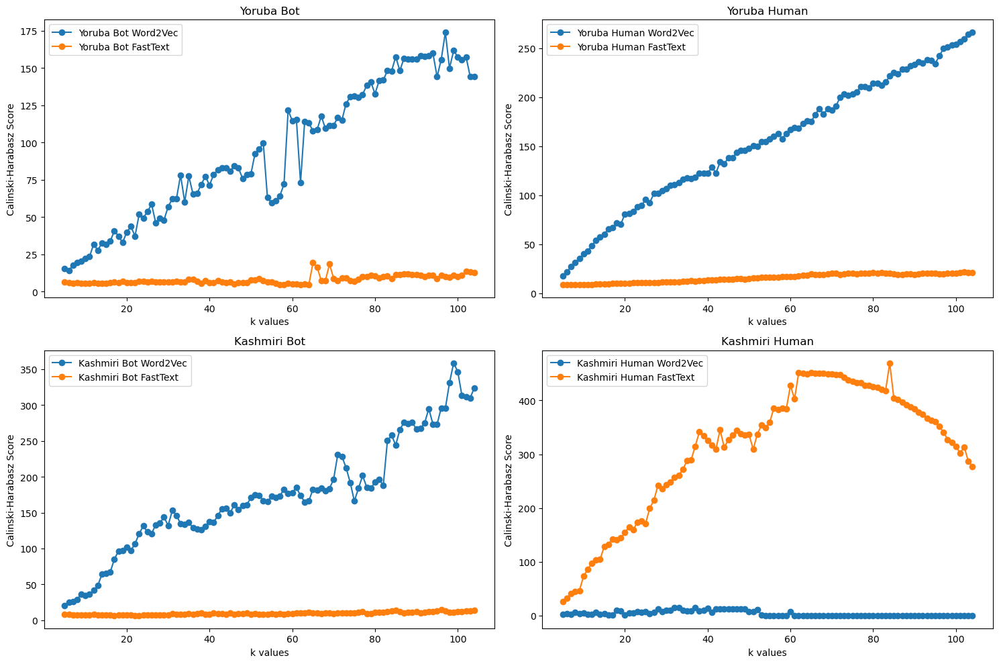

Best k values for each dataset:
Yoruba Bot Word2Vec: 97
Yoruba Human Word2Vec: 104
Kashmiri Bot Word2Vec: 99
Kashmiri Human Word2Vec: 32
Yoruba Bot FastText: 65
Yoruba Human FastText: 102
Kashmiri Bot FastText: 96
Kashmiri Human FastText: 84


In [29]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import calinski_harabasz_score
from tqdm import tqdm

# Define the datasets and their labels for easier management
languages = ['Yoruba', 'Kashmiri']
types = ['Bot', 'Human']
models = ['Word2Vec', 'FastText']
datasets = {
    'Yoruba Bot Word2Vec': vectors_yoruba_bot_wv,
    'Yoruba Human Word2Vec': vectors_yoruba_human_wv,
    'Kashmiri Bot Word2Vec': vectors_kashmiri_bot_wv,
    'Kashmiri Human Word2Vec': vectors_kashmiri_human_wv,
    'Yoruba Bot FastText': vectors_yoruba_bot_ft,
    'Yoruba Human FastText': vectors_yoruba_human_ft,
    'Kashmiri Bot FastText': vectors_kashmiri_bot_ft,
    'Kashmiri Human FastText': vectors_kashmiri_human_ft
}

# Define k and h values for each dataset
k_h_values = {
    'Yoruba Bot Word2Vec': {'k': 10, 'h': 15},
    'Yoruba Human Word2Vec': {'k': 58, 'h': 15},
    'Kashmiri Bot Word2Vec': {'k': 22, 'h': 15},
    'Kashmiri Human Word2Vec': {'k': 59, 'h': 15},
    'Yoruba Bot FastText': {'k': 59, 'h': 15},
    'Yoruba Human FastText': {'k': 6, 'h': 15},
    'Kashmiri Bot FastText': {'k': 58, 'h': 15},
    'Kashmiri Human FastText': {'k': 57, 'h': 15}
}

fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # Adjust subplot grid as necessary
axs = axs.flatten()
best_k_values = []

for idx, (lang_type, vectors) in enumerate(datasets.items()):
    k_values = range(5, 105)
    ch_scores = []
    max_ch_score = 0
    best_k = 0

    for k in tqdm(k_values, desc=f"Processing {lang_type}"):
        wishart = Wishart(wishart_neighbors=k, significance_level=k_h_values[lang_type]['h'])
        labels = wishart.fit(vectors)
        if np.unique(labels).size > 1:  # Ensure there's more than one cluster
            ch_score = calinski_harabasz_score(vectors, labels)
            ch_scores.append(ch_score)
            if ch_score > max_ch_score:
                max_ch_score = ch_score
                best_k = k
        else:
            ch_scores.append(0)  # Assign a zero score if only one cluster

    best_k_values.append(best_k)  # Append the best k for this dataset

    # Select the appropriate subplot based on language and type
    if 'Yoruba' in lang_type:
        plot_index = 0 if 'Bot' in lang_type else 1
    else:  # Kashmiri
        plot_index = 2 if 'Bot' in lang_type else 3

    # Plotting
    axs[plot_index].plot(k_values, ch_scores, marker='o', linestyle='-', label=f'{lang_type}')
    axs[plot_index].set_title(f'{languages[plot_index // 2]} {types[plot_index % 2]}')
    axs[plot_index].set_xlabel('k values')
    axs[plot_index].set_ylabel('Calinski-Harabasz Score')
    axs[plot_index].legend()

plt.tight_layout()
plt.show()

print("Best k values for each dataset:")
for name, k in zip(datasets, best_k_values):
    print(f"{name}: {k}")

Processing Yoruba Bot Word2Vec:   0%|                   | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Bot Word2Vec:   1%|           | 1/100 [00:01<03:07,  1.90s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   2%|▏          | 2/100 [00:03<02:58,  1.82s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   3%|▎          | 3/100 [00:05<02:56,  1.82s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   4%|▍          | 4/100 [00:08<03:35,  2.24s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   5%|▌          | 5/100 [00:10<03:21,  2.12s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   6%|▋          | 6/100 [00:12<03:10,  2.02s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   7%|▊          | 7/100 [00:13<03:03,  1.97s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   8%|▉          | 8/100 [00:16<03:05,  2.02s/it]

Start clustering


Processing Yoruba Bot Word2Vec:   9%|▉          | 9/100 [00:18<03:06,  2.05s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  10%|█         | 10/100 [00:20<03:02,  2.03s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  11%|█         | 11/100 [00:22<02:58,  2.01s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  12%|█▏        | 12/100 [00:24<02:55,  2.00s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  13%|█▎        | 13/100 [00:26<02:52,  1.98s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  14%|█▍        | 14/100 [00:28<02:50,  1.98s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  15%|█▌        | 15/100 [00:30<02:48,  1.99s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  16%|█▌        | 16/100 [00:32<02:48,  2.01s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  17%|█▋        | 17/100 [00:34<02:46,  2.01s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  18%|█▊        | 18/100 [00:36<02:45,  2.02s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  19%|█▉        | 19/100 [00:38<02:43,  2.02s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  20%|██        | 20/100 [00:40<02:42,  2.04s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  21%|██        | 21/100 [00:42<02:42,  2.06s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  22%|██▏       | 22/100 [00:44<02:40,  2.05s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  23%|██▎       | 23/100 [00:46<02:38,  2.06s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  24%|██▍       | 24/100 [00:48<02:37,  2.07s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  25%|██▌       | 25/100 [00:50<02:36,  2.08s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  26%|██▌       | 26/100 [00:52<02:35,  2.10s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  27%|██▋       | 27/100 [00:54<02:33,  2.10s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  28%|██▊       | 28/100 [00:57<02:31,  2.10s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  29%|██▉       | 29/100 [00:59<02:32,  2.14s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  30%|███       | 30/100 [01:01<02:31,  2.16s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  31%|███       | 31/100 [01:03<02:29,  2.16s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  32%|███▏      | 32/100 [01:05<02:26,  2.16s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  33%|███▎      | 33/100 [01:08<02:27,  2.21s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  34%|███▍      | 34/100 [01:10<02:25,  2.21s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  35%|███▌      | 35/100 [01:12<02:23,  2.21s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  36%|███▌      | 36/100 [01:14<02:21,  2.21s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  37%|███▋      | 37/100 [01:16<02:19,  2.22s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  38%|███▊      | 38/100 [01:19<02:19,  2.25s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  39%|███▉      | 39/100 [01:21<02:18,  2.28s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  40%|████      | 40/100 [01:23<02:15,  2.26s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  41%|████      | 41/100 [01:26<02:13,  2.26s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  42%|████▏     | 42/100 [01:28<02:11,  2.26s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  43%|████▎     | 43/100 [01:30<02:08,  2.26s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  44%|████▍     | 44/100 [01:32<02:07,  2.27s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  45%|████▌     | 45/100 [01:35<02:05,  2.28s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  46%|████▌     | 46/100 [01:37<02:04,  2.30s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  47%|████▋     | 47/100 [01:39<02:02,  2.32s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  48%|████▊     | 48/100 [01:42<02:01,  2.34s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  49%|████▉     | 49/100 [01:44<01:59,  2.34s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  50%|█████     | 50/100 [01:47<01:58,  2.38s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  51%|█████     | 51/100 [01:49<01:56,  2.37s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  52%|█████▏    | 52/100 [01:51<01:53,  2.36s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  53%|█████▎    | 53/100 [01:54<01:50,  2.36s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  54%|█████▍    | 54/100 [01:56<01:48,  2.36s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  55%|█████▌    | 55/100 [01:58<01:47,  2.38s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  56%|█████▌    | 56/100 [02:01<01:47,  2.45s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  57%|█████▋    | 57/100 [02:04<01:45,  2.45s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  58%|█████▊    | 58/100 [02:06<01:42,  2.44s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  59%|█████▉    | 59/100 [02:09<01:43,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  60%|██████    | 60/100 [02:11<01:40,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  61%|██████    | 61/100 [02:14<01:37,  2.49s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  62%|██████▏   | 62/100 [02:16<01:34,  2.49s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  63%|██████▎   | 63/100 [02:19<01:33,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  64%|██████▍   | 64/100 [02:21<01:31,  2.53s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  65%|██████▌   | 65/100 [02:24<01:28,  2.53s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  66%|██████▌   | 66/100 [02:26<01:25,  2.52s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  67%|██████▋   | 67/100 [02:29<01:22,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  68%|██████▊   | 68/100 [02:31<01:20,  2.52s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  69%|██████▉   | 69/100 [02:34<01:17,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  70%|███████   | 70/100 [02:36<01:15,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  71%|███████   | 71/100 [02:39<01:12,  2.51s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  72%|███████▏  | 72/100 [02:41<01:11,  2.55s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  73%|███████▎  | 73/100 [02:44<01:09,  2.58s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  74%|███████▍  | 74/100 [02:47<01:07,  2.59s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  75%|███████▌  | 75/100 [02:49<01:04,  2.60s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  76%|███████▌  | 76/100 [02:52<01:02,  2.60s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  77%|███████▋  | 77/100 [02:55<00:59,  2.60s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  78%|███████▊  | 78/100 [02:57<00:57,  2.60s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  79%|███████▉  | 79/100 [03:00<00:55,  2.63s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  80%|████████  | 80/100 [03:03<00:53,  2.65s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  81%|████████  | 81/100 [03:05<00:50,  2.65s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  82%|████████▏ | 82/100 [03:09<00:53,  2.98s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  83%|████████▎ | 83/100 [03:13<00:54,  3.23s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  84%|████████▍ | 84/100 [03:15<00:49,  3.07s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  85%|████████▌ | 85/100 [03:18<00:44,  2.95s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  86%|████████▌ | 86/100 [03:21<00:40,  2.89s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  87%|████████▋ | 87/100 [03:24<00:36,  2.83s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  88%|████████▊ | 88/100 [03:26<00:33,  2.79s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  89%|████████▉ | 89/100 [03:29<00:30,  2.76s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  90%|█████████ | 90/100 [03:32<00:27,  2.76s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  91%|█████████ | 91/100 [03:34<00:24,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  92%|█████████▏| 92/100 [03:37<00:21,  2.73s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  93%|█████████▎| 93/100 [03:40<00:19,  2.76s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  94%|█████████▍| 94/100 [03:43<00:16,  2.76s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  95%|█████████▌| 95/100 [03:45<00:13,  2.75s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  96%|█████████▌| 96/100 [03:48<00:11,  2.76s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  97%|█████████▋| 97/100 [03:51<00:08,  2.80s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  98%|█████████▊| 98/100 [03:54<00:05,  2.81s/it]

Start clustering


Processing Yoruba Bot Word2Vec:  99%|█████████▉| 99/100 [03:57<00:02,  2.80s/it]

Start clustering


Processing Yoruba Human Word2Vec:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Human Word2Vec:   1%|     | 1/100 [06:50<11:16:42, 410.12s/it]

Start clustering


Processing Yoruba Human Word2Vec:   2%|     | 2/100 [13:35<11:05:18, 407.33s/it]

Start clustering


Processing Yoruba Human Word2Vec:   3%|▏    | 3/100 [20:32<11:05:32, 411.67s/it]

Start clustering


Processing Yoruba Human Word2Vec:   4%|▏    | 4/100 [27:36<11:06:50, 416.77s/it]

Start clustering


Processing Yoruba Human Word2Vec:   5%|▎    | 5/100 [38:01<12:58:38, 491.77s/it]

Start clustering


Processing Yoruba Human Word2Vec:   6%|▎    | 6/100 [46:37<13:03:22, 500.03s/it]

Start clustering


Processing Yoruba Human Word2Vec:   7%|▎    | 7/100 [56:59<13:56:49, 539.89s/it]

Start clustering


Processing Yoruba Human Word2Vec:   8%|▏  | 8/100 [1:08:33<15:02:54, 588.85s/it]

Start clustering


Processing Yoruba Human Word2Vec:   9%|▎  | 9/100 [1:19:57<15:38:20, 618.69s/it]

Start clustering


Processing Yoruba Human Word2Vec:  10%|▏ | 10/100 [1:31:59<16:15:50, 650.56s/it]

Start clustering


Processing Yoruba Human Word2Vec:  11%|▏ | 11/100 [1:43:06<16:12:38, 655.71s/it]

Start clustering


Processing Yoruba Human Word2Vec:  12%|▏ | 12/100 [1:53:18<15:41:57, 642.25s/it]

Start clustering


Processing Yoruba Human Word2Vec:  13%|▎ | 13/100 [2:08:38<17:33:10, 726.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  14%|▎ | 14/100 [2:19:34<16:50:53, 705.27s/it]

Start clustering


Processing Yoruba Human Word2Vec:  15%|▎ | 15/100 [2:31:21<16:39:50, 705.78s/it]

Start clustering


Processing Yoruba Human Word2Vec:  16%|▎ | 16/100 [2:43:57<16:49:10, 720.84s/it]

Start clustering


Processing Yoruba Human Word2Vec:  17%|▎ | 17/100 [2:54:27<15:59:14, 693.43s/it]

Start clustering


Processing Yoruba Human Word2Vec:  18%|▎ | 18/100 [3:04:29<15:10:14, 666.03s/it]

Start clustering


Processing Yoruba Human Word2Vec:  19%|▍ | 19/100 [3:14:46<14:39:02, 651.14s/it]

Start clustering


Processing Yoruba Human Word2Vec:  20%|▍ | 20/100 [3:25:03<14:14:34, 640.94s/it]

Start clustering


Processing Yoruba Human Word2Vec:  21%|▍ | 21/100 [3:35:17<13:53:30, 633.04s/it]

Start clustering


Processing Yoruba Human Word2Vec:  22%|▍ | 22/100 [3:45:47<13:41:33, 631.97s/it]

Start clustering


Processing Yoruba Human Word2Vec:  23%|▍ | 23/100 [3:56:03<13:25:06, 627.35s/it]

Start clustering


Processing Yoruba Human Word2Vec:  24%|▍ | 24/100 [4:09:57<14:33:01, 689.23s/it]

Start clustering


Processing Yoruba Human Word2Vec:  25%|▌ | 25/100 [4:25:06<15:44:02, 755.24s/it]

Start clustering


Processing Yoruba Human Word2Vec:  26%|▌ | 26/100 [4:39:25<16:09:42, 786.25s/it]

Start clustering


Processing Yoruba Human Word2Vec:  27%|▌ | 27/100 [4:50:18<15:08:01, 746.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  28%|▌ | 28/100 [5:02:16<14:45:23, 737.83s/it]

Start clustering


Processing Yoruba Human Word2Vec:  29%|▌ | 29/100 [5:18:01<15:46:45, 800.08s/it]

Start clustering


Processing Yoruba Human Word2Vec:  30%|▌ | 30/100 [5:33:09<16:11:02, 832.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  31%|▌ | 31/100 [5:44:37<15:07:36, 789.23s/it]

Start clustering


Processing Yoruba Human Word2Vec:  32%|▋ | 32/100 [5:53:27<13:26:08, 711.30s/it]

Start clustering


Processing Yoruba Human Word2Vec:  33%|▋ | 33/100 [6:02:24<12:15:48, 658.93s/it]

Start clustering


Processing Yoruba Human Word2Vec:  34%|▋ | 34/100 [6:11:26<11:26:20, 623.95s/it]

Start clustering


Processing Yoruba Human Word2Vec:  35%|▋ | 35/100 [6:20:25<10:48:11, 598.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  36%|▋ | 36/100 [6:29:27<10:20:24, 581.64s/it]

Start clustering


Processing Yoruba Human Word2Vec:  37%|█  | 37/100 [6:38:30<9:58:25, 569.93s/it]

Start clustering


Processing Yoruba Human Word2Vec:  38%|█▏ | 38/100 [6:47:32<9:40:23, 561.67s/it]

Start clustering


Processing Yoruba Human Word2Vec:  39%|█▏ | 39/100 [6:56:44<9:27:52, 558.56s/it]

Start clustering


Processing Yoruba Human Word2Vec:  40%|█▏ | 40/100 [7:05:59<9:17:38, 557.64s/it]

Start clustering


Processing Yoruba Human Word2Vec:  41%|█▏ | 41/100 [7:15:12<9:06:51, 556.12s/it]

Start clustering


Processing Yoruba Human Word2Vec:  42%|█▎ | 42/100 [7:24:30<8:58:07, 556.67s/it]

Start clustering


Processing Yoruba Human Word2Vec:  43%|█▎ | 43/100 [7:33:45<8:48:31, 556.35s/it]

Start clustering


Processing Yoruba Human Word2Vec:  44%|█▎ | 44/100 [7:43:07<8:40:44, 557.93s/it]

Start clustering


Processing Yoruba Human Word2Vec:  45%|█▎ | 45/100 [7:52:30<8:32:50, 559.46s/it]

Start clustering


Processing Yoruba Human Word2Vec:  46%|█▍ | 46/100 [8:01:51<8:23:51, 559.84s/it]

Start clustering


Processing Yoruba Human Word2Vec:  47%|█▍ | 47/100 [8:11:16<8:16:03, 561.57s/it]

Start clustering


Processing Yoruba Human Word2Vec:  48%|█▍ | 48/100 [8:20:42<8:07:40, 562.70s/it]

Start clustering


Processing Yoruba Human Word2Vec:  49%|█▍ | 49/100 [8:30:12<8:00:21, 565.13s/it]

Start clustering


Processing Yoruba Human Word2Vec:  50%|█▌ | 50/100 [8:39:46<7:53:08, 567.76s/it]

Start clustering


Processing Yoruba Human Word2Vec:  51%|█▌ | 51/100 [8:49:18<7:44:32, 568.82s/it]

Start clustering


Processing Yoruba Human Word2Vec:  52%|█▌ | 52/100 [8:58:48<7:35:31, 569.41s/it]

Start clustering


Processing Yoruba Human Word2Vec:  53%|█▌ | 53/100 [9:08:24<7:27:37, 571.43s/it]

Start clustering


Processing Yoruba Human Word2Vec:  54%|█▌ | 54/100 [9:18:01<7:19:11, 572.86s/it]

Start clustering


Processing Yoruba Human Word2Vec:  55%|█▋ | 55/100 [9:27:43<7:11:48, 575.75s/it]

Start clustering


Processing Yoruba Human Word2Vec:  56%|█▋ | 56/100 [9:37:30<7:04:35, 578.98s/it]

Start clustering


Processing Yoruba Human Word2Vec:  57%|█▋ | 57/100 [9:47:09<6:54:58, 579.02s/it]

Start clustering


Processing Yoruba Human Word2Vec:  58%|█▋ | 58/100 [9:56:51<6:46:00, 580.02s/it]

Start clustering


Processing Yoruba Human Word2Vec:  59%|█▏| 59/100 [10:06:34<6:36:55, 580.86s/it]

Start clustering


Processing Yoruba Human Word2Vec:  60%|█▏| 60/100 [10:16:22<6:28:39, 583.00s/it]

Start clustering


Processing Yoruba Human Word2Vec:  61%|█▏| 61/100 [10:26:10<6:19:56, 584.52s/it]

Start clustering


Processing Yoruba Human Word2Vec:  62%|█▏| 62/100 [10:35:59<6:11:07, 585.99s/it]

Start clustering


Processing Yoruba Human Word2Vec:  63%|█▎| 63/100 [10:45:50<6:02:08, 587.25s/it]

Start clustering


Processing Yoruba Human Word2Vec:  64%|█▎| 64/100 [10:55:45<5:53:52, 589.80s/it]

Start clustering


Processing Yoruba Human Word2Vec:  65%|█▎| 65/100 [11:05:42<5:45:16, 591.91s/it]

Start clustering


Processing Yoruba Human Word2Vec:  66%|█▎| 66/100 [11:15:40<5:36:25, 593.70s/it]

Start clustering


Processing Yoruba Human Word2Vec:  67%|█▎| 67/100 [11:25:39<5:27:25, 595.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  68%|█▎| 68/100 [11:35:37<5:17:54, 596.07s/it]

Start clustering


Processing Yoruba Human Word2Vec:  69%|█▍| 69/100 [11:45:38<5:08:44, 597.55s/it]

Start clustering


Processing Yoruba Human Word2Vec:  70%|█▍| 70/100 [11:55:40<4:59:24, 598.82s/it]

Start clustering


Processing Yoruba Human Word2Vec:  71%|█▍| 71/100 [12:05:43<4:50:08, 600.29s/it]

Start clustering


Processing Yoruba Human Word2Vec:  72%|█▍| 72/100 [12:15:44<4:40:13, 600.49s/it]

Start clustering


Processing Yoruba Human Word2Vec:  73%|█▍| 73/100 [12:25:50<4:30:54, 602.00s/it]

Start clustering


Processing Yoruba Human Word2Vec:  74%|█▍| 74/100 [12:35:53<4:21:02, 602.41s/it]

Start clustering


Processing Yoruba Human Word2Vec:  75%|█▌| 75/100 [12:46:04<4:11:58, 604.76s/it]

Start clustering


Processing Yoruba Human Word2Vec:  76%|█▌| 76/100 [12:56:15<4:02:45, 606.88s/it]

Start clustering


Processing Yoruba Human Word2Vec:  77%|█▌| 77/100 [13:06:25<3:52:54, 607.60s/it]

Start clustering


Processing Yoruba Human Word2Vec:  78%|█▌| 78/100 [13:16:35<3:43:06, 608.48s/it]

Start clustering


Processing Yoruba Human Word2Vec:  79%|█▌| 79/100 [13:26:52<3:33:48, 610.88s/it]

Start clustering


Processing Yoruba Human Word2Vec:  80%|█▌| 80/100 [13:37:11<3:24:26, 613.32s/it]

Start clustering


Processing Yoruba Human Word2Vec:  81%|█▌| 81/100 [13:47:25<3:14:16, 613.52s/it]

Start clustering


Processing Yoruba Human Word2Vec:  82%|█▋| 82/100 [13:57:42<3:04:22, 614.60s/it]

Start clustering


Processing Yoruba Human Word2Vec:  83%|█▋| 83/100 [14:08:01<2:54:31, 615.98s/it]

Start clustering


Processing Yoruba Human Word2Vec:  84%|█▋| 84/100 [14:18:20<2:44:28, 616.79s/it]

Start clustering


Processing Yoruba Human Word2Vec:  85%|█▋| 85/100 [14:28:46<2:34:54, 619.62s/it]

Start clustering


Processing Yoruba Human Word2Vec:  86%|█▋| 86/100 [14:39:07<2:24:42, 620.16s/it]

Start clustering


Processing Yoruba Human Word2Vec:  87%|█▋| 87/100 [14:49:36<2:14:53, 622.60s/it]

Start clustering


Processing Yoruba Human Word2Vec:  88%|█▊| 88/100 [15:00:03<2:04:48, 624.01s/it]

Start clustering


Processing Yoruba Human Word2Vec:  89%|█▊| 89/100 [15:10:31<1:54:38, 625.34s/it]

Start clustering


Processing Yoruba Human Word2Vec:  90%|█▊| 90/100 [15:21:01<1:44:25, 626.51s/it]

Start clustering


Processing Yoruba Human Word2Vec:  91%|█▊| 91/100 [15:31:35<1:34:19, 628.80s/it]

Start clustering


Processing Yoruba Human Word2Vec:  92%|█▊| 92/100 [15:42:09<1:24:03, 630.38s/it]

Start clustering


Processing Yoruba Human Word2Vec:  93%|█▊| 93/100 [15:52:42<1:13:39, 631.30s/it]

Start clustering


Processing Yoruba Human Word2Vec:  94%|█▉| 94/100 [16:03:17<1:03:14, 632.47s/it]

Start clustering


Processing Yoruba Human Word2Vec:  95%|███▊| 95/100 [16:15:28<55:09, 661.90s/it]

Start clustering


Processing Yoruba Human Word2Vec:  96%|███▊| 96/100 [16:28:10<46:07, 691.79s/it]

Start clustering


Processing Yoruba Human Word2Vec:  97%|███▉| 97/100 [16:39:24<34:20, 686.73s/it]

Start clustering


Processing Yoruba Human Word2Vec:  98%|███▉| 98/100 [16:52:14<23:42, 711.49s/it]

Start clustering


Processing Yoruba Human Word2Vec:  99%|███▉| 99/100 [17:07:18<12:49, 769.32s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Bot Word2Vec:   1%|         | 1/100 [00:01<03:09,  1.92s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   2%|▏        | 2/100 [00:03<02:53,  1.77s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   3%|▎        | 3/100 [00:05<02:47,  1.73s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   4%|▎        | 4/100 [00:07<03:00,  1.88s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   5%|▍        | 5/100 [00:09<02:58,  1.88s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   6%|▌        | 6/100 [00:11<03:18,  2.11s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   7%|▋        | 7/100 [00:15<04:16,  2.75s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   8%|▋        | 8/100 [00:17<03:51,  2.52s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:   9%|▊        | 9/100 [00:19<03:30,  2.31s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  10%|▊       | 10/100 [00:23<03:58,  2.65s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  11%|▉       | 11/100 [00:25<03:46,  2.54s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  12%|▉       | 12/100 [00:27<03:27,  2.36s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  13%|█       | 13/100 [00:29<03:16,  2.26s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  14%|█       | 14/100 [00:32<03:39,  2.56s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  15%|█▏      | 15/100 [00:34<03:22,  2.38s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  16%|█▎      | 16/100 [00:36<03:16,  2.34s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  17%|█▎      | 17/100 [00:39<03:24,  2.47s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  18%|█▍      | 18/100 [00:42<03:24,  2.50s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  19%|█▌      | 19/100 [00:45<03:34,  2.65s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  20%|█▌      | 20/100 [00:47<03:26,  2.58s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  21%|█▋      | 21/100 [00:50<03:25,  2.61s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  22%|█▊      | 22/100 [00:52<03:18,  2.55s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  23%|█▊      | 23/100 [00:56<03:44,  2.91s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  24%|█▉      | 24/100 [00:58<03:31,  2.79s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  25%|██      | 25/100 [01:01<03:11,  2.56s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  26%|██      | 26/100 [01:03<02:57,  2.40s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  27%|██▏     | 27/100 [01:05<02:46,  2.28s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  28%|██▏     | 28/100 [01:07<02:38,  2.20s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  29%|██▎     | 29/100 [01:09<02:32,  2.15s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  30%|██▍     | 30/100 [01:11<02:28,  2.12s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  31%|██▍     | 31/100 [01:13<02:24,  2.10s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  32%|██▌     | 32/100 [01:15<02:21,  2.08s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  33%|██▋     | 33/100 [01:17<02:18,  2.06s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  34%|██▋     | 34/100 [01:19<02:17,  2.08s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  35%|██▊     | 35/100 [01:21<02:15,  2.08s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  36%|██▉     | 36/100 [01:23<02:13,  2.09s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  37%|██▉     | 37/100 [01:25<02:12,  2.10s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  38%|███     | 38/100 [01:28<02:15,  2.19s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  39%|███     | 39/100 [01:30<02:12,  2.17s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  40%|███▏    | 40/100 [01:32<02:10,  2.17s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  41%|███▎    | 41/100 [01:34<02:10,  2.20s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  42%|███▎    | 42/100 [01:36<02:07,  2.21s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  43%|███▍    | 43/100 [01:39<02:05,  2.20s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  44%|███▌    | 44/100 [01:41<02:03,  2.21s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  45%|███▌    | 45/100 [01:43<02:01,  2.21s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  46%|███▋    | 46/100 [01:45<02:00,  2.23s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  47%|███▊    | 47/100 [01:48<01:58,  2.23s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  48%|███▊    | 48/100 [01:50<02:03,  2.37s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  49%|███▉    | 49/100 [01:53<02:01,  2.37s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  50%|████    | 50/100 [01:55<01:56,  2.34s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  51%|████    | 51/100 [01:57<01:54,  2.33s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  52%|████▏   | 52/100 [01:59<01:51,  2.32s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  53%|████▏   | 53/100 [02:02<01:50,  2.35s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  54%|████▎   | 54/100 [02:04<01:47,  2.34s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  55%|████▍   | 55/100 [02:07<01:45,  2.34s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  56%|████▍   | 56/100 [02:09<01:42,  2.34s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  57%|████▌   | 57/100 [02:11<01:40,  2.34s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  58%|████▋   | 58/100 [02:14<01:37,  2.33s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  59%|████▋   | 59/100 [02:16<01:35,  2.33s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  60%|████▊   | 60/100 [02:18<01:33,  2.35s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  61%|████▉   | 61/100 [02:21<01:37,  2.49s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  62%|████▉   | 62/100 [02:23<01:33,  2.46s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  63%|█████   | 63/100 [02:26<01:30,  2.44s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  64%|█████   | 64/100 [02:30<01:43,  2.86s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  65%|█████▏  | 65/100 [02:35<02:04,  3.54s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  66%|█████▎  | 66/100 [02:39<02:04,  3.67s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  67%|█████▎  | 67/100 [02:42<01:53,  3.45s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  68%|█████▍  | 68/100 [02:47<02:11,  4.10s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  69%|█████▌  | 69/100 [02:53<02:25,  4.69s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  70%|█████▌  | 70/100 [03:00<02:38,  5.28s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  71%|█████▋  | 71/100 [03:09<03:04,  6.35s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  72%|█████▊  | 72/100 [03:12<02:30,  5.38s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  73%|█████▊  | 73/100 [03:15<02:03,  4.58s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  74%|█████▉  | 74/100 [03:17<01:43,  3.99s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  75%|██████  | 75/100 [03:21<01:33,  3.76s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  76%|██████  | 76/100 [03:25<01:33,  3.91s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  77%|██████▏ | 77/100 [03:29<01:31,  3.96s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  78%|██████▏ | 78/100 [03:32<01:18,  3.57s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  79%|██████▎ | 79/100 [03:35<01:13,  3.51s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  80%|██████▍ | 80/100 [03:39<01:13,  3.68s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  81%|██████▍ | 81/100 [03:42<01:08,  3.58s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  82%|██████▌ | 82/100 [03:46<01:02,  3.50s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  83%|██████▋ | 83/100 [03:50<01:03,  3.71s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  84%|██████▋ | 84/100 [03:56<01:10,  4.40s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  85%|██████▊ | 85/100 [04:00<01:03,  4.25s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  86%|██████▉ | 86/100 [04:04<00:59,  4.23s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  87%|██████▉ | 87/100 [04:07<00:51,  3.95s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  88%|███████ | 88/100 [04:12<00:50,  4.24s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  89%|███████ | 89/100 [04:17<00:47,  4.31s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  90%|███████▏| 90/100 [04:20<00:39,  3.90s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  91%|███████▎| 91/100 [04:23<00:32,  3.64s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  92%|███████▎| 92/100 [04:25<00:27,  3.39s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  93%|███████▍| 93/100 [04:28<00:22,  3.19s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  94%|███████▌| 94/100 [04:31<00:18,  3.06s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  95%|███████▌| 95/100 [04:34<00:14,  2.97s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  96%|███████▋| 96/100 [04:39<00:14,  3.71s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  97%|███████▊| 97/100 [04:43<00:10,  3.63s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  98%|███████▊| 98/100 [04:45<00:06,  3.39s/it]

Start clustering


Processing Kashmiri Bot Word2Vec:  99%|███████▉| 99/100 [04:48<00:03,  3.31s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   0%|               | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Human Word2Vec:   1%|   | 1/100 [06:33<10:49:42, 393.76s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   2%|   | 2/100 [13:26<11:01:27, 404.98s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   3%|   | 3/100 [21:07<11:35:41, 430.32s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   4%|   | 4/100 [29:25<12:11:29, 457.18s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   5%|▏  | 5/100 [39:06<13:14:33, 501.82s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   6%|▏  | 6/100 [49:00<13:55:27, 533.27s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   7%|▏  | 7/100 [56:29<13:03:54, 505.75s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   8%| | 8/100 [1:05:08<13:02:00, 510.00s/it]

Start clustering


Processing Kashmiri Human Word2Vec:   9%| | 9/100 [1:15:04<13:34:10, 536.82s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  10%| | 10/100 [1:22:57<12:55:40, 517.12s/it

Start clustering


Processing Kashmiri Human Word2Vec:  11%| | 11/100 [1:33:19<13:34:31, 549.11s/it

Start clustering


Processing Kashmiri Human Word2Vec:  12%| | 12/100 [1:40:47<12:40:24, 518.46s/it

Start clustering


Processing Kashmiri Human Word2Vec:  13%|▏| 13/100 [1:47:14<11:33:43, 478.43s/it

Start clustering


Processing Kashmiri Human Word2Vec:  14%|▏| 14/100 [1:53:33<10:43:01, 448.62s/it

Start clustering


Processing Kashmiri Human Word2Vec:  15%|▏| 15/100 [1:59:47<10:03:35, 426.07s/it

Start clustering


Processing Kashmiri Human Word2Vec:  16%|▏| 16/100 [2:05:59<9:33:47, 409.86s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  17%|▏| 17/100 [2:12:15<9:12:56, 399.72s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  18%|▏| 18/100 [2:18:33<8:57:16, 393.13s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  19%|▏| 19/100 [2:24:46<8:42:39, 387.15s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  20%|▏| 20/100 [2:31:00<8:30:56, 383.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  21%|▏| 21/100 [2:37:17<8:22:05, 381.34s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  22%|▏| 22/100 [2:43:34<8:13:50, 379.88s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  23%|▏| 23/100 [2:50:17<8:16:35, 386.96s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  24%|▏| 24/100 [2:56:45<8:10:29, 387.24s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  25%|▎| 25/100 [3:03:06<8:01:47, 385.43s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  26%|▎| 26/100 [3:09:35<7:56:35, 386.43s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  27%|▎| 27/100 [3:15:58<7:48:40, 385.22s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  28%|▎| 28/100 [3:22:21<7:41:40, 384.73s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  29%|▎| 29/100 [3:28:44<7:34:38, 384.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  30%|▎| 30/100 [3:35:10<7:28:46, 384.66s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  31%|▎| 31/100 [3:41:38<7:23:33, 385.71s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  32%|▎| 32/100 [3:47:57<7:14:53, 383.73s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  33%|▎| 33/100 [3:54:29<7:11:11, 386.14s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  34%|▎| 34/100 [4:00:54<7:04:26, 385.85s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  35%|▎| 35/100 [4:07:18<6:57:17, 385.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  36%|▎| 36/100 [4:13:46<6:51:57, 386.21s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  37%|▎| 37/100 [4:20:12<6:45:28, 386.17s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  38%|▍| 38/100 [4:26:42<6:40:07, 387.23s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  39%|▍| 39/100 [4:33:10<6:33:48, 387.36s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  40%|▍| 40/100 [4:39:43<6:29:13, 389.23s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  41%|▍| 41/100 [4:46:08<6:21:26, 387.91s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  42%|▍| 42/100 [4:54:26<6:46:53, 420.92s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  43%|▍| 43/100 [5:03:24<7:13:04, 455.87s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  44%|▍| 44/100 [5:11:46<7:18:38, 469.97s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  45%|▍| 45/100 [5:19:26<7:07:50, 466.74s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  46%|▍| 46/100 [5:27:52<7:10:46, 478.64s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  47%|▍| 47/100 [5:36:53<7:19:21, 497.39s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  48%|▍| 48/100 [5:45:25<7:14:50, 501.73s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  49%|▍| 49/100 [5:52:35<6:48:04, 480.10s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  50%|▌| 50/100 [5:59:32<6:24:29, 461.38s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  51%|▌| 51/100 [6:07:16<6:17:19, 462.03s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  52%|▌| 52/100 [6:15:01<6:10:21, 462.96s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  53%|▌| 53/100 [6:21:28<5:44:49, 440.19s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  54%|▌| 54/100 [6:27:51<5:24:13, 422.91s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  55%|▌| 55/100 [6:34:10<5:07:28, 409.96s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  56%|▌| 56/100 [6:40:31<4:54:12, 401.20s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  57%|▌| 57/100 [6:46:47<4:42:08, 393.68s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  58%|▌| 58/100 [6:53:04<4:31:59, 388.56s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  59%|▌| 59/100 [6:59:35<4:26:06, 389.42s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  60%|▌| 60/100 [7:05:53<4:17:16, 385.92s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  61%|▌| 61/100 [7:12:15<4:10:06, 384.79s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  62%|▌| 62/100 [7:18:31<4:01:57, 382.05s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  63%|▋| 63/100 [7:24:55<3:55:57, 382.64s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  64%|▋| 64/100 [7:31:15<3:49:10, 381.96s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  65%|▋| 65/100 [7:37:33<3:42:01, 380.61s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  66%|▋| 66/100 [7:44:01<3:36:53, 382.74s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  67%|▋| 67/100 [7:50:24<3:30:39, 383.02s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  68%|▋| 68/100 [7:56:45<3:23:57, 382.41s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  69%|▋| 69/100 [8:03:02<3:16:41, 380.70s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  70%|▋| 70/100 [8:09:25<3:10:41, 381.37s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  71%|▋| 71/100 [8:15:40<3:03:29, 379.64s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  72%|▋| 72/100 [8:21:59<2:56:59, 379.27s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  73%|▋| 73/100 [8:28:16<2:50:26, 378.74s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  74%|▋| 74/100 [8:34:43<2:45:12, 381.26s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  75%|▊| 75/100 [8:41:12<2:39:44, 383.37s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  76%|▊| 76/100 [8:50:05<2:51:19, 428.31s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  77%|▊| 77/100 [8:56:27<2:38:52, 414.47s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  78%|▊| 78/100 [9:02:46<2:28:00, 403.66s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  79%|▊| 79/100 [9:09:06<2:18:50, 396.67s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  80%|▊| 80/100 [9:15:39<2:11:50, 395.53s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  81%|▊| 81/100 [9:24:47<2:19:43, 441.25s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  82%|▊| 82/100 [9:34:11<2:23:29, 478.29s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  83%|▊| 83/100 [9:43:19<2:21:22, 498.98s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  84%|▊| 84/100 [9:52:49<2:18:44, 520.30s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  85%|▊| 85/100 [10:02:40<2:15:25, 541.71s/it

Start clustering


Processing Kashmiri Human Word2Vec:  86%|▊| 86/100 [10:11:48<2:06:47, 543.42s/it

Start clustering


Processing Kashmiri Human Word2Vec:  87%|▊| 87/100 [10:21:01<1:58:21, 546.27s/it

Start clustering


Processing Kashmiri Human Word2Vec:  88%|▉| 88/100 [10:29:50<1:48:12, 541.05s/it

Start clustering


Processing Kashmiri Human Word2Vec:  89%|▉| 89/100 [10:38:13<1:37:06, 529.66s/it

Start clustering


Processing Kashmiri Human Word2Vec:  90%|▉| 90/100 [10:45:53<1:24:49, 508.93s/it

Start clustering


Processing Kashmiri Human Word2Vec:  91%|▉| 91/100 [10:52:55<1:12:25, 482.86s/it

Start clustering


Processing Kashmiri Human Word2Vec:  92%|▉| 92/100 [11:01:07<1:04:43, 485.42s/it

Start clustering


Processing Kashmiri Human Word2Vec:  93%|█▊| 93/100 [11:07:56<53:57, 462.46s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  94%|█▉| 94/100 [11:17:25<49:27, 494.60s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  95%|█▉| 95/100 [11:27:19<43:41, 524.24s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  96%|█▉| 96/100 [11:36:37<35:37, 534.48s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  97%|█▉| 97/100 [11:43:30<24:54, 498.05s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  98%|█▉| 98/100 [11:50:16<15:40, 470.33s/it]

Start clustering


Processing Kashmiri Human Word2Vec:  99%|█▉| 99/100 [11:57:09<07:33, 453.09s/it]

Start clustering


Processing Yoruba Bot FastText:   0%|                   | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Bot FastText:   1%|           | 1/100 [00:02<04:46,  2.89s/it]

Start clustering


Processing Yoruba Bot FastText:   2%|▏          | 2/100 [00:05<04:27,  2.73s/it]

Start clustering


Processing Yoruba Bot FastText:   3%|▎          | 3/100 [00:07<03:32,  2.19s/it]

Start clustering


Processing Yoruba Bot FastText:   4%|▍          | 4/100 [00:08<03:06,  1.94s/it]

Start clustering


Processing Yoruba Bot FastText:   5%|▌          | 5/100 [00:10<03:06,  1.97s/it]

Start clustering


Processing Yoruba Bot FastText:   6%|▋          | 6/100 [00:13<03:46,  2.41s/it]

Start clustering


Processing Yoruba Bot FastText:   7%|▊          | 7/100 [00:16<03:55,  2.54s/it]

Start clustering


Processing Yoruba Bot FastText:   8%|▉          | 8/100 [00:18<03:38,  2.37s/it]

Start clustering


Processing Yoruba Bot FastText:   9%|▉          | 9/100 [00:22<04:02,  2.66s/it]

Start clustering


Processing Yoruba Bot FastText:  10%|█         | 10/100 [00:24<03:59,  2.66s/it]

Start clustering


Processing Yoruba Bot FastText:  11%|█         | 11/100 [00:26<03:27,  2.33s/it]

Start clustering


Processing Yoruba Bot FastText:  12%|█▏        | 12/100 [00:28<03:26,  2.34s/it]

Start clustering


Processing Yoruba Bot FastText:  13%|█▎        | 13/100 [00:30<03:22,  2.33s/it]

Start clustering


Processing Yoruba Bot FastText:  14%|█▍        | 14/100 [00:33<03:16,  2.29s/it]

Start clustering


Processing Yoruba Bot FastText:  15%|█▌        | 15/100 [00:34<03:01,  2.13s/it]

Start clustering


Processing Yoruba Bot FastText:  16%|█▌        | 16/100 [00:36<02:52,  2.06s/it]

Start clustering


Processing Yoruba Bot FastText:  17%|█▋        | 17/100 [00:38<02:53,  2.09s/it]

Start clustering


Processing Yoruba Bot FastText:  18%|█▊        | 18/100 [00:40<02:42,  1.98s/it]

Start clustering


Processing Yoruba Bot FastText:  19%|█▉        | 19/100 [00:42<02:34,  1.91s/it]

Start clustering


Processing Yoruba Bot FastText:  20%|██        | 20/100 [00:45<03:00,  2.26s/it]

Start clustering


Processing Yoruba Bot FastText:  21%|██        | 21/100 [00:49<03:32,  2.68s/it]

Start clustering


Processing Yoruba Bot FastText:  22%|██▏       | 22/100 [00:51<03:28,  2.67s/it]

Start clustering


Processing Yoruba Bot FastText:  23%|██▎       | 23/100 [00:53<03:04,  2.40s/it]

Start clustering


Processing Yoruba Bot FastText:  24%|██▍       | 24/100 [00:55<02:43,  2.15s/it]

Start clustering


Processing Yoruba Bot FastText:  25%|██▌       | 25/100 [00:58<02:59,  2.40s/it]

Start clustering


Processing Yoruba Bot FastText:  26%|██▌       | 26/100 [01:01<03:22,  2.74s/it]

Start clustering


Processing Yoruba Bot FastText:  27%|██▋       | 27/100 [01:04<03:11,  2.63s/it]

Start clustering


Processing Yoruba Bot FastText:  28%|██▊       | 28/100 [01:06<03:12,  2.67s/it]

Start clustering


Processing Yoruba Bot FastText:  29%|██▉       | 29/100 [01:10<03:34,  3.02s/it]

Start clustering


Processing Yoruba Bot FastText:  30%|███       | 30/100 [01:13<03:25,  2.93s/it]

Start clustering


Processing Yoruba Bot FastText:  31%|███       | 31/100 [01:15<02:57,  2.58s/it]

Start clustering


Processing Yoruba Bot FastText:  32%|███▏      | 32/100 [01:16<02:34,  2.27s/it]

Start clustering


Processing Yoruba Bot FastText:  33%|███▎      | 33/100 [01:18<02:17,  2.06s/it]

Start clustering


Processing Yoruba Bot FastText:  34%|███▍      | 34/100 [01:19<02:06,  1.91s/it]

Start clustering


Processing Yoruba Bot FastText:  35%|███▌      | 35/100 [01:21<01:58,  1.82s/it]

Start clustering


Processing Yoruba Bot FastText:  36%|███▌      | 36/100 [01:23<01:56,  1.82s/it]

Start clustering


Processing Yoruba Bot FastText:  37%|███▋      | 37/100 [01:25<01:54,  1.82s/it]

Start clustering


Processing Yoruba Bot FastText:  38%|███▊      | 38/100 [01:26<01:52,  1.81s/it]

Start clustering


Processing Yoruba Bot FastText:  39%|███▉      | 39/100 [01:28<01:51,  1.84s/it]

Start clustering


Processing Yoruba Bot FastText:  40%|████      | 40/100 [01:30<01:51,  1.86s/it]

Start clustering


Processing Yoruba Bot FastText:  41%|████      | 41/100 [01:32<01:50,  1.88s/it]

Start clustering


Processing Yoruba Bot FastText:  42%|████▏     | 42/100 [01:34<01:54,  1.97s/it]

Start clustering


Processing Yoruba Bot FastText:  43%|████▎     | 43/100 [01:36<01:52,  1.97s/it]

Start clustering


Processing Yoruba Bot FastText:  44%|████▍     | 44/100 [01:38<01:45,  1.89s/it]

Start clustering


Processing Yoruba Bot FastText:  45%|████▌     | 45/100 [01:40<01:46,  1.93s/it]

Start clustering


Processing Yoruba Bot FastText:  46%|████▌     | 46/100 [01:42<01:51,  2.06s/it]

Start clustering


Processing Yoruba Bot FastText:  47%|████▋     | 47/100 [01:44<01:49,  2.06s/it]

Start clustering


Processing Yoruba Bot FastText:  48%|████▊     | 48/100 [01:47<01:58,  2.28s/it]

Start clustering


Processing Yoruba Bot FastText:  49%|████▉     | 49/100 [01:51<02:18,  2.71s/it]

Start clustering


Processing Yoruba Bot FastText:  50%|█████     | 50/100 [01:56<02:51,  3.42s/it]

Start clustering


Processing Yoruba Bot FastText:  51%|█████     | 51/100 [02:00<03:03,  3.74s/it]

Start clustering


Processing Yoruba Bot FastText:  52%|█████▏    | 52/100 [02:03<02:47,  3.48s/it]

Start clustering


Processing Yoruba Bot FastText:  53%|█████▎    | 53/100 [02:06<02:38,  3.36s/it]

Start clustering


Processing Yoruba Bot FastText:  54%|█████▍    | 54/100 [02:09<02:29,  3.26s/it]

Start clustering


Processing Yoruba Bot FastText:  55%|█████▌    | 55/100 [02:15<02:54,  3.87s/it]

Start clustering


Processing Yoruba Bot FastText:  56%|█████▌    | 56/100 [02:18<02:47,  3.81s/it]

Start clustering


Processing Yoruba Bot FastText:  57%|█████▋    | 57/100 [02:21<02:29,  3.47s/it]

Start clustering


Processing Yoruba Bot FastText:  58%|█████▊    | 58/100 [02:23<02:10,  3.11s/it]

Start clustering


Processing Yoruba Bot FastText:  59%|█████▉    | 59/100 [02:27<02:09,  3.16s/it]

Start clustering


Processing Yoruba Bot FastText:  60%|██████    | 60/100 [02:30<02:11,  3.29s/it]

Start clustering


Processing Yoruba Bot FastText:  61%|██████    | 61/100 [02:33<02:05,  3.21s/it]

Start clustering


Processing Yoruba Bot FastText:  62%|██████▏   | 62/100 [02:36<01:54,  3.02s/it]

Start clustering


Processing Yoruba Bot FastText:  63%|██████▎   | 63/100 [02:39<01:51,  3.00s/it]

Start clustering


Processing Yoruba Bot FastText:  64%|██████▍   | 64/100 [02:43<01:56,  3.23s/it]

Start clustering


Processing Yoruba Bot FastText:  65%|██████▌   | 65/100 [02:47<02:09,  3.71s/it]

Start clustering


Processing Yoruba Bot FastText:  66%|██████▌   | 66/100 [02:50<01:53,  3.34s/it]

Start clustering


Processing Yoruba Bot FastText:  67%|██████▋   | 67/100 [02:52<01:42,  3.09s/it]

Start clustering


Processing Yoruba Bot FastText:  68%|██████▊   | 68/100 [02:55<01:30,  2.83s/it]

Start clustering


Processing Yoruba Bot FastText:  69%|██████▉   | 69/100 [02:57<01:21,  2.64s/it]

Start clustering


Processing Yoruba Bot FastText:  70%|███████   | 70/100 [03:00<01:24,  2.83s/it]

Start clustering


Processing Yoruba Bot FastText:  71%|███████   | 71/100 [03:03<01:19,  2.74s/it]

Start clustering


Processing Yoruba Bot FastText:  72%|███████▏  | 72/100 [03:09<01:44,  3.74s/it]

Start clustering


Processing Yoruba Bot FastText:  73%|███████▎  | 73/100 [03:13<01:47,  3.97s/it]

Start clustering


Processing Yoruba Bot FastText:  74%|███████▍  | 74/100 [03:17<01:44,  4.02s/it]

Start clustering


Processing Yoruba Bot FastText:  75%|███████▌  | 75/100 [03:24<01:58,  4.73s/it]

Start clustering


Processing Yoruba Bot FastText:  76%|███████▌  | 76/100 [03:28<01:49,  4.58s/it]

Start clustering


Processing Yoruba Bot FastText:  77%|███████▋  | 77/100 [03:33<01:50,  4.79s/it]

Start clustering


Processing Yoruba Bot FastText:  78%|███████▊  | 78/100 [03:36<01:30,  4.13s/it]

Start clustering


Processing Yoruba Bot FastText:  79%|███████▉  | 79/100 [03:39<01:19,  3.77s/it]

Start clustering


Processing Yoruba Bot FastText:  80%|████████  | 80/100 [03:42<01:12,  3.60s/it]

Start clustering


Processing Yoruba Bot FastText:  81%|████████  | 81/100 [03:44<01:01,  3.22s/it]

Start clustering


Processing Yoruba Bot FastText:  82%|████████▏ | 82/100 [03:47<00:54,  3.01s/it]

Start clustering


Processing Yoruba Bot FastText:  83%|████████▎ | 83/100 [03:50<00:50,  2.96s/it]

Start clustering


Processing Yoruba Bot FastText:  84%|████████▍ | 84/100 [03:53<00:48,  3.04s/it]

Start clustering


Processing Yoruba Bot FastText:  85%|████████▌ | 85/100 [03:57<00:51,  3.42s/it]

Start clustering


Processing Yoruba Bot FastText:  86%|████████▌ | 86/100 [04:00<00:47,  3.39s/it]

Start clustering


Processing Yoruba Bot FastText:  87%|████████▋ | 87/100 [04:04<00:44,  3.39s/it]

Start clustering


Processing Yoruba Bot FastText:  88%|████████▊ | 88/100 [04:07<00:38,  3.19s/it]

Start clustering


Processing Yoruba Bot FastText:  89%|████████▉ | 89/100 [04:09<00:33,  3.03s/it]

Start clustering


Processing Yoruba Bot FastText:  90%|█████████ | 90/100 [04:13<00:31,  3.18s/it]

Start clustering


Processing Yoruba Bot FastText:  91%|█████████ | 91/100 [04:19<00:37,  4.13s/it]

Start clustering


Processing Yoruba Bot FastText:  92%|█████████▏| 92/100 [04:26<00:38,  4.82s/it]

Start clustering


Processing Yoruba Bot FastText:  93%|█████████▎| 93/100 [04:30<00:33,  4.83s/it]

Start clustering


Processing Yoruba Bot FastText:  94%|█████████▍| 94/100 [04:34<00:26,  4.47s/it]

Start clustering


Processing Yoruba Bot FastText:  95%|█████████▌| 95/100 [04:37<00:20,  4.02s/it]

Start clustering


Processing Yoruba Bot FastText:  96%|█████████▌| 96/100 [04:39<00:14,  3.51s/it]

Start clustering


Processing Yoruba Bot FastText:  97%|█████████▋| 97/100 [04:42<00:09,  3.24s/it]

Start clustering


Processing Yoruba Bot FastText:  98%|█████████▊| 98/100 [04:45<00:06,  3.10s/it]

Start clustering


Processing Yoruba Bot FastText:  99%|█████████▉| 99/100 [04:49<00:03,  3.42s/it]

Start clustering


Processing Yoruba Human FastText:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Yoruba Human FastText:   1%|     | 1/100 [06:19<10:25:31, 379.10s/it]

Start clustering


Processing Yoruba Human FastText:   2%|      | 2/100 [11:49<9:32:36, 350.58s/it]

Start clustering


Processing Yoruba Human FastText:   3%|▏     | 3/100 [16:50<8:50:07, 327.91s/it]

Start clustering


Processing Yoruba Human FastText:   4%|▏     | 4/100 [23:18<9:22:31, 351.58s/it]

Start clustering


Processing Yoruba Human FastText:   5%|▎     | 5/100 [29:18<9:21:17, 354.50s/it]

Start clustering


Processing Yoruba Human FastText:   6%|▎     | 6/100 [35:57<9:39:06, 369.65s/it]

Start clustering


Processing Yoruba Human FastText:   7%|▎    | 7/100 [43:41<10:20:49, 400.53s/it]

Start clustering


Processing Yoruba Human FastText:   8%|▍    | 8/100 [51:50<10:57:35, 428.87s/it]

Start clustering


Processing Yoruba Human FastText:   9%|▎  | 9/100 [1:00:00<11:19:25, 447.97s/it]

Start clustering


Processing Yoruba Human FastText:  10%|▏ | 10/100 [1:05:43<10:23:15, 415.50s/it]

Start clustering


Processing Yoruba Human FastText:  11%|▏ | 11/100 [1:14:03<10:54:36, 441.31s/it]

Start clustering


Processing Yoruba Human FastText:  12%|▏ | 12/100 [1:21:45<10:56:32, 447.64s/it]

Start clustering


Processing Yoruba Human FastText:  13%|▎ | 13/100 [1:28:26<10:28:35, 433.51s/it]

Start clustering


Processing Yoruba Human FastText:  14%|▍  | 14/100 [1:33:13<9:18:01, 389.32s/it]

Start clustering


Processing Yoruba Human FastText:  15%|▍  | 15/100 [1:38:50<8:49:03, 373.46s/it]

Start clustering


Processing Yoruba Human FastText:  16%|▍  | 16/100 [1:43:35<8:05:23, 346.71s/it]

Start clustering


Processing Yoruba Human FastText:  17%|▌  | 17/100 [1:48:17<7:33:00, 327.47s/it]

Start clustering


Processing Yoruba Human FastText:  18%|▌  | 18/100 [1:53:03<7:10:12, 314.79s/it]

Start clustering


Processing Yoruba Human FastText:  19%|▌  | 19/100 [1:57:59<6:57:26, 309.21s/it]

Start clustering


Processing Yoruba Human FastText:  20%|▌  | 20/100 [2:02:48<6:44:26, 303.33s/it]

Start clustering


Processing Yoruba Human FastText:  21%|▋  | 21/100 [2:07:47<6:37:25, 301.84s/it]

Start clustering


Processing Yoruba Human FastText:  22%|▋  | 22/100 [2:12:43<6:30:20, 300.27s/it]

Start clustering


Processing Yoruba Human FastText:  23%|▋  | 23/100 [2:17:47<6:26:25, 301.11s/it]

Start clustering


Processing Yoruba Human FastText:  24%|▋  | 24/100 [2:22:51<6:22:48, 302.21s/it]

Start clustering


Processing Yoruba Human FastText:  25%|▊  | 25/100 [2:28:06<6:22:32, 306.04s/it]

Start clustering


Processing Yoruba Human FastText:  26%|▊  | 26/100 [2:33:15<6:18:16, 306.71s/it]

Start clustering


Processing Yoruba Human FastText:  27%|▊  | 27/100 [2:38:28<6:15:31, 308.66s/it]

Start clustering


Processing Yoruba Human FastText:  28%|▊  | 28/100 [2:43:51<6:15:39, 313.05s/it]

Start clustering


Processing Yoruba Human FastText:  29%|▊  | 29/100 [2:49:09<6:12:09, 314.49s/it]

Start clustering


Processing Yoruba Human FastText:  30%|▉  | 30/100 [2:54:28<6:08:37, 315.97s/it]

Start clustering


Processing Yoruba Human FastText:  31%|▉  | 31/100 [2:59:57<6:07:42, 319.75s/it]

Start clustering


Processing Yoruba Human FastText:  32%|▉  | 32/100 [3:05:21<6:03:44, 320.95s/it]

Start clustering


Processing Yoruba Human FastText:  33%|▉  | 33/100 [3:10:49<6:00:43, 323.04s/it]

Start clustering


Processing Yoruba Human FastText:  34%|█  | 34/100 [3:16:21<5:58:21, 325.78s/it]

Start clustering


Processing Yoruba Human FastText:  35%|█  | 35/100 [3:22:01<5:57:41, 330.17s/it]

Start clustering


Processing Yoruba Human FastText:  36%|█  | 36/100 [3:27:44<5:56:16, 334.01s/it]

Start clustering


Processing Yoruba Human FastText:  37%|█  | 37/100 [3:33:21<5:51:41, 334.95s/it]

Start clustering


Processing Yoruba Human FastText:  38%|█▏ | 38/100 [3:39:07<5:49:33, 338.28s/it]

Start clustering


Processing Yoruba Human FastText:  39%|█▏ | 39/100 [3:44:58<5:47:40, 341.98s/it]

Start clustering


Processing Yoruba Human FastText:  40%|█▏ | 40/100 [3:50:43<5:42:49, 342.83s/it]

Start clustering


Processing Yoruba Human FastText:  41%|█▏ | 41/100 [3:56:33<5:39:15, 345.01s/it]

Start clustering


Processing Yoruba Human FastText:  42%|█▎ | 42/100 [4:02:27<5:36:11, 347.78s/it]

Start clustering


Processing Yoruba Human FastText:  43%|█▎ | 43/100 [4:08:21<5:32:03, 349.54s/it]

Start clustering


Processing Yoruba Human FastText:  44%|█▎ | 44/100 [4:14:14<5:27:24, 350.79s/it]

Start clustering


Processing Yoruba Human FastText:  45%|█▎ | 45/100 [4:20:12<5:23:28, 352.88s/it]

Start clustering


Processing Yoruba Human FastText:  46%|█▍ | 46/100 [4:26:12<5:19:28, 354.97s/it]

Start clustering


Processing Yoruba Human FastText:  47%|█▍ | 47/100 [4:32:14<5:15:24, 357.06s/it]

Start clustering


Processing Yoruba Human FastText:  48%|█▍ | 48/100 [4:38:23<5:12:33, 360.64s/it]

Start clustering


Processing Yoruba Human FastText:  49%|█▍ | 49/100 [4:44:32<5:08:46, 363.26s/it]

Start clustering


Processing Yoruba Human FastText:  50%|█▌ | 50/100 [4:50:43<5:04:28, 365.38s/it]

Start clustering


Processing Yoruba Human FastText:  51%|█▌ | 51/100 [4:57:00<5:01:21, 369.01s/it]

Start clustering


Processing Yoruba Human FastText:  52%|█▌ | 52/100 [5:03:19<4:57:40, 372.09s/it]

Start clustering


Processing Yoruba Human FastText:  53%|█▌ | 53/100 [5:09:35<4:52:24, 373.29s/it]

Start clustering


Processing Yoruba Human FastText:  54%|█▌ | 54/100 [5:16:23<4:54:03, 383.55s/it]

Start clustering


Processing Yoruba Human FastText:  55%|█▋ | 55/100 [5:22:48<4:48:03, 384.08s/it]

Start clustering


Processing Yoruba Human FastText:  56%|█▋ | 56/100 [5:29:06<4:40:19, 382.26s/it]

Start clustering


Processing Yoruba Human FastText:  57%|█▋ | 57/100 [5:35:17<4:31:30, 378.86s/it]

Start clustering


Processing Yoruba Human FastText:  58%|█▋ | 58/100 [5:41:35<4:24:53, 378.42s/it]

Start clustering


Processing Yoruba Human FastText:  59%|█▊ | 59/100 [5:48:04<4:20:53, 381.78s/it]

Start clustering


Processing Yoruba Human FastText:  60%|█▊ | 60/100 [5:54:26<4:14:27, 381.70s/it]

Start clustering


Processing Yoruba Human FastText:  61%|█▊ | 61/100 [6:00:53<4:09:16, 383.50s/it]

Start clustering


Processing Yoruba Human FastText:  62%|█▊ | 62/100 [6:07:20<4:03:25, 384.36s/it]

Start clustering


Processing Yoruba Human FastText:  63%|█▉ | 63/100 [6:13:49<3:57:54, 385.81s/it]

Start clustering


Processing Yoruba Human FastText:  64%|█▉ | 64/100 [6:20:17<3:51:50, 386.41s/it]

Start clustering


Processing Yoruba Human FastText:  65%|█▉ | 65/100 [6:26:54<3:47:18, 389.68s/it]

Start clustering


Processing Yoruba Human FastText:  66%|█▉ | 66/100 [6:33:31<3:42:04, 391.90s/it]

Start clustering


Processing Yoruba Human FastText:  67%|██ | 67/100 [6:40:06<3:35:59, 392.71s/it]

Start clustering


Processing Yoruba Human FastText:  68%|██ | 68/100 [6:46:50<3:31:18, 396.19s/it]

Start clustering


Processing Yoruba Human FastText:  69%|██ | 69/100 [6:53:37<3:26:24, 399.50s/it]

Start clustering


Processing Yoruba Human FastText:  70%|██ | 70/100 [7:00:28<3:21:23, 402.77s/it]

Start clustering


Processing Yoruba Human FastText:  71%|██▏| 71/100 [7:07:11<3:14:45, 402.94s/it]

Start clustering


Processing Yoruba Human FastText:  72%|██▏| 72/100 [7:13:54<3:07:59, 402.84s/it]

Start clustering


Processing Yoruba Human FastText:  73%|██▏| 73/100 [7:20:37<3:01:18, 402.91s/it]

Start clustering


Processing Yoruba Human FastText:  74%|██▏| 74/100 [7:27:31<2:56:01, 406.21s/it]

Start clustering


Processing Yoruba Human FastText:  75%|██▎| 75/100 [7:34:19<2:49:29, 406.77s/it]

Start clustering


Processing Yoruba Human FastText:  76%|██▎| 76/100 [7:41:07<2:42:53, 407.23s/it]

Start clustering


Processing Yoruba Human FastText:  77%|██▎| 77/100 [7:48:05<2:37:17, 410.31s/it]

Start clustering


Processing Yoruba Human FastText:  78%|██▎| 78/100 [7:55:02<2:31:12, 412.36s/it]

Start clustering


Processing Yoruba Human FastText:  79%|██▎| 79/100 [8:02:02<2:25:09, 414.76s/it]

Start clustering


Processing Yoruba Human FastText:  80%|██▍| 80/100 [8:09:00<2:18:34, 415.74s/it]

Start clustering


Processing Yoruba Human FastText:  81%|██▍| 81/100 [8:16:04<2:12:27, 418.26s/it]

Start clustering


Processing Yoruba Human FastText:  82%|██▍| 82/100 [8:23:07<2:05:53, 419.62s/it]

Start clustering


Processing Yoruba Human FastText:  83%|██▍| 83/100 [8:30:14<1:59:29, 421.75s/it]

Start clustering


Processing Yoruba Human FastText:  84%|██▌| 84/100 [8:37:18<1:52:40, 422.53s/it]

Start clustering


Processing Yoruba Human FastText:  85%|██▌| 85/100 [8:44:29<1:46:15, 425.04s/it]

Start clustering


Processing Yoruba Human FastText:  86%|██▌| 86/100 [8:51:35<1:39:12, 425.19s/it]

Start clustering


Processing Yoruba Human FastText:  87%|██▌| 87/100 [8:58:46<1:32:32, 427.12s/it]

Start clustering


Processing Yoruba Human FastText:  88%|██▋| 88/100 [9:05:53<1:25:23, 426.95s/it]

Start clustering


Processing Yoruba Human FastText:  89%|██▋| 89/100 [9:13:00<1:18:16, 426.94s/it]

Start clustering


Processing Yoruba Human FastText:  90%|██▋| 90/100 [9:20:08<1:11:12, 427.26s/it]

Start clustering


Processing Yoruba Human FastText:  91%|██▋| 91/100 [9:27:25<1:04:31, 430.18s/it]

Start clustering


Processing Yoruba Human FastText:  92%|████▌| 92/100 [9:34:42<57:38, 432.30s/it]

Start clustering


Processing Yoruba Human FastText:  93%|████▋| 93/100 [9:41:57<50:32, 433.27s/it]

Start clustering


Processing Yoruba Human FastText:  94%|████▋| 94/100 [9:49:24<43:42, 437.14s/it]

Start clustering


Processing Yoruba Human FastText:  95%|████▊| 95/100 [9:56:44<36:30, 438.19s/it]

Start clustering


Processing Yoruba Human FastText:  96%|███▊| 96/100 [10:04:07<29:18, 439.54s/it]

Start clustering


Processing Yoruba Human FastText:  97%|███▉| 97/100 [10:11:31<22:02, 440.94s/it]

Start clustering


Processing Yoruba Human FastText:  98%|███▉| 98/100 [10:19:01<14:47, 443.76s/it]

Start clustering


Processing Yoruba Human FastText:  99%|███▉| 99/100 [10:26:42<07:28, 448.82s/it]

Start clustering


Processing Kashmiri Bot FastText:   0%|                 | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Bot FastText:   1%|         | 1/100 [00:01<02:48,  1.71s/it]

Start clustering


Processing Kashmiri Bot FastText:   2%|▏        | 2/100 [00:03<02:38,  1.62s/it]

Start clustering


Processing Kashmiri Bot FastText:   3%|▎        | 3/100 [00:04<02:35,  1.60s/it]

Start clustering


Processing Kashmiri Bot FastText:   4%|▎        | 4/100 [00:06<02:39,  1.66s/it]

Start clustering


Processing Kashmiri Bot FastText:   5%|▍        | 5/100 [00:08<02:38,  1.67s/it]

Start clustering


Processing Kashmiri Bot FastText:   6%|▌        | 6/100 [00:09<02:35,  1.65s/it]

Start clustering


Processing Kashmiri Bot FastText:   7%|▋        | 7/100 [00:11<02:35,  1.67s/it]

Start clustering


Processing Kashmiri Bot FastText:   8%|▋        | 8/100 [00:13<02:34,  1.68s/it]

Start clustering


Processing Kashmiri Bot FastText:   9%|▊        | 9/100 [00:15<02:35,  1.71s/it]

Start clustering


Processing Kashmiri Bot FastText:  10%|▊       | 10/100 [00:16<02:36,  1.73s/it]

Start clustering


Processing Kashmiri Bot FastText:  11%|▉       | 11/100 [00:18<02:35,  1.75s/it]

Start clustering


Processing Kashmiri Bot FastText:  12%|▉       | 12/100 [00:20<02:35,  1.77s/it]

Start clustering


Processing Kashmiri Bot FastText:  13%|█       | 13/100 [00:22<02:35,  1.79s/it]

Start clustering


Processing Kashmiri Bot FastText:  14%|█       | 14/100 [00:24<02:37,  1.84s/it]

Start clustering


Processing Kashmiri Bot FastText:  15%|█▏      | 15/100 [00:27<03:06,  2.19s/it]

Start clustering


Processing Kashmiri Bot FastText:  16%|█▎      | 16/100 [00:29<03:06,  2.22s/it]

Start clustering


Processing Kashmiri Bot FastText:  17%|█▎      | 17/100 [00:31<02:57,  2.13s/it]

Start clustering


Processing Kashmiri Bot FastText:  18%|█▍      | 18/100 [00:33<02:50,  2.08s/it]

Start clustering


Processing Kashmiri Bot FastText:  19%|█▌      | 19/100 [00:35<02:46,  2.05s/it]

Start clustering


Processing Kashmiri Bot FastText:  20%|█▌      | 20/100 [00:37<02:43,  2.04s/it]

Start clustering


Processing Kashmiri Bot FastText:  21%|█▋      | 21/100 [00:39<02:40,  2.03s/it]

Start clustering


Processing Kashmiri Bot FastText:  22%|█▊      | 22/100 [00:41<02:37,  2.03s/it]

Start clustering


Processing Kashmiri Bot FastText:  23%|█▊      | 23/100 [00:43<02:36,  2.03s/it]

Start clustering


Processing Kashmiri Bot FastText:  24%|█▉      | 24/100 [00:45<02:37,  2.07s/it]

Start clustering


Processing Kashmiri Bot FastText:  25%|██      | 25/100 [00:47<02:34,  2.06s/it]

Start clustering


Processing Kashmiri Bot FastText:  26%|██      | 26/100 [00:49<02:34,  2.08s/it]

Start clustering


Processing Kashmiri Bot FastText:  27%|██▏     | 27/100 [00:51<02:33,  2.10s/it]

Start clustering


Processing Kashmiri Bot FastText:  28%|██▏     | 28/100 [00:54<02:32,  2.12s/it]

Start clustering


Processing Kashmiri Bot FastText:  29%|██▎     | 29/100 [00:56<02:34,  2.18s/it]

Start clustering


Processing Kashmiri Bot FastText:  30%|██▍     | 30/100 [00:58<02:33,  2.20s/it]

Start clustering


Processing Kashmiri Bot FastText:  31%|██▍     | 31/100 [01:00<02:32,  2.21s/it]

Start clustering


Processing Kashmiri Bot FastText:  32%|██▌     | 32/100 [01:03<02:31,  2.23s/it]

Start clustering


Processing Kashmiri Bot FastText:  33%|██▋     | 33/100 [01:05<02:30,  2.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  34%|██▋     | 34/100 [01:07<02:28,  2.25s/it]

Start clustering


Processing Kashmiri Bot FastText:  35%|██▊     | 35/100 [01:10<02:26,  2.26s/it]

Start clustering


Processing Kashmiri Bot FastText:  36%|██▉     | 36/100 [01:13<02:48,  2.63s/it]

Start clustering


Processing Kashmiri Bot FastText:  37%|██▉     | 37/100 [01:16<02:43,  2.59s/it]

Start clustering


Processing Kashmiri Bot FastText:  38%|███     | 38/100 [01:18<02:36,  2.53s/it]

Start clustering


Processing Kashmiri Bot FastText:  39%|███     | 39/100 [01:20<02:31,  2.48s/it]

Start clustering


Processing Kashmiri Bot FastText:  40%|███▏    | 40/100 [01:23<02:26,  2.44s/it]

Start clustering


Processing Kashmiri Bot FastText:  41%|███▎    | 41/100 [01:25<02:25,  2.47s/it]

Start clustering


Processing Kashmiri Bot FastText:  42%|███▎    | 42/100 [01:28<02:22,  2.46s/it]

Start clustering


Processing Kashmiri Bot FastText:  43%|███▍    | 43/100 [01:30<02:26,  2.57s/it]

Start clustering


Processing Kashmiri Bot FastText:  44%|███▌    | 44/100 [01:33<02:21,  2.52s/it]

Start clustering


Processing Kashmiri Bot FastText:  45%|███▌    | 45/100 [01:35<02:17,  2.51s/it]

Start clustering


Processing Kashmiri Bot FastText:  46%|███▋    | 46/100 [01:38<02:14,  2.50s/it]

Start clustering


Processing Kashmiri Bot FastText:  47%|███▊    | 47/100 [01:40<02:12,  2.50s/it]

Start clustering


Processing Kashmiri Bot FastText:  48%|███▊    | 48/100 [01:43<02:09,  2.49s/it]

Start clustering


Processing Kashmiri Bot FastText:  49%|███▉    | 49/100 [01:45<02:07,  2.51s/it]

Start clustering


Processing Kashmiri Bot FastText:  50%|████    | 50/100 [01:48<02:05,  2.50s/it]

Start clustering


Processing Kashmiri Bot FastText:  51%|████    | 51/100 [01:50<02:02,  2.51s/it]

Start clustering


Processing Kashmiri Bot FastText:  52%|████▏   | 52/100 [01:53<02:00,  2.52s/it]

Start clustering


Processing Kashmiri Bot FastText:  53%|████▏   | 53/100 [01:55<01:59,  2.54s/it]

Start clustering


Processing Kashmiri Bot FastText:  54%|████▎   | 54/100 [01:58<01:58,  2.58s/it]

Start clustering


Processing Kashmiri Bot FastText:  55%|████▍   | 55/100 [02:01<01:57,  2.60s/it]

Start clustering


Processing Kashmiri Bot FastText:  56%|████▍   | 56/100 [02:03<01:54,  2.60s/it]

Start clustering


Processing Kashmiri Bot FastText:  57%|████▌   | 57/100 [02:06<01:54,  2.67s/it]

Start clustering


Processing Kashmiri Bot FastText:  58%|████▋   | 58/100 [02:09<01:52,  2.68s/it]

Start clustering


Processing Kashmiri Bot FastText:  59%|████▋   | 59/100 [02:12<01:49,  2.68s/it]

Start clustering


Processing Kashmiri Bot FastText:  60%|████▊   | 60/100 [02:14<01:47,  2.68s/it]

Start clustering


Processing Kashmiri Bot FastText:  61%|████▉   | 61/100 [02:17<01:45,  2.69s/it]

Start clustering


Processing Kashmiri Bot FastText:  62%|████▉   | 62/100 [02:20<01:42,  2.69s/it]

Start clustering


Processing Kashmiri Bot FastText:  63%|█████   | 63/100 [02:22<01:39,  2.70s/it]

Start clustering


Processing Kashmiri Bot FastText:  64%|█████   | 64/100 [02:26<01:44,  2.91s/it]

Start clustering


Processing Kashmiri Bot FastText:  65%|█████▏  | 65/100 [02:30<01:54,  3.28s/it]

Start clustering


Processing Kashmiri Bot FastText:  66%|█████▎  | 66/100 [02:33<01:46,  3.13s/it]

Start clustering


Processing Kashmiri Bot FastText:  67%|█████▎  | 67/100 [02:36<01:40,  3.05s/it]

Start clustering


Processing Kashmiri Bot FastText:  68%|█████▍  | 68/100 [02:39<01:38,  3.08s/it]

Start clustering


Processing Kashmiri Bot FastText:  69%|█████▌  | 69/100 [02:42<01:33,  3.00s/it]

Start clustering


Processing Kashmiri Bot FastText:  70%|█████▌  | 70/100 [02:44<01:28,  2.96s/it]

Start clustering


Processing Kashmiri Bot FastText:  71%|█████▋  | 71/100 [02:47<01:25,  2.93s/it]

Start clustering


Processing Kashmiri Bot FastText:  72%|█████▊  | 72/100 [02:50<01:21,  2.91s/it]

Start clustering


Processing Kashmiri Bot FastText:  73%|█████▊  | 73/100 [02:53<01:18,  2.92s/it]

Start clustering


Processing Kashmiri Bot FastText:  74%|█████▉  | 74/100 [02:56<01:16,  2.94s/it]

Start clustering


Processing Kashmiri Bot FastText:  75%|██████  | 75/100 [02:59<01:13,  2.95s/it]

Start clustering


Processing Kashmiri Bot FastText:  76%|██████  | 76/100 [03:02<01:11,  2.99s/it]

Start clustering


Processing Kashmiri Bot FastText:  77%|██████▏ | 77/100 [03:05<01:08,  2.98s/it]

Start clustering


Processing Kashmiri Bot FastText:  78%|██████▏ | 78/100 [03:08<01:05,  2.99s/it]

Start clustering


Processing Kashmiri Bot FastText:  79%|██████▎ | 79/100 [03:11<01:03,  3.01s/it]

Start clustering


Processing Kashmiri Bot FastText:  80%|██████▍ | 80/100 [03:14<01:00,  3.02s/it]

Start clustering


Processing Kashmiri Bot FastText:  81%|██████▍ | 81/100 [03:17<00:57,  3.03s/it]

Start clustering


Processing Kashmiri Bot FastText:  82%|██████▌ | 82/100 [03:20<00:54,  3.02s/it]

Start clustering


Processing Kashmiri Bot FastText:  83%|██████▋ | 83/100 [03:23<00:51,  3.03s/it]

Start clustering


Processing Kashmiri Bot FastText:  84%|██████▋ | 84/100 [03:26<00:48,  3.06s/it]

Start clustering


Processing Kashmiri Bot FastText:  85%|██████▊ | 85/100 [03:30<00:48,  3.26s/it]

Start clustering


Processing Kashmiri Bot FastText:  86%|██████▉ | 86/100 [03:33<00:45,  3.25s/it]

Start clustering


Processing Kashmiri Bot FastText:  87%|██████▉ | 87/100 [03:37<00:42,  3.27s/it]

Start clustering


Processing Kashmiri Bot FastText:  88%|███████ | 88/100 [03:40<00:38,  3.23s/it]

Start clustering


Processing Kashmiri Bot FastText:  89%|███████ | 89/100 [03:43<00:35,  3.18s/it]

Start clustering


Processing Kashmiri Bot FastText:  90%|███████▏| 90/100 [03:46<00:33,  3.30s/it]

Start clustering


Processing Kashmiri Bot FastText:  91%|███████▎| 91/100 [03:50<00:29,  3.26s/it]

Start clustering


Processing Kashmiri Bot FastText:  92%|███████▎| 92/100 [03:53<00:25,  3.22s/it]

Start clustering


Processing Kashmiri Bot FastText:  93%|███████▍| 93/100 [03:56<00:22,  3.24s/it]

Start clustering


Processing Kashmiri Bot FastText:  94%|███████▌| 94/100 [04:00<00:19,  3.33s/it]

Start clustering


Processing Kashmiri Bot FastText:  95%|███████▌| 95/100 [04:03<00:17,  3.45s/it]

Start clustering


Processing Kashmiri Bot FastText:  96%|███████▋| 96/100 [04:07<00:14,  3.57s/it]

Start clustering


Processing Kashmiri Bot FastText:  97%|███████▊| 97/100 [04:10<00:10,  3.49s/it]

Start clustering


Processing Kashmiri Bot FastText:  98%|███████▊| 98/100 [04:14<00:06,  3.41s/it]

Start clustering


Processing Kashmiri Bot FastText:  99%|███████▉| 99/100 [04:17<00:03,  3.38s/it]

Start clustering


Processing Kashmiri Human FastText:   0%|               | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Kashmiri Human FastText:   1%|     | 1/100 [01:34<2:36:24, 94.80s/it]

Start clustering


Processing Kashmiri Human FastText:   2%|     | 2/100 [03:13<2:38:39, 97.14s/it]

Start clustering


Processing Kashmiri Human FastText:   3%|▏    | 3/100 [04:56<2:41:33, 99.93s/it]

Start clustering


Processing Kashmiri Human FastText:   4%|▏   | 4/100 [06:39<2:41:23, 100.87s/it]

Start clustering


Processing Kashmiri Human FastText:   5%|▏   | 5/100 [08:20<2:40:15, 101.22s/it]

Start clustering


Processing Kashmiri Human FastText:   6%|▏   | 6/100 [10:02<2:38:59, 101.49s/it]

Start clustering


Processing Kashmiri Human FastText:   7%|▎   | 7/100 [11:46<2:38:16, 102.11s/it]

Start clustering


Processing Kashmiri Human FastText:   8%|▎   | 8/100 [13:29<2:36:58, 102.37s/it]

Start clustering


Processing Kashmiri Human FastText:   9%|▎   | 9/100 [15:15<2:37:00, 103.53s/it]

Start clustering


Processing Kashmiri Human FastText:  10%|▎  | 10/100 [17:02<2:37:06, 104.74s/it]

Start clustering


Processing Kashmiri Human FastText:  11%|▎  | 11/100 [18:51<2:37:02, 105.87s/it]

Start clustering


Processing Kashmiri Human FastText:  12%|▎  | 12/100 [20:40<2:36:48, 106.91s/it]

Start clustering


Processing Kashmiri Human FastText:  13%|▍  | 13/100 [22:27<2:34:55, 106.85s/it]

Start clustering


Processing Kashmiri Human FastText:  14%|▍  | 14/100 [24:15<2:33:33, 107.13s/it]

Start clustering


Processing Kashmiri Human FastText:  15%|▍  | 15/100 [26:05<2:32:59, 107.99s/it]

Start clustering


Processing Kashmiri Human FastText:  16%|▍  | 16/100 [27:59<2:33:56, 109.96s/it]

Start clustering


Processing Kashmiri Human FastText:  17%|▌  | 17/100 [29:52<2:33:21, 110.87s/it]

Start clustering


Processing Kashmiri Human FastText:  18%|▌  | 18/100 [31:45<2:32:30, 111.59s/it]

Start clustering


Processing Kashmiri Human FastText:  19%|▌  | 19/100 [33:35<2:29:56, 111.06s/it]

Start clustering


Processing Kashmiri Human FastText:  20%|▌  | 20/100 [35:32<2:30:21, 112.76s/it]

Start clustering


Processing Kashmiri Human FastText:  21%|▋  | 21/100 [37:26<2:28:51, 113.06s/it]

Start clustering


Processing Kashmiri Human FastText:  22%|▋  | 22/100 [39:20<2:27:31, 113.48s/it]

Start clustering


Processing Kashmiri Human FastText:  23%|▋  | 23/100 [41:14<2:25:57, 113.74s/it]

Start clustering


Processing Kashmiri Human FastText:  24%|▋  | 24/100 [43:08<2:24:00, 113.69s/it]

Start clustering


Processing Kashmiri Human FastText:  25%|▊  | 25/100 [45:03<2:22:39, 114.13s/it]

Start clustering


Processing Kashmiri Human FastText:  26%|▊  | 26/100 [47:01<2:22:14, 115.33s/it]

Start clustering


Processing Kashmiri Human FastText:  27%|▊  | 27/100 [48:59<2:21:15, 116.11s/it]

Start clustering


Processing Kashmiri Human FastText:  28%|▊  | 28/100 [50:56<2:19:27, 116.22s/it]

Start clustering


Processing Kashmiri Human FastText:  29%|▊  | 29/100 [52:52<2:17:35, 116.27s/it]

Start clustering


Processing Kashmiri Human FastText:  30%|▉  | 30/100 [54:57<2:18:49, 118.99s/it]

Start clustering


Processing Kashmiri Human FastText:  31%|▉  | 31/100 [56:53<2:15:39, 117.96s/it]

Start clustering


Processing Kashmiri Human FastText:  32%|▉  | 32/100 [58:48<2:12:41, 117.09s/it]

Start clustering


Processing Kashmiri Human FastText:  33%|▎| 33/100 [1:00:45<2:10:38, 117.00s/it]

Start clustering


Processing Kashmiri Human FastText:  34%|▎| 34/100 [1:02:39<2:07:52, 116.25s/it]

Start clustering


Processing Kashmiri Human FastText:  35%|▎| 35/100 [1:04:40<2:07:30, 117.70s/it]

Start clustering


Processing Kashmiri Human FastText:  36%|▎| 36/100 [1:06:36<2:05:02, 117.22s/it]

Start clustering


Processing Kashmiri Human FastText:  37%|▎| 37/100 [1:08:34<2:03:02, 117.18s/it]

Start clustering


Processing Kashmiri Human FastText:  38%|▍| 38/100 [1:10:32<2:01:22, 117.46s/it]

Start clustering


Processing Kashmiri Human FastText:  39%|▍| 39/100 [1:12:37<2:01:58, 119.97s/it]

Start clustering


Processing Kashmiri Human FastText:  40%|▍| 40/100 [1:14:33<1:58:41, 118.68s/it]

Start clustering


Processing Kashmiri Human FastText:  41%|▍| 41/100 [1:16:33<1:56:55, 118.90s/it]

Start clustering


Processing Kashmiri Human FastText:  42%|▍| 42/100 [1:18:37<1:56:27, 120.47s/it]

Start clustering


Processing Kashmiri Human FastText:  43%|▍| 43/100 [1:20:36<1:54:14, 120.26s/it]

Start clustering


Processing Kashmiri Human FastText:  44%|▍| 44/100 [1:22:33<1:51:06, 119.05s/it]

Start clustering


Processing Kashmiri Human FastText:  45%|▍| 45/100 [1:24:33<1:49:31, 119.49s/it]

Start clustering


Processing Kashmiri Human FastText:  46%|▍| 46/100 [1:26:33<1:47:39, 119.62s/it]

Start clustering


Processing Kashmiri Human FastText:  47%|▍| 47/100 [1:28:32<1:45:26, 119.38s/it]

Start clustering


Processing Kashmiri Human FastText:  48%|▍| 48/100 [1:30:31<1:43:18, 119.21s/it]

Start clustering


Processing Kashmiri Human FastText:  49%|▍| 49/100 [1:32:28<1:40:54, 118.71s/it]

Start clustering


Processing Kashmiri Human FastText:  50%|▌| 50/100 [1:34:28<1:39:07, 118.94s/it]

Start clustering


Processing Kashmiri Human FastText:  51%|▌| 51/100 [1:36:31<1:38:07, 120.16s/it]

Start clustering


Processing Kashmiri Human FastText:  52%|▌| 52/100 [1:38:31<1:36:08, 120.18s/it]

Start clustering


Processing Kashmiri Human FastText:  53%|▌| 53/100 [1:40:32<1:34:24, 120.52s/it]

Start clustering


Processing Kashmiri Human FastText:  54%|▌| 54/100 [1:42:34<1:32:40, 120.87s/it]

Start clustering


Processing Kashmiri Human FastText:  55%|▌| 55/100 [1:44:33<1:30:19, 120.43s/it]

Start clustering


Processing Kashmiri Human FastText:  56%|▌| 56/100 [1:46:36<1:28:45, 121.03s/it]

Start clustering


Processing Kashmiri Human FastText:  57%|▌| 57/100 [1:48:38<1:26:57, 121.34s/it]

Start clustering


Processing Kashmiri Human FastText:  58%|▌| 58/100 [1:51:42<1:38:00, 140.01s/it]

Start clustering


Processing Kashmiri Human FastText:  59%|▌| 59/100 [1:54:02<1:35:41, 140.03s/it]

Start clustering


Processing Kashmiri Human FastText:  60%|▌| 60/100 [1:56:19<1:32:51, 139.28s/it]

Start clustering


Processing Kashmiri Human FastText:  61%|▌| 61/100 [1:58:32<1:29:17, 137.36s/it]

Start clustering


Processing Kashmiri Human FastText:  62%|▌| 62/100 [2:00:39<1:25:03, 134.29s/it]

Start clustering


Processing Kashmiri Human FastText:  63%|▋| 63/100 [2:02:52<1:22:33, 133.87s/it]

Start clustering


Processing Kashmiri Human FastText:  64%|▋| 64/100 [2:05:06<1:20:21, 133.94s/it]

Start clustering


Processing Kashmiri Human FastText:  65%|▋| 65/100 [2:07:20<1:18:10, 134.02s/it]

Start clustering


Processing Kashmiri Human FastText:  66%|▋| 66/100 [2:09:38<1:16:37, 135.22s/it]

Start clustering


Processing Kashmiri Human FastText:  67%|▋| 67/100 [2:11:48<1:13:31, 133.68s/it]

Start clustering


Processing Kashmiri Human FastText:  68%|▋| 68/100 [2:13:58<1:10:42, 132.57s/it]

Start clustering


Processing Kashmiri Human FastText:  69%|▋| 69/100 [2:16:12<1:08:38, 132.84s/it]

Start clustering


Processing Kashmiri Human FastText:  70%|▋| 70/100 [2:18:24<1:06:17, 132.59s/it]

Start clustering


Processing Kashmiri Human FastText:  71%|▋| 71/100 [2:20:34<1:03:46, 131.96s/it]

Start clustering


Processing Kashmiri Human FastText:  72%|▋| 72/100 [2:22:49<1:01:56, 132.74s/it]

Start clustering


Processing Kashmiri Human FastText:  73%|▋| 73/100 [2:25:06<1:00:21, 134.15s/it]

Start clustering


Processing Kashmiri Human FastText:  74%|██▏| 74/100 [2:27:29<59:10, 136.57s/it]

Start clustering


Processing Kashmiri Human FastText:  75%|██▎| 75/100 [2:29:51<57:35, 138.20s/it]

Start clustering


Processing Kashmiri Human FastText:  76%|██▎| 76/100 [2:32:11<55:32, 138.86s/it]

Start clustering


Processing Kashmiri Human FastText:  77%|██▎| 77/100 [2:34:32<53:27, 139.44s/it]

Start clustering


Processing Kashmiri Human FastText:  78%|██▎| 78/100 [2:36:50<50:57, 138.99s/it]

Start clustering


Processing Kashmiri Human FastText:  79%|██▎| 79/100 [2:39:01<47:50, 136.68s/it]

Start clustering


Processing Kashmiri Human FastText:  80%|██▍| 80/100 [2:41:13<45:05, 135.26s/it]

Start clustering


Processing Kashmiri Human FastText:  81%|██▍| 81/100 [2:43:53<45:08, 142.55s/it]

Start clustering


Processing Kashmiri Human FastText:  82%|██▍| 82/100 [2:46:58<46:37, 155.43s/it]

Start clustering


Processing Kashmiri Human FastText:  83%|██▍| 83/100 [2:49:48<45:18, 159.94s/it]

Start clustering


Processing Kashmiri Human FastText:  84%|██▌| 84/100 [2:52:38<43:26, 162.90s/it]

Start clustering


Processing Kashmiri Human FastText:  85%|██▌| 85/100 [2:54:58<38:58, 155.93s/it]

Start clustering


Processing Kashmiri Human FastText:  86%|██▌| 86/100 [2:57:53<37:42, 161.64s/it]

Start clustering


Processing Kashmiri Human FastText:  87%|██▌| 87/100 [3:00:18<33:57, 156.72s/it]

Start clustering


Processing Kashmiri Human FastText:  88%|██▋| 88/100 [3:03:57<35:04, 175.37s/it]

Start clustering


Processing Kashmiri Human FastText:  89%|██▋| 89/100 [3:06:28<30:50, 168.20s/it]

Start clustering


Processing Kashmiri Human FastText:  90%|██▋| 90/100 [3:08:46<26:28, 158.88s/it]

Start clustering


Processing Kashmiri Human FastText:  91%|██▋| 91/100 [3:11:37<24:23, 162.65s/it]

Start clustering


Processing Kashmiri Human FastText:  92%|██▊| 92/100 [3:14:16<21:31, 161.47s/it]

Start clustering


Processing Kashmiri Human FastText:  93%|██▊| 93/100 [3:17:43<20:26, 175.26s/it]

Start clustering


Processing Kashmiri Human FastText:  94%|██▊| 94/100 [3:20:25<17:06, 171.11s/it]

Start clustering


Processing Kashmiri Human FastText:  95%|██▊| 95/100 [3:22:50<13:36, 163.39s/it]

Start clustering


Processing Kashmiri Human FastText:  96%|██▉| 96/100 [3:25:33<10:52, 163.22s/it]

Start clustering


Processing Kashmiri Human FastText:  97%|██▉| 97/100 [3:27:50<07:46, 155.42s/it]

Start clustering


Processing Kashmiri Human FastText:  98%|██▉| 98/100 [3:30:11<05:02, 151.00s/it]

Start clustering


Processing Kashmiri Human FastText:  99%|██▉| 99/100 [3:32:27<02:26, 146.59s/it]

Start clustering


Processing Kashmiri Human FastText: 100%|██| 100/100 [3:34:45<00:00, 128.85s/it]


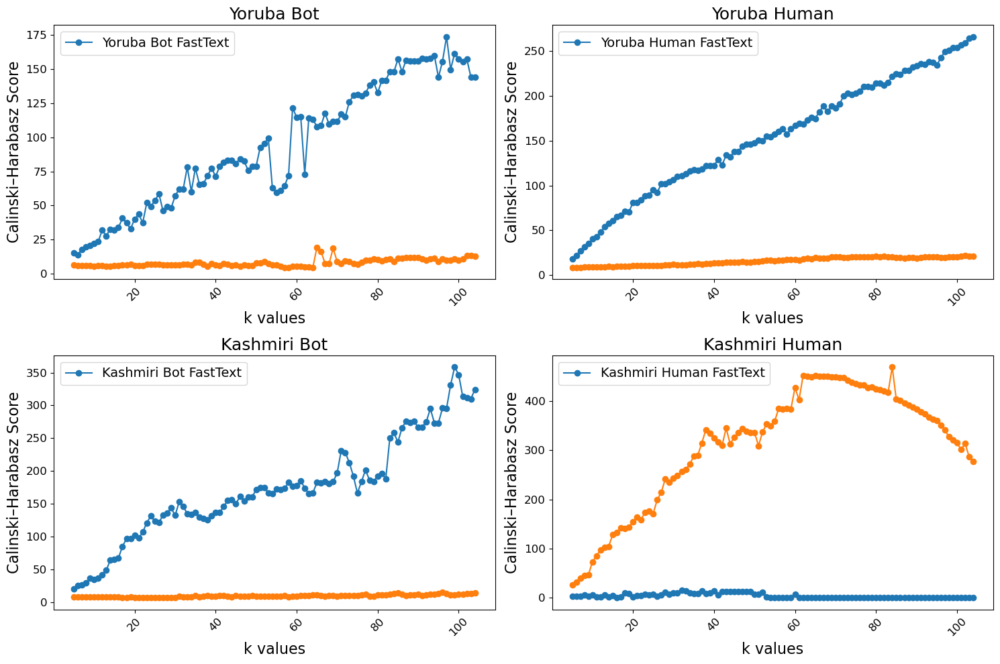

Best k values for each dataset:
Yoruba Bot Word2Vec: 97
Yoruba Human Word2Vec: 104
Kashmiri Bot Word2Vec: 99
Kashmiri Human Word2Vec: 32
Yoruba Bot FastText: 65
Yoruba Human FastText: 102
Kashmiri Bot FastText: 96
Kashmiri Human FastText: 84


In [30]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from sklearn.metrics import calinski_harabasz_score
# from your clustering module import Wishart

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.flatten()
best_k_values = []

for idx, (lang_type, vectors) in enumerate(datasets.items()):
    k_values = range(5, 105)
    ch_scores = []
    max_ch_score = 0
    best_k = 0

    for k in tqdm(k_values, desc=f"Processing {lang_type}"):
        wishart = Wishart(wishart_neighbors=k, significance_level=k_h_values[lang_type]['h'])
        labels = wishart.fit(vectors)
        if np.unique(labels).size > 1:
            ch_score = calinski_harabasz_score(vectors, labels)
            ch_scores.append(ch_score)
            if ch_score > max_ch_score:
                max_ch_score = ch_score
                best_k = k
        else:
            ch_scores.append(0)

    best_k_values.append(best_k)

    # Determine subplot index
    if 'Yoruba' in lang_type:
        plot_index = 0 if 'Bot' in lang_type else 1
    else:
        plot_index = 2 if 'Bot' in lang_type else 3

    ax = axs[plot_index]
    ax.plot(k_values, ch_scores, marker='o', linestyle='-')
    ax.set_title(f'{languages[plot_index // 2]} {types[plot_index % 2]}', fontsize=18)
    ax.set_xlabel('k values', fontsize=16)
    ax.set_ylabel('Calinski–Harabasz Score', fontsize=16)
    ax.tick_params(axis='x', labelrotation=45, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend([lang_type], fontsize=14)

plt.tight_layout()
plt.show()

print("Best k values for each dataset:")
for name, k in zip(datasets, best_k_values):
    print(f"{name}: {k}")

# Visualizations

## T-SNE Visualization technique implementation

In [31]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np

# Function to find representative n-grams for each cluster
def find_representative_ngrams(ngrams, vectors, labels):
    # Check for out of bounds label indices
    if np.any(labels >= len(vectors)):
        raise ValueError("Label index exceeds vector bounds")

    unique_labels = np.unique(labels)
    representative_ngrams = {}

    for label in unique_labels:
        cluster_indices = np.where(labels == label)[0]
        if cluster_indices.size == 0:
            continue
        cluster_vectors = vectors[cluster_indices]
        cluster_center = np.mean(cluster_vectors, axis=0)
        distances = euclidean_distances(cluster_vectors, [cluster_center])
        min_index = np.argmin(distances)
        representative_ngram = ngrams[cluster_indices[min_index]]
        representative_ngrams[label] = representative_ngram

    return representative_ngrams
    

# lists of ngrams and vectors for each dataset
ngrams_lists = [ngrams_yoruba_bot_wv, ngrams_yoruba_human_wv, ngrams_kashmiri_bot_wv, ngrams_kashmiri_human_wv,
                ngrams_yoruba_bot_ft, ngrams_yoruba_human_ft, ngrams_kashmiri_bot_ft, ngrams_kashmiri_human_ft]

vectors_lists = [vectors_yoruba_bot_wv, vectors_yoruba_human_wv, vectors_kashmiri_bot_wv, vectors_kashmiri_human_wv,
                 vectors_yoruba_bot_ft, vectors_yoruba_human_ft, vectors_kashmiri_bot_ft, vectors_kashmiri_human_ft]


# list of all labels for easy iteration
label_sets = [labels_yoruba_bot_wv, labels_yoruba_human_wv, labels_kashmiri_bot_wv, labels_kashmiri_human_wv,
              labels_yoruba_bot_ft, labels_yoruba_human_ft, labels_kashmiri_bot_ft, labels_kashmiri_human_ft]

titles = ["Yoruba Bot W2V", "Yoruba Human W2V", "Kashmiri Bot W2V", "Kashmiri Human W2V",
          "Yoruba Bot FT", "Yoruba Human FT", "Kashmiri Bot FT", "Kashmiri Human FT"]

In [32]:
for i, (labels, vectors) in enumerate(zip(label_sets, vectors_lists)):
    print(f"Dataset {i+1} ({titles[i]}):")
    print(f"  Vectors shape: {vectors.shape}")
    print(f"  Labels length: {len(labels)}")
    if len(labels) != len(vectors):
        print("  WARNING: Mismatch between vectors and labels!")

Dataset 1 (Yoruba Bot W2V):
  Vectors shape: (16865, 30)
  Labels length: 16865
Dataset 2 (Yoruba Human W2V):
  Vectors shape: (526128, 30)
  Labels length: 526128
Dataset 3 (Kashmiri Bot W2V):
  Vectors shape: (20033, 30)
  Labels length: 20033
Dataset 4 (Kashmiri Human W2V):
  Vectors shape: (55290, 30)
  Labels length: 55290
Dataset 5 (Yoruba Bot FT):
  Vectors shape: (16865, 30)
  Labels length: 16865
Dataset 6 (Yoruba Human FT):
  Vectors shape: (526128, 30)
  Labels length: 526128
Dataset 7 (Kashmiri Bot FT):
  Vectors shape: (20033, 30)
  Labels length: 16865
Dataset 8 (Kashmiri Human FT):
  Vectors shape: (55290, 30)
  Labels length: 526128


/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
python(77151) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/

Adjusting dataset 7 (Kashmiri Bot FT): using first 16865 elements


/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Adjusting dataset 8 (Kashmiri Human FT): using first 55290 elements


/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


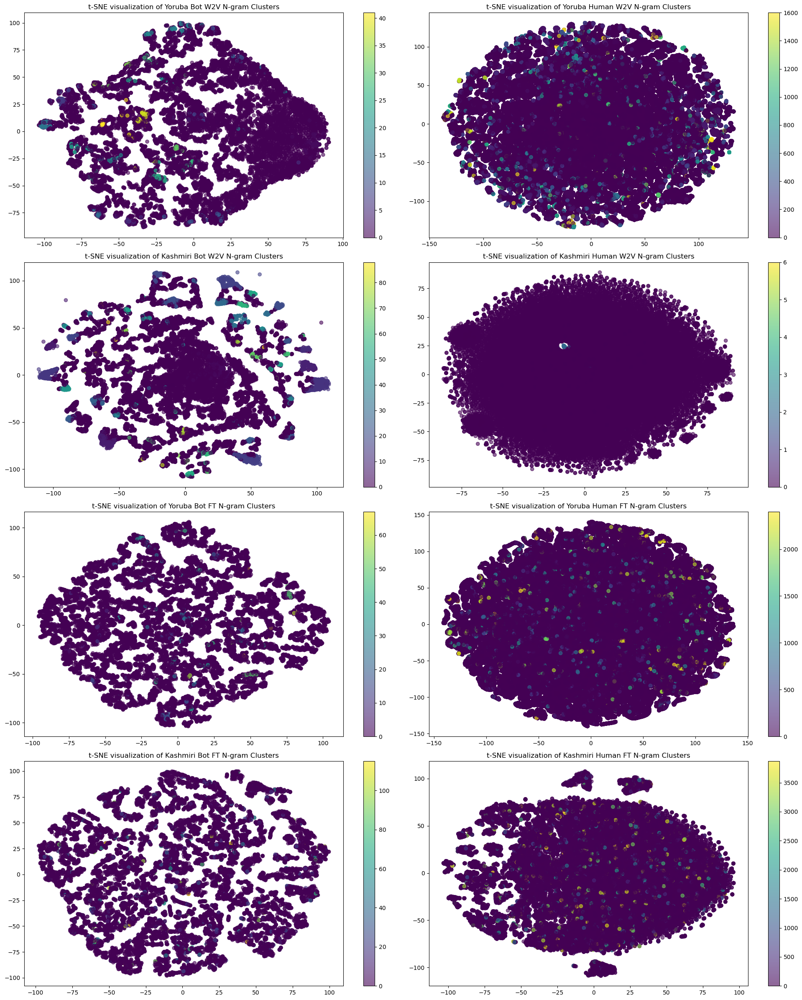

In [33]:
plt.figure(figsize=(20, 24))
for i, (labels, vectors, ngrams) in enumerate(zip(label_sets, vectors_lists, ngrams_lists), 1):
    plt.subplot(4, 2, i)
    
    # Check for length mismatch
    if len(labels) != len(vectors):
        min_length = min(len(labels), len(vectors))
        print(f"Adjusting dataset {i} ({titles[i-1]}): using first {min_length} elements")
        labels = labels[:min_length]
        vectors = vectors[:min_length]
        ngrams = ngrams[:min_length]
    
    # Your existing checks and processing
    if max(labels) >= len(vectors):
        print(f"Skipping dataset {i} due to label index exceeding vector bounds.")
        continue
        
    # Rest of your code remains the same
    rep_ngrams = find_representative_ngrams(ngrams, vectors, labels)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=1000)
    tsne_results = tsne.fit_transform(vectors)
    
    scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    
    plt.title(f't-SNE visualization of {titles[i-1]} N-gram Clusters')

plt.tight_layout()
plt.show()

/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/Users/farhananoor/anaconda3/envs/nlp_env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to '

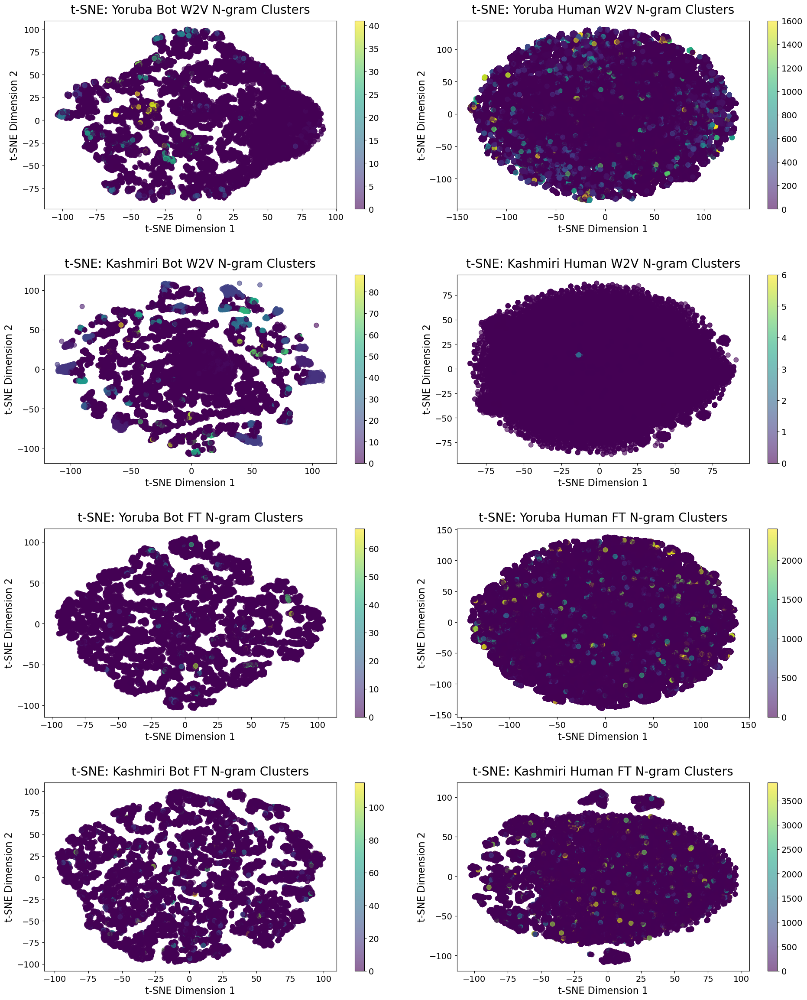

In [43]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

plt.figure(figsize=(20, 24))
for i, (labels, vectors, ngrams) in enumerate(zip(label_sets, vectors_lists, ngrams_lists), 1):
    ax = plt.subplot(4, 2, i)
    
    # Ensure all lists are the same length
    min_len = min(len(labels), len(vectors), len(ngrams))
    if len(labels) != min_len or len(vectors) != min_len:
        labels = labels[:min_len]
        vectors = vectors[:min_len]
        ngrams = ngrams[:min_len]
    
    # Skip if labels index out of range
    if max(labels) >= len(vectors):
        continue
        
    rep_ngrams = find_representative_ngrams(ngrams, vectors, labels)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
    tsne_results = tsne.fit_transform(vectors)
    
    scatter = ax.scatter(
        tsne_results[:, 0],
        tsne_results[:, 1],
        c=labels,
        cmap='viridis',
        alpha=0.6,
        s=60
    )
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.ax.tick_params(labelsize=14)       # colorbar tick labels
    
    # Title and axis labels with larger font
    ax.set_title(f't-SNE: {titles[i-1]} N-gram Clusters', fontsize=20, pad=12)
    ax.set_xlabel('t-SNE Dimension 1', fontsize=16)
    ax.set_ylabel('t-SNE Dimension 2', fontsize=16)
    
    # Increase tick label size
    ax.tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout(pad=4.0)
plt.show()

## PCA

In [35]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming you have lists of vectors for each dataset
vectors_lists = [vectors_yoruba_bot_wv, vectors_yoruba_human_wv, vectors_kashmiri_bot_wv, vectors_kashmiri_human_wv,
                 vectors_yoruba_bot_ft, vectors_yoruba_human_ft, vectors_kashmiri_bot_ft, vectors_kashmiri_human_ft]


# list of all labels for easy iteration
label_sets = [labels_yoruba_bot_wv, labels_yoruba_human_wv, labels_kashmiri_bot_wv, labels_kashmiri_human_wv,
              labels_yoruba_bot_ft, labels_yoruba_human_ft, labels_kashmiri_bot_ft, labels_kashmiri_human_ft]

titles = ["Yoruba Bot W2V", "Yoruba Human W2V", "Kashmiri Bot W2V", "Kashmiri Human W2V",
          "Yoruba Bot FT", "Yoruba Human FT", "Kashmiri Bot FT", "Kashmiri Human FT"]


# plt.figure(figsize=(20, 24))
# for i, (vectors, labels) in enumerate(zip(vectors_lists, label_sets), 1):
#     plt.subplot(4, 2, i)
#     pca = PCA(n_components=2)
#     reduced_vectors = pca.fit_transform(vectors)

#     scatter = plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], c=labels, cmap='viridis', alpha=0.6)
#     plt.colorbar(scatter)
#     plt.title(f'PCA Visualization of {titles[i-1]} N-grams')
#     plt.xlabel('PCA Component 1')
#     plt.ylabel('PCA Component 2')

# plt.tight_layout()
# plt.show()

In [36]:
for i, (labels, vectors, ngrams) in enumerate(zip(label_sets, vectors_lists, ngrams_lists)):
    print(f"Dataset {i+1} ({titles[i]}):")
    print(f"  Vectors shape: {vectors.shape}")
    print(f"  Labels length: {len(labels)}")
    print(f"  Ngrams length: {len(ngrams)}")
    if len(labels) != len(vectors):
        print("  WARNING: Mismatch between vectors and labels!")

Dataset 1 (Yoruba Bot W2V):
  Vectors shape: (16865, 30)
  Labels length: 16865
  Ngrams length: 16865
Dataset 2 (Yoruba Human W2V):
  Vectors shape: (526128, 30)
  Labels length: 526128
  Ngrams length: 526128
Dataset 3 (Kashmiri Bot W2V):
  Vectors shape: (20033, 30)
  Labels length: 20033
  Ngrams length: 20033
Dataset 4 (Kashmiri Human W2V):
  Vectors shape: (55290, 30)
  Labels length: 55290
  Ngrams length: 55290
Dataset 5 (Yoruba Bot FT):
  Vectors shape: (16865, 30)
  Labels length: 16865
  Ngrams length: 16865
Dataset 6 (Yoruba Human FT):
  Vectors shape: (526128, 30)
  Labels length: 526128
  Ngrams length: 526128
Dataset 7 (Kashmiri Bot FT):
  Vectors shape: (20033, 30)
  Labels length: 16865
  Ngrams length: 20033
Dataset 8 (Kashmiri Human FT):
  Vectors shape: (55290, 30)
  Labels length: 526128
  Ngrams length: 55290


Adjusting dataset 7 (Kashmiri Bot FT): using first 16865 elements
Adjusting dataset 8 (Kashmiri Human FT): using first 55290 elements


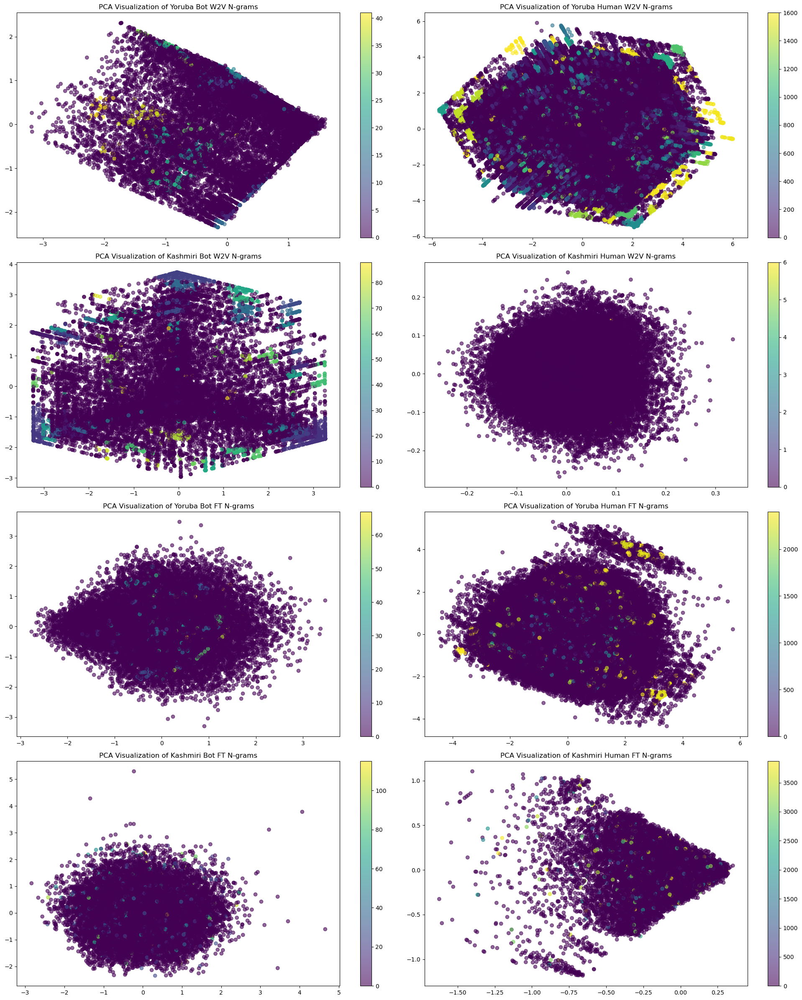

In [37]:
plt.figure(figsize=(20, 24))
for i, (labels, vectors, ngrams) in enumerate(zip(label_sets, vectors_lists, ngrams_lists), 1):
    plt.subplot(4, 2, i)
    
    # Ensure all arrays have the same length
    min_length = min(len(labels), len(vectors), len(ngrams))
    if min_length != len(labels) or min_length != len(vectors) or min_length != len(ngrams):
        print(f"Adjusting dataset {i} ({titles[i-1]}): using first {min_length} elements")
        labels = labels[:min_length]
        vectors = vectors[:min_length]
        ngrams = ngrams[:min_length]
    
    # Check for label bounds
    if max(labels) >= len(vectors):
        print(f"Skipping dataset {i} due to label index exceeding vector bounds.")
        continue
        
    # Perform dimensionality reduction
    pca = PCA(n_components=2)
    reduced_vectors = pca.fit_transform(vectors)
    
    # Plot with consistent lengths
    scatter = plt.scatter(
        reduced_vectors[:, 0], 
        reduced_vectors[:, 1], 
        c=labels, 
        cmap='viridis', 
        alpha=0.6
    )
    plt.colorbar(scatter)
    plt.title(f'PCA Visualization of {titles[i-1]} N-grams')

plt.tight_layout()
plt.show()

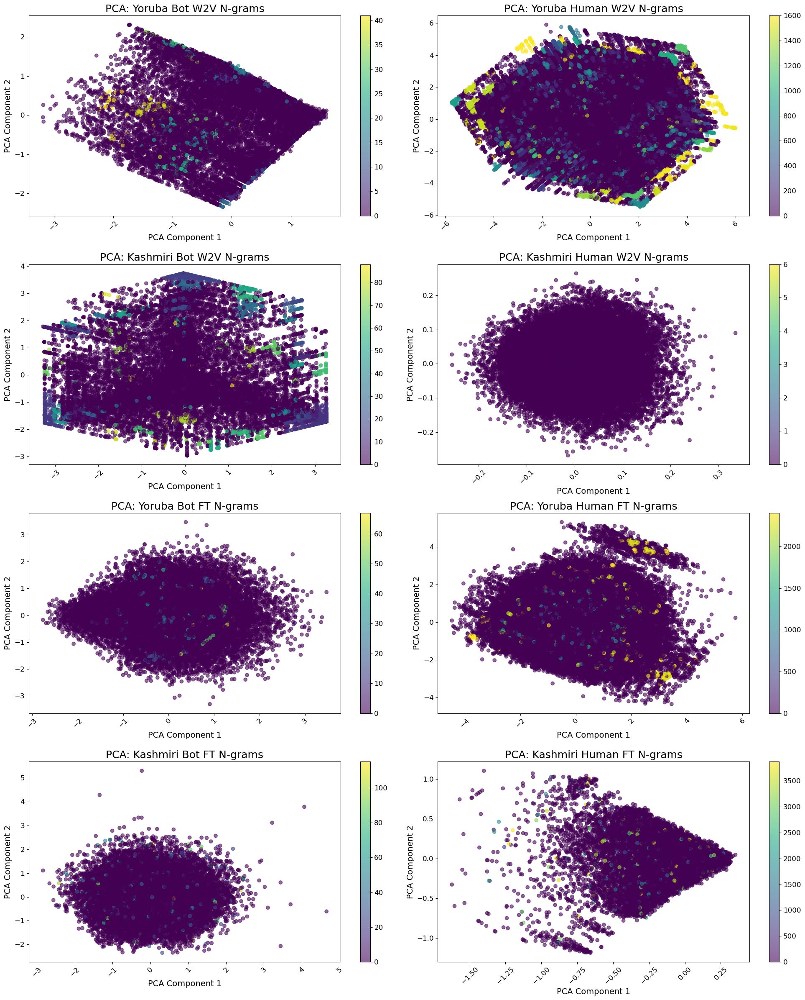

In [38]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

plt.figure(figsize=(20, 24))

for i, (labels, vectors, ngrams) in enumerate(zip(label_sets, vectors_lists, ngrams_lists), 1):
    ax = plt.subplot(4, 2, i)
    
    # Ensure all arrays have the same length
    min_length = min(len(labels), len(vectors), len(ngrams))
    if min_length != len(labels) or min_length != len(vectors) or min_length != len(ngrams):
        labels = labels[:min_length]
        vectors = vectors[:min_length]
        ngrams = ngrams[:min_length]
    
    # Skip if labels out of bounds
    if max(labels) >= len(vectors):
        continue
    
    # Dimensionality reduction
    pca = PCA(n_components=2, random_state=42)
    reduced_vectors = pca.fit_transform(vectors)
    
    # Scatter plot
    scatter = ax.scatter(
        reduced_vectors[:, 0],
        reduced_vectors[:, 1],
        c=labels,
        cmap='viridis',
        alpha=0.6
    )
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.ax.tick_params(labelsize=12)
    
    # Font-size adjustments
    ax.set_title(f'PCA: {titles[i-1]} N-grams', fontsize=18)
    ax.set_xlabel('PCA Component 1', fontsize=14)
    ax.set_ylabel('PCA Component 2', fontsize=14)
    ax.tick_params(axis='x', labelrotation=45, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()

## Entropy-Complexity Plane Implementation

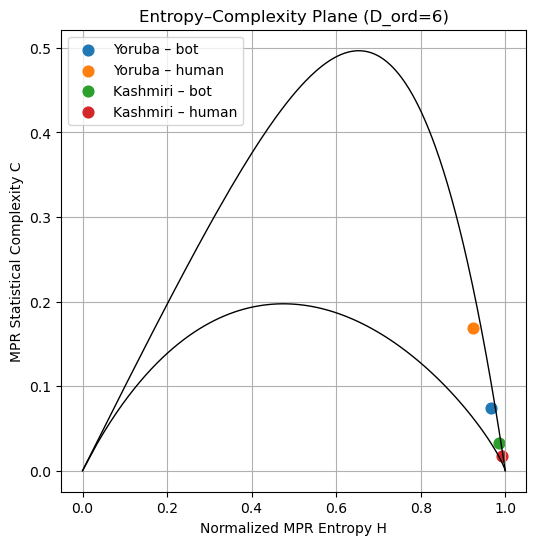

Entropy & Complexity values:
  • Yoruba – bot         → H = 0.967,  C = 0.074
  • Yoruba – human       → H = 0.923,  C = 0.169
  • Kashmiri – bot       → H = 0.986,  C = 0.032
  • Kashmiri – human     → H = 0.993,  C = 0.018


In [41]:
# ─────────────────────────────────────────────────────────────────────────────
# 1. Imports and helper
# ─────────────────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition       import TruncatedSVD
import entropy_complexity         # your module from entropy_complexity.py
# ─────────────────────────────────────────────────────────────────────────────
# 2. Load your four corpora (each a list of words) —
#    e.g. if you saved them as .npy or .txt files, or already have them
# ─────────────────────────────────────────────────────────────────────────────
# Example if they’re in .npy:
# processed_yoruba_bot     = np.load('processed_yoruba_bot.npy',    allow_pickle=True).tolist()
# processed_yoruba_human   = np.load('processed_yoruba_human.npy',  allow_pickle=True).tolist()
# processed_kashmiri_bot   = np.load('processed_kashmiri_bot.npy',  allow_pickle=True).tolist()
# processed_kashmiri_human = np.load('processed_kashmiri_human.npy',allow_pickle=True).tolist()

# Or if you already have them as Python lists in your Colab session, just skip to step 3.

datasets = {
    'Yoruba – bot':     processed_yoruba_bot,
    'Yoruba – human':   processed_yoruba_human,
    'Kashmiri – bot':   processed_kashmiri_bot,
    'Kashmiri – human': processed_kashmiri_human,
}

# ─────────────────────────────────────────────────────────────────────────────
# 3. Build a joint TF-IDF “context” over all four corpora
#    Treat each corpus as one “document” so that every word has a TF-IDF weight.
# ─────────────────────────────────────────────────────────────────────────────
vectorizer = TfidfVectorizer(
    analyzer='word',
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",
    max_features=None
)
# join each list back into space-joined string
docs = [" ".join(words) for words in datasets.values()]
X_tfidf = vectorizer.fit_transform(docs)           # shape = (4 × V)
vocab   = vectorizer.get_feature_names_out()       # V words

# ─────────────────────────────────────────────────────────────────────────────
# 4. Perform SVD to get a semantic embedding for each vocabulary term
#    Choose embedding dimension d_semantic (e.g. 8 or 16)
# ─────────────────────────────────────────────────────────────────────────────
# ─────────────────────────────────────────────────────────────────────────────
# 4. Perform SVD to get a semantic embedding for each vocabulary term
#    **NOTE**: with only 4 “documents”, n_components ≤ 4
# 4. Perform SVD to get a semantic embedding for each vocabulary term
#    **n_components ≤ number of docs (4)**
d_semantic = 4
svd = TruncatedSVD(n_components=d_semantic, random_state=42)
# Fit *and* transform the vocab-space matrix (V rows × 4 cols)  
word_embeddings = svd.fit_transform(X_tfidf.T)  
#   → word_embeddings.shape == (V, d_semantic)



# map each vocabulary word to its embedding index
word2idx = { w:i for i,w in enumerate(vocab) }

# ─────────────────────────────────────────────────────────────────────────────
# 5. For each corpus, build its **semantic trajectory**:
#    replace each token by its embedding vector, then extract one component.
#    (Here we take the **first** semantic dimension to get a 1D series.)
# ─────────────────────────────────────────────────────────────────────────────
series = {}
for name, tokens in datasets.items():
    # lookup each token; if OOV, skip it
    emb_seq = []
    for tok in tokens:
        idx = word2idx.get(tok)
        if idx is not None:
            emb_seq.append(word_embeddings[idx, 0])  # first semantic dimension
    series[name] = np.array(emb_seq)

# ─────────────────────────────────────────────────────────────────────────────
# 6. Compute entropy H and complexity C for each series
#    using embedding-length D_ord = 6 (you can experiment with 4…8)
# ─────────────────────────────────────────────────────────────────────────────
D_ord = 6
ec = {}
for name, ts in series.items():
    H, C = entropy_complexity.entropy_complexity_time_series(ts, D_ord)
    ec[name] = (H, C)

# ─────────────────────────────────────────────────────────────────────────────
# 7. Load the precomputed 1D MPR “borders” for D_ord (from borders.npy)
# ─────────────────────────────────────────────────────────────────────────────
borders = np.load('borders.npy', allow_pickle=True).item()
lower, upper = borders[D_ord]

# ─────────────────────────────────────────────────────────────────────────────
# 8. Plot all four on the entropy–complexity plane
# ─────────────────────────────────────────────────────────────────────────────
plt.figure(figsize=(6,6))
plt.plot(lower[:,0], lower[:,1], 'k-', lw=1)
plt.plot(upper[:,0], upper[:,1], 'k-', lw=1)
for name,(H,C) in ec.items():
    plt.scatter(H, C, s=60, label=name)
plt.legend(loc='best')
plt.xlabel('Normalized MPR Entropy H')
plt.ylabel('MPR Statistical Complexity C')
plt.title(f'Entropy–Complexity Plane (D_ord={D_ord})')
plt.grid(True)
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 9. Print the numeric results
# ─────────────────────────────────────────────────────────────────────────────
print("Entropy & Complexity values:")
for name,(H,C) in ec.items():
    print(f"  • {name:20s} → H = {H:.3f},  C = {C:.3f}")

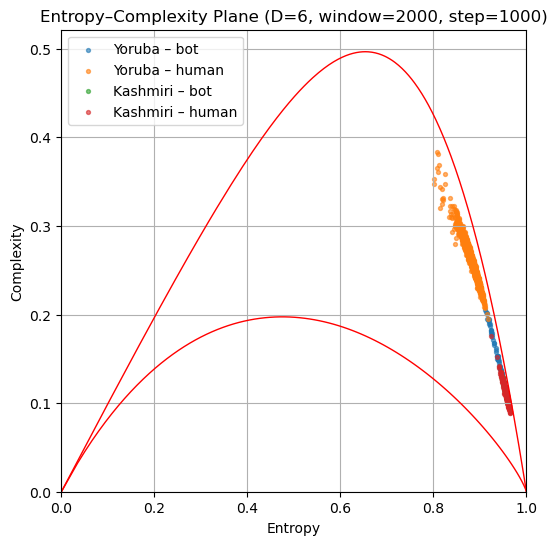

Entropy & Complexity values:
  • Yoruba – bot         → H = 0.967,  C = 0.074
  • Yoruba – human       → H = 0.923,  C = 0.169
  • Kashmiri – bot       → H = 0.986,  C = 0.032
  • Kashmiri – human     → H = 0.993,  C = 0.018


In [42]:
# ─────────────────────────────────────────────────────────────────────────────
# 1. Imports and helper
# ─────────────────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition       import TruncatedSVD
import entropy_complexity         # your module from entropy_complexity.py


# 2) Make sure you include all four lists in your “context”:
datasets = {
    'Yoruba – Bot':     processed_yoruba_bot,
    'Yoruba – Human':   processed_yoruba_human,
    'Kashmiri – Bot':   processed_kashmiri_bot,
    'Kashmiri – Human': processed_kashmiri_human,
}

# 3) Build TF–IDF on those four “documents”:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition       import TruncatedSVD

vectorizer = TfidfVectorizer(token_pattern=r"(?u)\b\w+\b")
docs       = [" ".join(tokens) for tokens in datasets.values()]
X_tfidf    = vectorizer.fit_transform(docs)    # shape = (4 × V)


# 4) Now you have 4 features (one per “doc”), so you can do an SVD up to 4dims:
d_semantic = 4    # ≤ number of docs
svd        = TruncatedSVD(n_components=d_semantic, random_state=42)
Wemb       = svd.fit_transform(X_tfidf.T)      # now shape = (V, 4)


# ——— 5. Sliding-window parameters ———
window_size = 2000   # or whatever makes sense (≥ factorial limits!)
step_size   = 1000


# ——— 6. Compute H,C on each window ———
D_ord = 6
all_HC = {}
for name, ts in series.items():
    HC = []
    for start in range(0, len(ts) - window_size + 1, step_size):
        seg = ts[start:start+window_size]
        H, C = entropy_complexity.entropy_complexity_time_series(seg, D_ord)
        HC.append((H,C))
    all_HC[name] = np.array(HC)


# ——— 7. Load theoretical borders for D_ord ———
borders = np.load('borders.npy', allow_pickle=True).item()[D_ord]
lower, upper = borders


# ——— 8. Plot the “cloud” just like your reference ———
plt.figure(figsize=(6,6))
plt.plot(lower[:,0], lower[:,1], 'r-', lw=1)
plt.plot(upper[:,0], upper[:,1], 'r-', lw=1)

for name, hc in all_HC.items():
    Hs, Cs = hc[:,0], hc[:,1]
    plt.scatter(Hs, Cs, s=8, alpha=0.6, label=name)

plt.xlabel('Entropy')
plt.ylabel('Complexity')
plt.title(f'Entropy–Complexity Plane (D={D_ord}, window={window_size}, step={step_size})')
plt.legend()
plt.grid(True)
plt.xlim(0,1)
plt.ylim(0, upper[:,1].max()*1.05)
plt.show()


# ─────────────────────────────────────────────────────────────────────────────
# 9. Print the numeric results
# ─────────────────────────────────────────────────────────────────────────────
print("Entropy & Complexity values:")
for name,(H,C) in ec.items():
    print(f"  • {name:20s} → H = {H:.3f},  C = {C:.3f}")